In [1]:
# ✅ We use LPIPS for perceptual similarity, and FaceNet for identity loss.
!pip install lpips
!pip install facenet-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12

In [1]:
# ✅ Standard PyTorch and image processing libraries
import torch
import torch.nn as nn
import torchvision.transforms as T
from torchvision.models import vgg16
from facenet_pytorch import InceptionResnetV1
from PIL import Image, ImageFilter
import lpips
import os
from tqdm import tqdm
import matplotlib.pyplot as plt


## 🔍 Self-Supervised Learning (SSL) for Super-Resolution
This notebook trains a face super-resolution model using **self-supervised learning (SSL)**.

- We do **not** use external labels or HR-LR image pairs.
- We generate **synthetic low-resolution (LR)** images by downsampling the original image.
- The model learns to restore the **original image** from this degraded version.

🔁 This is a **pretext task** — a common SSL strategy where the model learns by solving an artificial problem we construct.

This mimics the **MNTSR** philosophy (learning nonlinear feature transformations and upsampling), adapted for faces.


In [ ]:
# Version 1 - was a little too easy
def degrade(img, scale=2):
    if isinstance(img, torch.Tensor):
        img = T.ToPILImage()(img.cpu())
    w, h = img.size
    lr = img.resize((w // scale, h // scale), Image.BICUBIC)
    restored = lr.resize((w, h), Image.BICUBIC)
    return T.ToTensor()(restored)

In [ ]:
# Version 2 - noise, heavy blur
def degrade(img, scale=4):
    if isinstance(img, torch.Tensor):
        img = T.ToPILImage()(img.cpu())

    # Downsample
    w, h = img.size
    img = img.resize((w // scale, h // scale), Image.BICUBIC)

    # Add Gaussian blur
    img = img.filter(ImageFilter.GaussianBlur(radius=1.2))

    # Add Gaussian noise
    img_tensor = T.ToTensor()(img)
    noise = torch.randn_like(img_tensor) * 0.05
    noisy = (img_tensor + noise).clamp(0, 1)

    # Upsample back to original size
    degraded = T.ToPILImage()(noisy).resize((w, h), Image.BICUBIC)

    return T.ToTensor()(degraded)


In [ ]:
# Version 3 - no noise, lighter blur.
def degrade(img, scale=4):
    if isinstance(img, torch.Tensor):
        img = T.ToPILImage()(img.cpu())

    w, h = img.size
    down_w, down_h = max(w // scale, 16), max(h // scale, 16)

    # Step 1: Downscale
    img = img.resize((down_w, down_h), Image.BICUBIC)

    # Step 2: Light blur
    img = img.filter(ImageFilter.GaussianBlur(radius=0.8))

    # Step 3: Upscale back
    img = img.resize((w, h), Image.BICUBIC)

    # Step 4: Convert to tensor
    return T.ToTensor()(img)

In [2]:
# Version 4 -
# Randomized blur degradation: Gaussian, Motion, Defocus, or None
import random

def degrade(img, scale=4):
    """
    Degrades an image by downscaling, optionally applying a random blur type, then upscaling.
    Blur types: None, Gaussian, Motion, Defocus.
    """
    # Convert tensor → PIL if needed
    if isinstance(img, torch.Tensor):
        img = T.ToPILImage()(img.cpu())

    w, h = img.size
    down_w, down_h = max(w // scale, 16), max(h // scale, 16)

    # Step 1: Downscale
    img = img.resize((down_w, down_h), Image.BICUBIC)

    # Step 2: Apply random blur
    blur_type = random.choice(["none", "gaussian", "motion", "defocus"])

    if blur_type == "gaussian":
        radius = random.uniform(0.5, 1.0)
        img = img.filter(ImageFilter.GaussianBlur(radius=radius))

    elif blur_type == "motion":
        length = random.randint(5, 10)
        angle = random.choice([0, 45, 90, 135])
        img_np = np.array(img).astype(np.float32)

        kernel = np.zeros((length, length), dtype=np.float32)
        if angle in [0, 180]:
            kernel[length//2, :] = 1.0
        elif angle in [90, 270]:
            kernel[:, length//2] = 1.0
        else:
            np.fill_diagonal(kernel, 1.0)
        kernel /= kernel.sum()

        from scipy.signal import convolve2d
        for c in range(3):
            img_np[..., c] = convolve2d(img_np[..., c], kernel, mode='same', boundary='symm')
        img = Image.fromarray(np.uint8(np.clip(img_np, 0, 255)))

    elif blur_type == "defocus":
        radius = random.uniform(2.0, 3.0)
        img = img.filter(ImageFilter.GaussianBlur(radius=radius))

    # "none" → skip blur entirely

    # Step 3: Upscale back
    img = img.resize((w, h), Image.BICUBIC)

    # Step 4: Convert to tensor
    return T.ToTensor()(img)


In [3]:
# ✅ This includes shallow feature extraction, SR blocks, and upsampling (inspired by MNTSR)
class SRBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels, in_channels, 3, padding=1),
        )
    def forward(self, x):
        return x + self.net(x)

class SimpleMNTSR(nn.Module):
    def __init__(self):
        super().__init__()
        self.head = nn.Conv2d(3, 64, 3, padding=1)  # Shallow feature extractor
        self.body = nn.Sequential(*[SRBlock(64) for _ in range(5)])  # SR blocks (nonlinear transformation)
        self.upsample = nn.Sequential(
            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 3, 3, padding=1)  # Final image generation
        )
    def forward(self, x):
        x = self.head(x)
        x = self.body(x)
        x = self.upsample(x)
        return x

In [4]:
# ✅ These losses compare model output to original image — enabling self-supervised learning
class Losses:
    def __init__(self, device):
        self.mse = nn.MSELoss()
        self.perc_net = vgg16(pretrained=True).features[:16].eval().to(device)
        for p in self.perc_net.parameters(): p.requires_grad = False
        self.id_net = InceptionResnetV1(pretrained='vggface2').eval().to(device)
        for p in self.id_net.parameters(): p.requires_grad = False
        self.lpips = lpips.LPIPS(net='alex').to(device)

    def perceptual(self, x, y):
        fx = self.perc_net(x)
        fy = self.perc_net(y)
        return self.mse(fx, fy)

    def identity(self, x, y):
        fx = self.id_net(x)
        fy = self.id_net(y)
        return 1 - torch.cosine_similarity(fx, fy).mean()

    def lpips_loss(self, x, y):
        return self.lpips(x, y).mean()

In [5]:
# ✅ This dataset assumes all images are unlabeled. LR is generated via degradation.
from torch.utils.data import Dataset, DataLoader
class FaceDataset(Dataset):
    def __init__(self, folder):
        self.paths = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.jpg')]
        self.tf = T.Compose([
            T.Resize((256, 256)),
            T.CenterCrop(256),
            T.ToTensor()
        ])

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        hr = self.tf(img)
        lr = degrade(hr)  # SSL: we generate the LR input here
        return lr, hr

    def __len__(self):
        return len(self.paths)

In [6]:
# ✅ The model learns to recover HR from degraded LR — purely self-supervised
def train(model, loader, losses, device):
    model.train()
    opt = torch.optim.Adam(model.parameters(), lr=1e-4)

    for epoch in range(3):  # keep small for demo
        total_loss = 0
        for lr, hr in tqdm(loader):
            lr, hr = lr.to(device), hr.to(device)

            sr = model(lr)
            loss_recon = losses.mse(sr, hr)
            loss_perc = losses.perceptual(sr, hr)
            loss_id = losses.identity(sr, hr)
            loss_lp = losses.lpips_loss(sr, hr)

            loss = loss_recon + 0.1 * loss_perc + 0.1 * loss_id + 0.1 * loss_lp

            opt.zero_grad()
            loss.backward()
            opt.step()
            total_loss += loss.item()
            print(f"Epoch {epoch+1}, Loss: {total_loss / len(loader):.4f}")

        print(f"Epoch {epoch+1}, Loss: {total_loss / len(loader):.4f}")

In [7]:
# ✅ Visual check: shows the degraded input, SR output, and original image
def visualize(model, dataset, device):
    model.eval()
    with torch.no_grad():
        lr, hr = dataset[0]
        sr = model(lr.unsqueeze(0).to(device)).squeeze().cpu()

        fig, ax = plt.subplots(1, 3, figsize=(12, 4))
        ax[0].imshow(lr.permute(1, 2, 0))
        ax[0].set_title("LR Input")
        ax[1].imshow(sr.permute(1, 2, 0).clamp(0, 1))
        ax[1].set_title("SR Output")
        ax[2].imshow(hr.permute(1, 2, 0))
        ax[2].set_title("HR Ground Truth")
        for a in ax: a.axis('off')
        plt.show()

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 1/625 [00:08<1:24:35,  8.13s/it]

Epoch 1, Loss: 0.0009


  0%|          | 2/625 [00:14<1:13:40,  7.10s/it]

Epoch 1, Loss: 0.0017


  0%|          | 3/625 [00:20<1:10:32,  6.81s/it]

Epoch 1, Loss: 0.0027


  1%|          | 4/625 [00:27<1:08:33,  6.62s/it]

Epoch 1, Loss: 0.0035


  1%|          | 5/625 [00:33<1:06:12,  6.41s/it]

Epoch 1, Loss: 0.0043


  1%|          | 6/625 [00:39<1:06:46,  6.47s/it]

Epoch 1, Loss: 0.0051


  1%|          | 7/625 [00:46<1:06:14,  6.43s/it]

Epoch 1, Loss: 0.0058


  1%|▏         | 8/625 [00:53<1:07:08,  6.53s/it]

Epoch 1, Loss: 0.0063


  1%|▏         | 9/625 [00:59<1:07:27,  6.57s/it]

Epoch 1, Loss: 0.0069


  2%|▏         | 10/625 [01:05<1:06:31,  6.49s/it]

Epoch 1, Loss: 0.0075


  2%|▏         | 11/625 [01:14<1:11:19,  6.97s/it]

Epoch 1, Loss: 0.0080


  2%|▏         | 12/625 [01:21<1:11:46,  7.03s/it]

Epoch 1, Loss: 0.0085


  2%|▏         | 13/625 [01:27<1:09:43,  6.84s/it]

Epoch 1, Loss: 0.0089


  2%|▏         | 14/625 [01:34<1:09:36,  6.84s/it]

Epoch 1, Loss: 0.0095


  2%|▏         | 15/625 [01:41<1:09:06,  6.80s/it]

Epoch 1, Loss: 0.0099


  3%|▎         | 16/625 [01:48<1:09:27,  6.84s/it]

Epoch 1, Loss: 0.0104


  3%|▎         | 17/625 [01:54<1:07:30,  6.66s/it]

Epoch 1, Loss: 0.0109


  3%|▎         | 18/625 [02:01<1:08:43,  6.79s/it]

Epoch 1, Loss: 0.0115


  3%|▎         | 19/625 [02:07<1:06:58,  6.63s/it]

Epoch 1, Loss: 0.0120


  3%|▎         | 20/625 [02:14<1:05:54,  6.54s/it]

Epoch 1, Loss: 0.0125


  3%|▎         | 21/625 [02:20<1:05:31,  6.51s/it]

Epoch 1, Loss: 0.0129


  4%|▎         | 22/625 [02:27<1:06:40,  6.63s/it]

Epoch 1, Loss: 0.0134


  4%|▎         | 23/625 [02:34<1:07:07,  6.69s/it]

Epoch 1, Loss: 0.0139


  4%|▍         | 24/625 [02:40<1:06:37,  6.65s/it]

Epoch 1, Loss: 0.0144


  4%|▍         | 25/625 [02:47<1:06:25,  6.64s/it]

Epoch 1, Loss: 0.0148


  4%|▍         | 26/625 [02:54<1:08:04,  6.82s/it]

Epoch 1, Loss: 0.0152


  4%|▍         | 27/625 [03:00<1:05:55,  6.61s/it]

Epoch 1, Loss: 0.0157


  4%|▍         | 28/625 [03:07<1:07:20,  6.77s/it]

Epoch 1, Loss: 0.0161


  5%|▍         | 29/625 [03:14<1:08:15,  6.87s/it]

Epoch 1, Loss: 0.0166


  5%|▍         | 30/625 [03:21<1:07:26,  6.80s/it]

Epoch 1, Loss: 0.0170


  5%|▍         | 31/625 [03:28<1:06:50,  6.75s/it]

Epoch 1, Loss: 0.0175


  5%|▌         | 32/625 [03:34<1:04:02,  6.48s/it]

Epoch 1, Loss: 0.0179


  5%|▌         | 33/625 [03:41<1:05:30,  6.64s/it]

Epoch 1, Loss: 0.0184


  5%|▌         | 34/625 [03:47<1:05:59,  6.70s/it]

Epoch 1, Loss: 0.0188


  6%|▌         | 35/625 [03:54<1:06:41,  6.78s/it]

Epoch 1, Loss: 0.0192


  6%|▌         | 36/625 [04:01<1:05:40,  6.69s/it]

Epoch 1, Loss: 0.0196


  6%|▌         | 37/625 [04:07<1:04:19,  6.56s/it]

Epoch 1, Loss: 0.0200


  6%|▌         | 38/625 [04:14<1:03:44,  6.52s/it]

Epoch 1, Loss: 0.0203


  6%|▌         | 39/625 [04:20<1:03:56,  6.55s/it]

Epoch 1, Loss: 0.0209


  6%|▋         | 40/625 [04:27<1:04:03,  6.57s/it]

Epoch 1, Loss: 0.0214


  7%|▋         | 41/625 [04:34<1:04:18,  6.61s/it]

Epoch 1, Loss: 0.0218


  7%|▋         | 42/625 [04:40<1:04:31,  6.64s/it]

Epoch 1, Loss: 0.0223


  7%|▋         | 43/625 [04:50<1:12:53,  7.51s/it]

Epoch 1, Loss: 0.0226


  7%|▋         | 44/625 [04:56<1:09:48,  7.21s/it]

Epoch 1, Loss: 0.0230


  7%|▋         | 45/625 [05:03<1:07:10,  6.95s/it]

Epoch 1, Loss: 0.0233


  7%|▋         | 46/625 [05:09<1:04:49,  6.72s/it]

Epoch 1, Loss: 0.0238


  8%|▊         | 47/625 [05:16<1:04:59,  6.75s/it]

Epoch 1, Loss: 0.0241


  8%|▊         | 48/625 [05:23<1:07:19,  7.00s/it]

Epoch 1, Loss: 0.0245


  8%|▊         | 49/625 [05:30<1:06:20,  6.91s/it]

Epoch 1, Loss: 0.0250


  8%|▊         | 50/625 [05:36<1:04:08,  6.69s/it]

Epoch 1, Loss: 0.0253


  8%|▊         | 51/625 [05:42<1:02:28,  6.53s/it]

Epoch 1, Loss: 0.0257


  8%|▊         | 52/625 [05:49<1:02:10,  6.51s/it]

Epoch 1, Loss: 0.0261


  8%|▊         | 53/625 [05:55<1:01:18,  6.43s/it]

Epoch 1, Loss: 0.0266


  9%|▊         | 54/625 [06:01<1:01:13,  6.43s/it]

Epoch 1, Loss: 0.0269


  9%|▉         | 55/625 [06:08<1:02:26,  6.57s/it]

Epoch 1, Loss: 0.0272


  9%|▉         | 56/625 [06:15<1:03:34,  6.70s/it]

Epoch 1, Loss: 0.0277


  9%|▉         | 57/625 [06:21<1:01:42,  6.52s/it]

Epoch 1, Loss: 0.0282


  9%|▉         | 58/625 [06:28<1:02:09,  6.58s/it]

Epoch 1, Loss: 0.0286


  9%|▉         | 59/625 [06:34<1:01:32,  6.52s/it]

Epoch 1, Loss: 0.0290


 10%|▉         | 60/625 [06:41<1:02:03,  6.59s/it]

Epoch 1, Loss: 0.0294


 10%|▉         | 61/625 [06:48<1:01:29,  6.54s/it]

Epoch 1, Loss: 0.0298


 10%|▉         | 62/625 [06:54<1:01:13,  6.52s/it]

Epoch 1, Loss: 0.0302


 10%|█         | 63/625 [07:02<1:04:56,  6.93s/it]

Epoch 1, Loss: 0.0305


 10%|█         | 64/625 [07:09<1:05:19,  6.99s/it]

Epoch 1, Loss: 0.0309


 10%|█         | 65/625 [07:16<1:04:52,  6.95s/it]

Epoch 1, Loss: 0.0313


 11%|█         | 66/625 [07:23<1:04:39,  6.94s/it]

Epoch 1, Loss: 0.0317


 11%|█         | 67/625 [07:29<1:02:04,  6.67s/it]

Epoch 1, Loss: 0.0320


 11%|█         | 68/625 [07:36<1:02:33,  6.74s/it]

Epoch 1, Loss: 0.0324


 11%|█         | 69/625 [07:42<1:01:49,  6.67s/it]

Epoch 1, Loss: 0.0328


 11%|█         | 70/625 [07:49<1:01:13,  6.62s/it]

Epoch 1, Loss: 0.0331


 11%|█▏        | 71/625 [07:55<1:00:38,  6.57s/it]

Epoch 1, Loss: 0.0335


 12%|█▏        | 72/625 [08:02<59:37,  6.47s/it]  

Epoch 1, Loss: 0.0338


 12%|█▏        | 73/625 [08:08<1:00:24,  6.57s/it]

Epoch 1, Loss: 0.0342


 12%|█▏        | 74/625 [08:15<1:01:38,  6.71s/it]

Epoch 1, Loss: 0.0346


 12%|█▏        | 75/625 [08:22<1:00:45,  6.63s/it]

Epoch 1, Loss: 0.0350


 12%|█▏        | 76/625 [08:28<59:59,  6.56s/it]  

Epoch 1, Loss: 0.0353


 12%|█▏        | 77/625 [08:35<1:00:11,  6.59s/it]

Epoch 1, Loss: 0.0357


 12%|█▏        | 78/625 [08:41<59:08,  6.49s/it]  

Epoch 1, Loss: 0.0361


 13%|█▎        | 79/625 [08:48<59:57,  6.59s/it]

Epoch 1, Loss: 0.0365


 13%|█▎        | 80/625 [08:55<1:02:20,  6.86s/it]

Epoch 1, Loss: 0.0369


 13%|█▎        | 81/625 [09:03<1:03:04,  6.96s/it]

Epoch 1, Loss: 0.0371


 13%|█▎        | 82/625 [09:09<1:02:21,  6.89s/it]

Epoch 1, Loss: 0.0376


 13%|█▎        | 83/625 [09:16<1:01:16,  6.78s/it]

Epoch 1, Loss: 0.0379


 13%|█▎        | 84/625 [09:23<1:00:37,  6.72s/it]

Epoch 1, Loss: 0.0381


 14%|█▎        | 85/625 [09:29<1:00:26,  6.72s/it]

Epoch 1, Loss: 0.0384


 14%|█▍        | 86/625 [09:38<1:05:37,  7.31s/it]

Epoch 1, Loss: 0.0388


 14%|█▍        | 87/625 [09:44<1:03:08,  7.04s/it]

Epoch 1, Loss: 0.0390


 14%|█▍        | 88/625 [09:51<1:02:23,  6.97s/it]

Epoch 1, Loss: 0.0394


 14%|█▍        | 89/625 [09:58<1:02:25,  6.99s/it]

Epoch 1, Loss: 0.0398


 14%|█▍        | 90/625 [10:05<1:02:18,  6.99s/it]

Epoch 1, Loss: 0.0403


 15%|█▍        | 91/625 [10:11<59:56,  6.73s/it]  

Epoch 1, Loss: 0.0405


 15%|█▍        | 92/625 [10:18<1:00:44,  6.84s/it]

Epoch 1, Loss: 0.0408


 15%|█▍        | 93/625 [10:25<1:01:02,  6.88s/it]

Epoch 1, Loss: 0.0412


 15%|█▌        | 94/625 [10:32<59:28,  6.72s/it]  

Epoch 1, Loss: 0.0416


 15%|█▌        | 95/625 [10:38<57:59,  6.57s/it]

Epoch 1, Loss: 0.0419


 15%|█▌        | 96/625 [10:44<56:26,  6.40s/it]

Epoch 1, Loss: 0.0422


 16%|█▌        | 97/625 [10:50<55:35,  6.32s/it]

Epoch 1, Loss: 0.0425


 16%|█▌        | 98/625 [10:57<56:09,  6.39s/it]

Epoch 1, Loss: 0.0429


 16%|█▌        | 99/625 [11:03<56:17,  6.42s/it]

Epoch 1, Loss: 0.0432


 16%|█▌        | 100/625 [11:10<56:31,  6.46s/it]

Epoch 1, Loss: 0.0435


 16%|█▌        | 101/625 [11:16<56:42,  6.49s/it]

Epoch 1, Loss: 0.0438


 16%|█▋        | 102/625 [11:23<58:16,  6.68s/it]

Epoch 1, Loss: 0.0440


 16%|█▋        | 103/625 [11:30<58:33,  6.73s/it]

Epoch 1, Loss: 0.0445


 17%|█▋        | 104/625 [11:37<57:37,  6.64s/it]

Epoch 1, Loss: 0.0449


 17%|█▋        | 105/625 [11:43<56:52,  6.56s/it]

Epoch 1, Loss: 0.0453


 17%|█▋        | 106/625 [11:49<56:21,  6.51s/it]

Epoch 1, Loss: 0.0457


 17%|█▋        | 107/625 [11:56<56:28,  6.54s/it]

Epoch 1, Loss: 0.0461


 17%|█▋        | 108/625 [12:03<57:08,  6.63s/it]

Epoch 1, Loss: 0.0465


 17%|█▋        | 109/625 [12:10<58:35,  6.81s/it]

Epoch 1, Loss: 0.0469


 18%|█▊        | 110/625 [12:17<59:57,  6.98s/it]

Epoch 1, Loss: 0.0472


 18%|█▊        | 111/625 [12:24<59:25,  6.94s/it]

Epoch 1, Loss: 0.0477


 18%|█▊        | 112/625 [12:31<59:10,  6.92s/it]

Epoch 1, Loss: 0.0480


 18%|█▊        | 113/625 [12:38<59:11,  6.94s/it]

Epoch 1, Loss: 0.0485


 18%|█▊        | 114/625 [12:45<59:01,  6.93s/it]

Epoch 1, Loss: 0.0489


 18%|█▊        | 115/625 [12:52<57:59,  6.82s/it]

Epoch 1, Loss: 0.0493


 19%|█▊        | 116/625 [12:59<59:49,  7.05s/it]

Epoch 1, Loss: 0.0496


 19%|█▊        | 117/625 [13:06<58:42,  6.93s/it]

Epoch 1, Loss: 0.0500


 19%|█▉        | 118/625 [13:13<58:37,  6.94s/it]

Epoch 1, Loss: 0.0503


 19%|█▉        | 119/625 [13:20<57:49,  6.86s/it]

Epoch 1, Loss: 0.0506


 19%|█▉        | 120/625 [13:26<56:08,  6.67s/it]

Epoch 1, Loss: 0.0511


 19%|█▉        | 121/625 [13:32<56:00,  6.67s/it]

Epoch 1, Loss: 0.0515


 20%|█▉        | 122/625 [13:39<54:45,  6.53s/it]

Epoch 1, Loss: 0.0519


 20%|█▉        | 123/625 [13:45<54:22,  6.50s/it]

Epoch 1, Loss: 0.0523


 20%|█▉        | 124/625 [13:52<54:18,  6.50s/it]

Epoch 1, Loss: 0.0526


 20%|██        | 125/625 [13:58<55:10,  6.62s/it]

Epoch 1, Loss: 0.0530


 20%|██        | 126/625 [14:06<56:44,  6.82s/it]

Epoch 1, Loss: 0.0533


 20%|██        | 127/625 [14:13<56:45,  6.84s/it]

Epoch 1, Loss: 0.0538


 20%|██        | 128/625 [14:19<55:03,  6.65s/it]

Epoch 1, Loss: 0.0542


 21%|██        | 129/625 [14:25<54:04,  6.54s/it]

Epoch 1, Loss: 0.0544


 21%|██        | 130/625 [14:32<54:37,  6.62s/it]

Epoch 1, Loss: 0.0546


 21%|██        | 131/625 [14:38<54:07,  6.57s/it]

Epoch 1, Loss: 0.0550


 21%|██        | 132/625 [14:45<54:48,  6.67s/it]

Epoch 1, Loss: 0.0553


 21%|██▏       | 133/625 [14:52<55:04,  6.72s/it]

Epoch 1, Loss: 0.0556


 21%|██▏       | 134/625 [14:59<55:10,  6.74s/it]

Epoch 1, Loss: 0.0559


 22%|██▏       | 135/625 [15:06<54:54,  6.72s/it]

Epoch 1, Loss: 0.0562


 22%|██▏       | 136/625 [15:12<53:54,  6.61s/it]

Epoch 1, Loss: 0.0566


 22%|██▏       | 137/625 [15:18<53:33,  6.58s/it]

Epoch 1, Loss: 0.0570


 22%|██▏       | 138/625 [15:25<52:23,  6.46s/it]

Epoch 1, Loss: 0.0573


 22%|██▏       | 139/625 [15:31<52:57,  6.54s/it]

Epoch 1, Loss: 0.0578


 22%|██▏       | 140/625 [15:39<55:07,  6.82s/it]

Epoch 1, Loss: 0.0581


 23%|██▎       | 141/625 [15:46<55:56,  6.94s/it]

Epoch 1, Loss: 0.0585


 23%|██▎       | 142/625 [15:53<55:02,  6.84s/it]

Epoch 1, Loss: 0.0589


 23%|██▎       | 143/625 [15:59<54:58,  6.84s/it]

Epoch 1, Loss: 0.0593


 23%|██▎       | 144/625 [16:07<57:13,  7.14s/it]

Epoch 1, Loss: 0.0597


 23%|██▎       | 145/625 [16:14<55:34,  6.95s/it]

Epoch 1, Loss: 0.0601


 23%|██▎       | 146/625 [16:21<54:54,  6.88s/it]

Epoch 1, Loss: 0.0605


 24%|██▎       | 147/625 [16:28<55:13,  6.93s/it]

Epoch 1, Loss: 0.0609


 24%|██▎       | 148/625 [16:35<55:31,  6.98s/it]

Epoch 1, Loss: 0.0612


 24%|██▍       | 149/625 [16:42<55:17,  6.97s/it]

Epoch 1, Loss: 0.0617


 24%|██▍       | 150/625 [16:48<54:22,  6.87s/it]

Epoch 1, Loss: 0.0621


 24%|██▍       | 151/625 [16:55<53:46,  6.81s/it]

Epoch 1, Loss: 0.0625


 24%|██▍       | 152/625 [17:02<53:32,  6.79s/it]

Epoch 1, Loss: 0.0628


 24%|██▍       | 153/625 [17:10<56:26,  7.18s/it]

Epoch 1, Loss: 0.0630


 25%|██▍       | 154/625 [17:16<54:59,  7.01s/it]

Epoch 1, Loss: 0.0633


 25%|██▍       | 155/625 [17:23<53:49,  6.87s/it]

Epoch 1, Loss: 0.0638


 25%|██▍       | 156/625 [17:30<55:10,  7.06s/it]

Epoch 1, Loss: 0.0642


 25%|██▌       | 157/625 [17:37<54:13,  6.95s/it]

Epoch 1, Loss: 0.0646


 25%|██▌       | 158/625 [17:44<53:51,  6.92s/it]

Epoch 1, Loss: 0.0650


 25%|██▌       | 159/625 [17:51<53:02,  6.83s/it]

Epoch 1, Loss: 0.0653


 26%|██▌       | 160/625 [17:57<52:13,  6.74s/it]

Epoch 1, Loss: 0.0657


 26%|██▌       | 161/625 [18:03<50:49,  6.57s/it]

Epoch 1, Loss: 0.0661


 26%|██▌       | 162/625 [18:10<50:58,  6.61s/it]

Epoch 1, Loss: 0.0666


 26%|██▌       | 163/625 [18:17<51:58,  6.75s/it]

Epoch 1, Loss: 0.0670


 26%|██▌       | 164/625 [18:23<49:31,  6.45s/it]

Epoch 1, Loss: 0.0673


 26%|██▋       | 165/625 [18:29<49:47,  6.49s/it]

Epoch 1, Loss: 0.0676


 27%|██▋       | 166/625 [18:36<50:18,  6.58s/it]

Epoch 1, Loss: 0.0680


 27%|██▋       | 167/625 [18:43<50:06,  6.56s/it]

Epoch 1, Loss: 0.0683


 27%|██▋       | 168/625 [18:49<49:16,  6.47s/it]

Epoch 1, Loss: 0.0686


 27%|██▋       | 169/625 [18:56<49:31,  6.52s/it]

Epoch 1, Loss: 0.0690


 27%|██▋       | 170/625 [19:02<49:30,  6.53s/it]

Epoch 1, Loss: 0.0695


 27%|██▋       | 171/625 [19:09<50:53,  6.73s/it]

Epoch 1, Loss: 0.0698


 28%|██▊       | 172/625 [19:16<50:47,  6.73s/it]

Epoch 1, Loss: 0.0702


 28%|██▊       | 173/625 [19:22<49:44,  6.60s/it]

Epoch 1, Loss: 0.0705


 28%|██▊       | 174/625 [19:29<49:09,  6.54s/it]

Epoch 1, Loss: 0.0708


 28%|██▊       | 175/625 [19:35<49:09,  6.55s/it]

Epoch 1, Loss: 0.0712


 28%|██▊       | 176/625 [19:43<50:23,  6.73s/it]

Epoch 1, Loss: 0.0715


 28%|██▊       | 177/625 [19:49<49:25,  6.62s/it]

Epoch 1, Loss: 0.0718


 28%|██▊       | 178/625 [19:55<49:06,  6.59s/it]

Epoch 1, Loss: 0.0721


 29%|██▊       | 179/625 [20:02<48:14,  6.49s/it]

Epoch 1, Loss: 0.0724


 29%|██▉       | 180/625 [20:09<49:02,  6.61s/it]

Epoch 1, Loss: 0.0726


 29%|██▉       | 181/625 [20:15<48:15,  6.52s/it]

Epoch 1, Loss: 0.0730


 29%|██▉       | 182/625 [20:21<48:24,  6.56s/it]

Epoch 1, Loss: 0.0733


 29%|██▉       | 183/625 [20:29<49:48,  6.76s/it]

Epoch 1, Loss: 0.0736


 29%|██▉       | 184/625 [20:35<48:28,  6.60s/it]

Epoch 1, Loss: 0.0739


 30%|██▉       | 185/625 [20:42<48:46,  6.65s/it]

Epoch 1, Loss: 0.0742


 30%|██▉       | 186/625 [20:48<48:13,  6.59s/it]

Epoch 1, Loss: 0.0745


 30%|██▉       | 187/625 [20:55<48:33,  6.65s/it]

Epoch 1, Loss: 0.0750


 30%|███       | 188/625 [21:02<48:37,  6.68s/it]

Epoch 1, Loss: 0.0753


 30%|███       | 189/625 [21:08<48:11,  6.63s/it]

Epoch 1, Loss: 0.0756


 30%|███       | 190/625 [21:15<49:24,  6.82s/it]

Epoch 1, Loss: 0.0760


 31%|███       | 191/625 [21:22<49:37,  6.86s/it]

Epoch 1, Loss: 0.0763


 31%|███       | 192/625 [21:29<49:09,  6.81s/it]

Epoch 1, Loss: 0.0767


 31%|███       | 193/625 [21:36<49:04,  6.82s/it]

Epoch 1, Loss: 0.0771


 31%|███       | 194/625 [21:43<49:20,  6.87s/it]

Epoch 1, Loss: 0.0774


 31%|███       | 195/625 [21:50<49:33,  6.91s/it]

Epoch 1, Loss: 0.0777


 31%|███▏      | 196/625 [22:14<1:27:06, 12.18s/it]

Epoch 1, Loss: 0.0780


 32%|███▏      | 197/625 [22:21<1:15:13, 10.55s/it]

Epoch 1, Loss: 0.0784


 32%|███▏      | 198/625 [22:27<1:05:58,  9.27s/it]

Epoch 1, Loss: 0.0788


 32%|███▏      | 199/625 [22:34<59:57,  8.45s/it]  

Epoch 1, Loss: 0.0791


 32%|███▏      | 200/625 [22:40<55:25,  7.83s/it]

Epoch 1, Loss: 0.0794


 32%|███▏      | 201/625 [22:47<52:22,  7.41s/it]

Epoch 1, Loss: 0.0797


 32%|███▏      | 202/625 [22:53<50:31,  7.17s/it]

Epoch 1, Loss: 0.0800


 32%|███▏      | 203/625 [23:05<1:00:36,  8.62s/it]

Epoch 1, Loss: 0.0803


 33%|███▎      | 204/625 [23:12<56:52,  8.11s/it]  

Epoch 1, Loss: 0.0808


 33%|███▎      | 205/625 [23:19<52:49,  7.55s/it]

Epoch 1, Loss: 0.0811


 33%|███▎      | 206/625 [23:25<49:52,  7.14s/it]

Epoch 1, Loss: 0.0816


 33%|███▎      | 207/625 [23:31<48:13,  6.92s/it]

Epoch 1, Loss: 0.0818


 33%|███▎      | 208/625 [23:38<47:57,  6.90s/it]

Epoch 1, Loss: 0.0822


 33%|███▎      | 209/625 [23:45<47:40,  6.88s/it]

Epoch 1, Loss: 0.0825


 34%|███▎      | 210/625 [23:52<48:06,  6.96s/it]

Epoch 1, Loss: 0.0828


 34%|███▍      | 211/625 [23:59<47:46,  6.92s/it]

Epoch 1, Loss: 0.0832


 34%|███▍      | 212/625 [24:07<49:29,  7.19s/it]

Epoch 1, Loss: 0.0835


 34%|███▍      | 213/625 [24:13<47:25,  6.91s/it]

Epoch 1, Loss: 0.0838


 34%|███▍      | 214/625 [24:20<46:43,  6.82s/it]

Epoch 1, Loss: 0.0841


 34%|███▍      | 215/625 [24:27<47:29,  6.95s/it]

Epoch 1, Loss: 0.0844


 35%|███▍      | 216/625 [24:34<47:40,  6.99s/it]

Epoch 1, Loss: 0.0848


 35%|███▍      | 217/625 [24:41<47:11,  6.94s/it]

Epoch 1, Loss: 0.0851


 35%|███▍      | 218/625 [24:47<46:51,  6.91s/it]

Epoch 1, Loss: 0.0854


 35%|███▌      | 219/625 [24:56<50:22,  7.44s/it]

Epoch 1, Loss: 0.0858


 35%|███▌      | 220/625 [25:03<49:33,  7.34s/it]

Epoch 1, Loss: 0.0861


 35%|███▌      | 221/625 [25:10<48:10,  7.15s/it]

Epoch 1, Loss: 0.0865


 36%|███▌      | 222/625 [25:17<47:13,  7.03s/it]

Epoch 1, Loss: 0.0867


 36%|███▌      | 223/625 [25:24<46:56,  7.01s/it]

Epoch 1, Loss: 0.0870


 36%|███▌      | 224/625 [25:32<49:31,  7.41s/it]

Epoch 1, Loss: 0.0874


 36%|███▌      | 225/625 [25:38<46:34,  6.99s/it]

Epoch 1, Loss: 0.0877


 36%|███▌      | 226/625 [25:45<45:41,  6.87s/it]

Epoch 1, Loss: 0.0881


 36%|███▋      | 227/625 [25:51<43:47,  6.60s/it]

Epoch 1, Loss: 0.0885


 36%|███▋      | 228/625 [25:58<44:30,  6.73s/it]

Epoch 1, Loss: 0.0889


 37%|███▋      | 229/625 [26:04<43:48,  6.64s/it]

Epoch 1, Loss: 0.0892


 37%|███▋      | 230/625 [26:11<44:02,  6.69s/it]

Epoch 1, Loss: 0.0894


 37%|███▋      | 231/625 [26:19<46:11,  7.03s/it]

Epoch 1, Loss: 0.0897


 37%|███▋      | 232/625 [26:25<44:16,  6.76s/it]

Epoch 1, Loss: 0.0901


 37%|███▋      | 233/625 [26:35<50:04,  7.66s/it]

Epoch 1, Loss: 0.0904


 37%|███▋      | 234/625 [26:41<48:08,  7.39s/it]

Epoch 1, Loss: 0.0907


 38%|███▊      | 235/625 [26:48<47:02,  7.24s/it]

Epoch 1, Loss: 0.0911


 38%|███▊      | 236/625 [26:56<46:57,  7.24s/it]

Epoch 1, Loss: 0.0915


 38%|███▊      | 237/625 [27:03<46:30,  7.19s/it]

Epoch 1, Loss: 0.0917


 38%|███▊      | 238/625 [27:09<45:34,  7.06s/it]

Epoch 1, Loss: 0.0921


 38%|███▊      | 239/625 [27:16<44:21,  6.89s/it]

Epoch 1, Loss: 0.0924


 38%|███▊      | 240/625 [27:23<44:16,  6.90s/it]

Epoch 1, Loss: 0.0927


 39%|███▊      | 241/625 [27:29<43:46,  6.84s/it]

Epoch 1, Loss: 0.0931


 39%|███▊      | 242/625 [27:35<41:04,  6.44s/it]

Epoch 1, Loss: 0.0934


 39%|███▉      | 243/625 [27:42<42:12,  6.63s/it]

Epoch 1, Loss: 0.0937


 39%|███▉      | 244/625 [27:49<42:31,  6.70s/it]

Epoch 1, Loss: 0.0940


 39%|███▉      | 245/625 [27:56<43:00,  6.79s/it]

Epoch 1, Loss: 0.0942


 39%|███▉      | 246/625 [28:02<42:31,  6.73s/it]

Epoch 1, Loss: 0.0946


 40%|███▉      | 247/625 [28:09<42:15,  6.71s/it]

Epoch 1, Loss: 0.0949


 40%|███▉      | 248/625 [28:16<42:56,  6.84s/it]

Epoch 1, Loss: 0.0951


 40%|███▉      | 249/625 [28:23<42:39,  6.81s/it]

Epoch 1, Loss: 0.0955


 40%|████      | 250/625 [28:29<41:45,  6.68s/it]

Epoch 1, Loss: 0.0958


 40%|████      | 251/625 [28:36<41:43,  6.69s/it]

Epoch 1, Loss: 0.0961


 40%|████      | 252/625 [28:43<41:43,  6.71s/it]

Epoch 1, Loss: 0.0965


 40%|████      | 253/625 [28:51<45:06,  7.28s/it]

Epoch 1, Loss: 0.0967


 41%|████      | 254/625 [28:58<42:43,  6.91s/it]

Epoch 1, Loss: 0.0971


 41%|████      | 255/625 [29:05<42:44,  6.93s/it]

Epoch 1, Loss: 0.0975


 41%|████      | 256/625 [29:11<41:41,  6.78s/it]

Epoch 1, Loss: 0.0979


 41%|████      | 257/625 [29:17<40:33,  6.61s/it]

Epoch 1, Loss: 0.0981


 41%|████▏     | 258/625 [29:24<41:18,  6.75s/it]

Epoch 1, Loss: 0.0985


 41%|████▏     | 259/625 [29:31<40:52,  6.70s/it]

Epoch 1, Loss: 0.0988


 42%|████▏     | 260/625 [29:37<40:35,  6.67s/it]

Epoch 1, Loss: 0.0992


 42%|████▏     | 261/625 [29:44<40:13,  6.63s/it]

Epoch 1, Loss: 0.0994


 42%|████▏     | 262/625 [29:50<39:38,  6.55s/it]

Epoch 1, Loss: 0.0998


 42%|████▏     | 263/625 [29:57<40:18,  6.68s/it]

Epoch 1, Loss: 0.1002


 42%|████▏     | 264/625 [30:03<37:55,  6.30s/it]

Epoch 1, Loss: 0.1006


 42%|████▏     | 265/625 [30:10<40:04,  6.68s/it]

Epoch 1, Loss: 0.1009


 43%|████▎     | 266/625 [30:17<40:23,  6.75s/it]

Epoch 1, Loss: 0.1013


 43%|████▎     | 267/625 [30:24<39:58,  6.70s/it]

Epoch 1, Loss: 0.1015


 43%|████▎     | 268/625 [30:31<40:36,  6.82s/it]

Epoch 1, Loss: 0.1018


 43%|████▎     | 269/625 [30:37<38:45,  6.53s/it]

Epoch 1, Loss: 0.1022


 43%|████▎     | 270/625 [30:43<38:16,  6.47s/it]

Epoch 1, Loss: 0.1024


 43%|████▎     | 271/625 [30:49<37:27,  6.35s/it]

Epoch 1, Loss: 0.1028


 44%|████▎     | 272/625 [30:56<38:00,  6.46s/it]

Epoch 1, Loss: 0.1032


 44%|████▎     | 273/625 [31:02<37:19,  6.36s/it]

Epoch 1, Loss: 0.1036


 44%|████▍     | 274/625 [31:09<38:00,  6.50s/it]

Epoch 1, Loss: 0.1039


 44%|████▍     | 275/625 [31:15<37:43,  6.47s/it]

Epoch 1, Loss: 0.1041


 44%|████▍     | 276/625 [31:22<37:54,  6.52s/it]

Epoch 1, Loss: 0.1045


 44%|████▍     | 277/625 [31:28<37:58,  6.55s/it]

Epoch 1, Loss: 0.1048


 44%|████▍     | 278/625 [31:35<37:37,  6.51s/it]

Epoch 1, Loss: 0.1052


 45%|████▍     | 279/625 [31:41<37:26,  6.49s/it]

Epoch 1, Loss: 0.1056


 45%|████▍     | 280/625 [31:47<36:33,  6.36s/it]

Epoch 1, Loss: 0.1061


 45%|████▍     | 281/625 [31:54<36:31,  6.37s/it]

Epoch 1, Loss: 0.1064


 45%|████▌     | 282/625 [32:01<37:07,  6.49s/it]

Epoch 1, Loss: 0.1067


 45%|████▌     | 283/625 [32:07<37:27,  6.57s/it]

Epoch 1, Loss: 0.1070


 45%|████▌     | 284/625 [32:16<41:25,  7.29s/it]

Epoch 1, Loss: 0.1074


 46%|████▌     | 285/625 [32:26<46:13,  8.16s/it]

Epoch 1, Loss: 0.1077


 46%|████▌     | 286/625 [32:33<42:57,  7.60s/it]

Epoch 1, Loss: 0.1081


 46%|████▌     | 287/625 [32:39<41:01,  7.28s/it]

Epoch 1, Loss: 0.1083


 46%|████▌     | 288/625 [32:46<40:06,  7.14s/it]

Epoch 1, Loss: 0.1086


 46%|████▌     | 289/625 [32:53<40:11,  7.18s/it]

Epoch 1, Loss: 0.1089


 46%|████▋     | 290/625 [33:00<39:08,  7.01s/it]

Epoch 1, Loss: 0.1092


 47%|████▋     | 291/625 [33:07<38:22,  6.89s/it]

Epoch 1, Loss: 0.1094


 47%|████▋     | 292/625 [33:14<39:11,  7.06s/it]

Epoch 1, Loss: 0.1097


 47%|████▋     | 293/625 [33:21<39:06,  7.07s/it]

Epoch 1, Loss: 0.1101


 47%|████▋     | 294/625 [33:28<39:11,  7.11s/it]

Epoch 1, Loss: 0.1105


 47%|████▋     | 295/625 [33:35<38:04,  6.92s/it]

Epoch 1, Loss: 0.1109


 47%|████▋     | 296/625 [33:41<36:41,  6.69s/it]

Epoch 1, Loss: 0.1112


 48%|████▊     | 297/625 [33:47<35:45,  6.54s/it]

Epoch 1, Loss: 0.1114


 48%|████▊     | 298/625 [33:54<36:24,  6.68s/it]

Epoch 1, Loss: 0.1117


 48%|████▊     | 299/625 [34:01<37:02,  6.82s/it]

Epoch 1, Loss: 0.1120


 48%|████▊     | 300/625 [34:08<35:55,  6.63s/it]

Epoch 1, Loss: 0.1124


 48%|████▊     | 301/625 [34:14<36:06,  6.69s/it]

Epoch 1, Loss: 0.1127


 48%|████▊     | 302/625 [34:21<36:09,  6.72s/it]

Epoch 1, Loss: 0.1129


 48%|████▊     | 303/625 [34:28<36:09,  6.74s/it]

Epoch 1, Loss: 0.1132


 49%|████▊     | 304/625 [34:34<35:34,  6.65s/it]

Epoch 1, Loss: 0.1135


 49%|████▉     | 305/625 [34:41<35:22,  6.63s/it]

Epoch 1, Loss: 0.1138


 49%|████▉     | 306/625 [34:48<35:56,  6.76s/it]

Epoch 1, Loss: 0.1143


 49%|████▉     | 307/625 [34:54<35:11,  6.64s/it]

Epoch 1, Loss: 0.1146


 49%|████▉     | 308/625 [35:01<35:44,  6.77s/it]

Epoch 1, Loss: 0.1148


 49%|████▉     | 309/625 [35:08<34:34,  6.56s/it]

Epoch 1, Loss: 0.1151


 50%|████▉     | 310/625 [35:14<35:04,  6.68s/it]

Epoch 1, Loss: 0.1155


 50%|████▉     | 311/625 [35:21<35:28,  6.78s/it]

Epoch 1, Loss: 0.1159


 50%|████▉     | 312/625 [35:29<35:57,  6.89s/it]

Epoch 1, Loss: 0.1162


 50%|█████     | 313/625 [35:35<35:35,  6.84s/it]

Epoch 1, Loss: 0.1165


 50%|█████     | 314/625 [35:43<36:08,  6.97s/it]

Epoch 1, Loss: 0.1169


 50%|█████     | 315/625 [35:49<35:21,  6.85s/it]

Epoch 1, Loss: 0.1173


 51%|█████     | 316/625 [35:56<35:20,  6.86s/it]

Epoch 1, Loss: 0.1175


 51%|█████     | 317/625 [36:03<34:33,  6.73s/it]

Epoch 1, Loss: 0.1178


 51%|█████     | 318/625 [36:09<34:33,  6.75s/it]

Epoch 1, Loss: 0.1181


 51%|█████     | 319/625 [36:16<33:57,  6.66s/it]

Epoch 1, Loss: 0.1183


 51%|█████     | 320/625 [36:22<33:48,  6.65s/it]

Epoch 1, Loss: 0.1187


 51%|█████▏    | 321/625 [36:29<33:46,  6.67s/it]

Epoch 1, Loss: 0.1191


 52%|█████▏    | 322/625 [36:36<33:58,  6.73s/it]

Epoch 1, Loss: 0.1194


 52%|█████▏    | 323/625 [36:42<33:20,  6.62s/it]

Epoch 1, Loss: 0.1198


 52%|█████▏    | 324/625 [36:49<32:44,  6.53s/it]

Epoch 1, Loss: 0.1201


 52%|█████▏    | 325/625 [36:55<32:52,  6.57s/it]

Epoch 1, Loss: 0.1204


 52%|█████▏    | 326/625 [37:02<32:33,  6.53s/it]

Epoch 1, Loss: 0.1208


 52%|█████▏    | 327/625 [37:07<31:00,  6.24s/it]

Epoch 1, Loss: 0.1210


 52%|█████▏    | 328/625 [37:14<31:42,  6.41s/it]

Epoch 1, Loss: 0.1213


 53%|█████▎    | 329/625 [37:20<31:27,  6.38s/it]

Epoch 1, Loss: 0.1217


 53%|█████▎    | 330/625 [37:29<34:06,  6.94s/it]

Epoch 1, Loss: 0.1220


 53%|█████▎    | 331/625 [37:35<33:20,  6.80s/it]

Epoch 1, Loss: 0.1224


 53%|█████▎    | 332/625 [37:41<32:10,  6.59s/it]

Epoch 1, Loss: 0.1228


 53%|█████▎    | 333/625 [37:48<32:59,  6.78s/it]

Epoch 1, Loss: 0.1230


 53%|█████▎    | 334/625 [37:55<32:02,  6.61s/it]

Epoch 1, Loss: 0.1234


 54%|█████▎    | 335/625 [38:01<31:53,  6.60s/it]

Epoch 1, Loss: 0.1238


 54%|█████▍    | 336/625 [38:08<31:53,  6.62s/it]

Epoch 1, Loss: 0.1242


 54%|█████▍    | 337/625 [38:14<31:28,  6.56s/it]

Epoch 1, Loss: 0.1245


 54%|█████▍    | 338/625 [38:21<31:03,  6.49s/it]

Epoch 1, Loss: 0.1248


 54%|█████▍    | 339/625 [38:38<46:59,  9.86s/it]

Epoch 1, Loss: 0.1250


 54%|█████▍    | 340/625 [38:45<41:59,  8.84s/it]

Epoch 1, Loss: 0.1254


 55%|█████▍    | 341/625 [38:51<37:53,  8.01s/it]

Epoch 1, Loss: 0.1256


 55%|█████▍    | 342/625 [38:57<35:38,  7.56s/it]

Epoch 1, Loss: 0.1260


 55%|█████▍    | 343/625 [39:04<34:36,  7.36s/it]

Epoch 1, Loss: 0.1263


 55%|█████▌    | 344/625 [39:11<33:48,  7.22s/it]

Epoch 1, Loss: 0.1267


 55%|█████▌    | 345/625 [39:19<34:39,  7.43s/it]

Epoch 1, Loss: 0.1270


 55%|█████▌    | 346/625 [39:25<32:54,  7.08s/it]

Epoch 1, Loss: 0.1273


 56%|█████▌    | 347/625 [39:33<33:10,  7.16s/it]

Epoch 1, Loss: 0.1277


 56%|█████▌    | 348/625 [39:40<32:30,  7.04s/it]

Epoch 1, Loss: 0.1280


 56%|█████▌    | 349/625 [39:46<31:28,  6.84s/it]

Epoch 1, Loss: 0.1283


 56%|█████▌    | 350/625 [39:53<31:05,  6.78s/it]

Epoch 1, Loss: 0.1288


 56%|█████▌    | 351/625 [39:59<30:48,  6.74s/it]

Epoch 1, Loss: 0.1290


 56%|█████▋    | 352/625 [40:06<30:29,  6.70s/it]

Epoch 1, Loss: 0.1294


 56%|█████▋    | 353/625 [40:12<29:58,  6.61s/it]

Epoch 1, Loss: 0.1297


 57%|█████▋    | 354/625 [40:19<29:55,  6.63s/it]

Epoch 1, Loss: 0.1300


 57%|█████▋    | 355/625 [40:26<29:51,  6.64s/it]

Epoch 1, Loss: 0.1303


 57%|█████▋    | 356/625 [40:33<30:28,  6.80s/it]

Epoch 1, Loss: 0.1307


 57%|█████▋    | 357/625 [40:40<30:55,  6.92s/it]

Epoch 1, Loss: 0.1310


 57%|█████▋    | 358/625 [40:46<29:51,  6.71s/it]

Epoch 1, Loss: 0.1313


 57%|█████▋    | 359/625 [40:52<28:45,  6.49s/it]

Epoch 1, Loss: 0.1318


 58%|█████▊    | 360/625 [40:58<27:35,  6.25s/it]

Epoch 1, Loss: 0.1320


 58%|█████▊    | 361/625 [41:04<27:46,  6.31s/it]

Epoch 1, Loss: 0.1322


 58%|█████▊    | 362/625 [41:11<27:51,  6.36s/it]

Epoch 1, Loss: 0.1326


 58%|█████▊    | 363/625 [41:17<27:43,  6.35s/it]

Epoch 1, Loss: 0.1328


 58%|█████▊    | 364/625 [41:23<27:36,  6.35s/it]

Epoch 1, Loss: 0.1331


 58%|█████▊    | 365/625 [41:30<27:52,  6.43s/it]

Epoch 1, Loss: 0.1334


 59%|█████▊    | 366/625 [41:37<28:22,  6.57s/it]

Epoch 1, Loss: 0.1337


 59%|█████▊    | 367/625 [41:45<29:46,  6.92s/it]

Epoch 1, Loss: 0.1340


 59%|█████▉    | 368/625 [41:53<31:11,  7.28s/it]

Epoch 1, Loss: 0.1344


 59%|█████▉    | 369/625 [42:00<30:23,  7.12s/it]

Epoch 1, Loss: 0.1348


 59%|█████▉    | 370/625 [42:06<29:40,  6.98s/it]

Epoch 1, Loss: 0.1352


 59%|█████▉    | 371/625 [42:13<29:29,  6.97s/it]

Epoch 1, Loss: 0.1355


 60%|█████▉    | 372/625 [42:20<28:54,  6.86s/it]

Epoch 1, Loss: 0.1359


 60%|█████▉    | 373/625 [42:26<27:52,  6.64s/it]

Epoch 1, Loss: 0.1361


 60%|█████▉    | 374/625 [42:33<27:52,  6.66s/it]

Epoch 1, Loss: 0.1365


 60%|██████    | 375/625 [42:40<28:16,  6.78s/it]

Epoch 1, Loss: 0.1369


 60%|██████    | 376/625 [42:46<28:05,  6.77s/it]

Epoch 1, Loss: 0.1372


 60%|██████    | 377/625 [42:53<27:49,  6.73s/it]

Epoch 1, Loss: 0.1376


 60%|██████    | 378/625 [43:00<27:47,  6.75s/it]

Epoch 1, Loss: 0.1379


 61%|██████    | 379/625 [43:06<27:10,  6.63s/it]

Epoch 1, Loss: 0.1384


 61%|██████    | 380/625 [43:13<26:49,  6.57s/it]

Epoch 1, Loss: 0.1387


 61%|██████    | 381/625 [43:19<26:38,  6.55s/it]

Epoch 1, Loss: 0.1390


 61%|██████    | 382/625 [43:26<26:33,  6.56s/it]

Epoch 1, Loss: 0.1394


 61%|██████▏   | 383/625 [43:32<26:14,  6.51s/it]

Epoch 1, Loss: 0.1397


 61%|██████▏   | 384/625 [43:39<26:47,  6.67s/it]

Epoch 1, Loss: 0.1400


 62%|██████▏   | 385/625 [43:46<27:29,  6.87s/it]

Epoch 1, Loss: 0.1403


 62%|██████▏   | 386/625 [43:53<27:26,  6.89s/it]

Epoch 1, Loss: 0.1405


 62%|██████▏   | 387/625 [44:00<27:10,  6.85s/it]

Epoch 1, Loss: 0.1408


 62%|██████▏   | 388/625 [44:08<27:48,  7.04s/it]

Epoch 1, Loss: 0.1411


 62%|██████▏   | 389/625 [44:14<27:13,  6.92s/it]

Epoch 1, Loss: 0.1414


 62%|██████▏   | 390/625 [44:21<26:54,  6.87s/it]

Epoch 1, Loss: 0.1418


 63%|██████▎   | 391/625 [44:28<26:36,  6.82s/it]

Epoch 1, Loss: 0.1421


 63%|██████▎   | 392/625 [44:34<26:00,  6.70s/it]

Epoch 1, Loss: 0.1425


 63%|██████▎   | 393/625 [44:41<25:43,  6.65s/it]

Epoch 1, Loss: 0.1428


 63%|██████▎   | 394/625 [44:48<25:52,  6.72s/it]

Epoch 1, Loss: 0.1431


 63%|██████▎   | 395/625 [44:54<25:54,  6.76s/it]

Epoch 1, Loss: 0.1434


 63%|██████▎   | 396/625 [45:02<26:20,  6.90s/it]

Epoch 1, Loss: 0.1437


 64%|██████▎   | 397/625 [45:09<26:32,  6.98s/it]

Epoch 1, Loss: 0.1440


 64%|██████▎   | 398/625 [45:16<26:42,  7.06s/it]

Epoch 1, Loss: 0.1444


 64%|██████▍   | 399/625 [45:23<25:56,  6.89s/it]

Epoch 1, Loss: 0.1448


 64%|██████▍   | 400/625 [45:30<26:37,  7.10s/it]

Epoch 1, Loss: 0.1451


 64%|██████▍   | 401/625 [45:37<26:22,  7.06s/it]

Epoch 1, Loss: 0.1454


 64%|██████▍   | 402/625 [45:44<25:32,  6.87s/it]

Epoch 1, Loss: 0.1457


 64%|██████▍   | 403/625 [45:49<24:15,  6.56s/it]

Epoch 1, Loss: 0.1461


 65%|██████▍   | 404/625 [45:56<24:28,  6.64s/it]

Epoch 1, Loss: 0.1464


 65%|██████▍   | 405/625 [46:04<25:08,  6.86s/it]

Epoch 1, Loss: 0.1469


 65%|██████▍   | 406/625 [46:10<25:03,  6.87s/it]

Epoch 1, Loss: 0.1472


 65%|██████▌   | 407/625 [46:17<24:37,  6.78s/it]

Epoch 1, Loss: 0.1475


 65%|██████▌   | 408/625 [46:23<23:57,  6.63s/it]

Epoch 1, Loss: 0.1478


 65%|██████▌   | 409/625 [46:30<24:03,  6.68s/it]

Epoch 1, Loss: 0.1481


 66%|██████▌   | 410/625 [46:38<24:59,  6.97s/it]

Epoch 1, Loss: 0.1485


 66%|██████▌   | 411/625 [46:45<24:42,  6.93s/it]

Epoch 1, Loss: 0.1488


 66%|██████▌   | 412/625 [46:51<24:28,  6.90s/it]

Epoch 1, Loss: 0.1493


 66%|██████▌   | 413/625 [46:58<24:23,  6.90s/it]

Epoch 1, Loss: 0.1496


 66%|██████▌   | 414/625 [47:05<23:42,  6.74s/it]

Epoch 1, Loss: 0.1500


 66%|██████▋   | 415/625 [47:11<23:12,  6.63s/it]

Epoch 1, Loss: 0.1502


 67%|██████▋   | 416/625 [47:18<23:47,  6.83s/it]

Epoch 1, Loss: 0.1505


 67%|██████▋   | 417/625 [47:26<24:04,  6.95s/it]

Epoch 1, Loss: 0.1508


 67%|██████▋   | 418/625 [47:32<23:35,  6.84s/it]

Epoch 1, Loss: 0.1512


 67%|██████▋   | 419/625 [47:40<24:33,  7.15s/it]

Epoch 1, Loss: 0.1515


 67%|██████▋   | 420/625 [47:47<24:04,  7.04s/it]

Epoch 1, Loss: 0.1519


 67%|██████▋   | 421/625 [47:53<23:18,  6.85s/it]

Epoch 1, Loss: 0.1523


 68%|██████▊   | 422/625 [48:00<22:47,  6.74s/it]

Epoch 1, Loss: 0.1525


 68%|██████▊   | 423/625 [48:06<22:41,  6.74s/it]

Epoch 1, Loss: 0.1529


 68%|██████▊   | 424/625 [48:13<22:34,  6.74s/it]

Epoch 1, Loss: 0.1532


 68%|██████▊   | 425/625 [48:20<22:28,  6.74s/it]

Epoch 1, Loss: 0.1534


 68%|██████▊   | 426/625 [48:27<22:28,  6.77s/it]

Epoch 1, Loss: 0.1536


 68%|██████▊   | 427/625 [48:34<22:39,  6.86s/it]

Epoch 1, Loss: 0.1540


 68%|██████▊   | 428/625 [48:40<22:16,  6.78s/it]

Epoch 1, Loss: 0.1543


 69%|██████▊   | 429/625 [48:48<22:42,  6.95s/it]

Epoch 1, Loss: 0.1547


 69%|██████▉   | 430/625 [48:55<22:20,  6.88s/it]

Epoch 1, Loss: 0.1550


 69%|██████▉   | 431/625 [49:01<21:36,  6.68s/it]

Epoch 1, Loss: 0.1554


 69%|██████▉   | 432/625 [49:08<21:43,  6.75s/it]

Epoch 1, Loss: 0.1557


 69%|██████▉   | 433/625 [49:14<21:22,  6.68s/it]

Epoch 1, Loss: 0.1560


 69%|██████▉   | 434/625 [49:20<20:42,  6.50s/it]

Epoch 1, Loss: 0.1563


 70%|██████▉   | 435/625 [49:27<21:13,  6.70s/it]

Epoch 1, Loss: 0.1566


 70%|██████▉   | 436/625 [49:34<20:44,  6.58s/it]

Epoch 1, Loss: 0.1569


 70%|██████▉   | 437/625 [49:40<20:25,  6.52s/it]

Epoch 1, Loss: 0.1573


 70%|███████   | 438/625 [49:47<20:34,  6.60s/it]

Epoch 1, Loss: 0.1575


 70%|███████   | 439/625 [49:53<20:18,  6.55s/it]

Epoch 1, Loss: 0.1578


 70%|███████   | 440/625 [50:00<20:14,  6.57s/it]

Epoch 1, Loss: 0.1582


 71%|███████   | 441/625 [50:06<19:41,  6.42s/it]

Epoch 1, Loss: 0.1585


 71%|███████   | 442/625 [50:13<19:53,  6.52s/it]

Epoch 1, Loss: 0.1588


 71%|███████   | 443/625 [50:19<19:32,  6.44s/it]

Epoch 1, Loss: 0.1591


 71%|███████   | 444/625 [50:25<19:23,  6.43s/it]

Epoch 1, Loss: 0.1594


 71%|███████   | 445/625 [50:32<19:26,  6.48s/it]

Epoch 1, Loss: 0.1598


 71%|███████▏  | 446/625 [50:40<20:21,  6.83s/it]

Epoch 1, Loss: 0.1601


 72%|███████▏  | 447/625 [50:46<20:05,  6.77s/it]

Epoch 1, Loss: 0.1605


 72%|███████▏  | 448/625 [50:53<20:03,  6.80s/it]

Epoch 1, Loss: 0.1609


 72%|███████▏  | 449/625 [51:00<20:20,  6.93s/it]

Epoch 1, Loss: 0.1611


 72%|███████▏  | 450/625 [51:06<19:21,  6.64s/it]

Epoch 1, Loss: 0.1614


 72%|███████▏  | 451/625 [51:13<19:19,  6.67s/it]

Epoch 1, Loss: 0.1617


 72%|███████▏  | 452/625 [51:20<19:14,  6.67s/it]

Epoch 1, Loss: 0.1621


 72%|███████▏  | 453/625 [51:26<18:44,  6.54s/it]

Epoch 1, Loss: 0.1624


 73%|███████▎  | 454/625 [51:33<18:39,  6.55s/it]

Epoch 1, Loss: 0.1627


 73%|███████▎  | 455/625 [51:39<18:51,  6.66s/it]

Epoch 1, Loss: 0.1631


 73%|███████▎  | 456/625 [51:46<18:52,  6.70s/it]

Epoch 1, Loss: 0.1636


 73%|███████▎  | 457/625 [51:53<19:03,  6.81s/it]

Epoch 1, Loss: 0.1639


 73%|███████▎  | 458/625 [52:00<19:06,  6.86s/it]

Epoch 1, Loss: 0.1642


 73%|███████▎  | 459/625 [52:08<19:37,  7.10s/it]

Epoch 1, Loss: 0.1645


 74%|███████▎  | 460/625 [52:15<19:47,  7.20s/it]

Epoch 1, Loss: 0.1648


 74%|███████▍  | 461/625 [52:23<19:45,  7.23s/it]

Epoch 1, Loss: 0.1650


 74%|███████▍  | 462/625 [52:29<19:16,  7.10s/it]

Epoch 1, Loss: 0.1654


 74%|███████▍  | 463/625 [52:37<19:06,  7.08s/it]

Epoch 1, Loss: 0.1658


 74%|███████▍  | 464/625 [52:43<18:30,  6.90s/it]

Epoch 1, Loss: 0.1660


 74%|███████▍  | 465/625 [52:50<18:17,  6.86s/it]

Epoch 1, Loss: 0.1662


 75%|███████▍  | 466/625 [52:57<18:27,  6.96s/it]

Epoch 1, Loss: 0.1665


 75%|███████▍  | 467/625 [53:03<17:54,  6.80s/it]

Epoch 1, Loss: 0.1668


 75%|███████▍  | 468/625 [53:11<18:19,  7.00s/it]

Epoch 1, Loss: 0.1671


 75%|███████▌  | 469/625 [53:17<17:54,  6.89s/it]

Epoch 1, Loss: 0.1674


 75%|███████▌  | 470/625 [53:24<17:49,  6.90s/it]

Epoch 1, Loss: 0.1676


 75%|███████▌  | 471/625 [53:31<17:12,  6.71s/it]

Epoch 1, Loss: 0.1679


 76%|███████▌  | 472/625 [53:37<16:53,  6.62s/it]

Epoch 1, Loss: 0.1682


 76%|███████▌  | 473/625 [53:44<17:00,  6.71s/it]

Epoch 1, Loss: 0.1685


 76%|███████▌  | 474/625 [53:51<16:53,  6.71s/it]

Epoch 1, Loss: 0.1688


 76%|███████▌  | 475/625 [53:58<16:50,  6.74s/it]

Epoch 1, Loss: 0.1692


 76%|███████▌  | 476/625 [54:04<16:27,  6.63s/it]

Epoch 1, Loss: 0.1695


 76%|███████▋  | 477/625 [54:11<16:20,  6.63s/it]

Epoch 1, Loss: 0.1699


 76%|███████▋  | 478/625 [54:18<16:44,  6.84s/it]

Epoch 1, Loss: 0.1702


 77%|███████▋  | 479/625 [54:24<15:53,  6.53s/it]

Epoch 1, Loss: 0.1705


 77%|███████▋  | 480/625 [54:31<16:09,  6.69s/it]

Epoch 1, Loss: 0.1708


 77%|███████▋  | 481/625 [54:38<16:19,  6.80s/it]

Epoch 1, Loss: 0.1712


 77%|███████▋  | 482/625 [54:45<16:24,  6.89s/it]

Epoch 1, Loss: 0.1715


 77%|███████▋  | 483/625 [54:52<16:17,  6.88s/it]

Epoch 1, Loss: 0.1719


 77%|███████▋  | 484/625 [54:58<15:46,  6.71s/it]

Epoch 1, Loss: 0.1721


 78%|███████▊  | 485/625 [55:05<15:51,  6.80s/it]

Epoch 1, Loss: 0.1724


 78%|███████▊  | 486/625 [55:12<15:48,  6.82s/it]

Epoch 1, Loss: 0.1727


 78%|███████▊  | 487/625 [55:19<15:38,  6.80s/it]

Epoch 1, Loss: 0.1730


 78%|███████▊  | 488/625 [55:26<15:40,  6.87s/it]

Epoch 1, Loss: 0.1733


 78%|███████▊  | 489/625 [55:32<15:23,  6.79s/it]

Epoch 1, Loss: 0.1737


 78%|███████▊  | 490/625 [55:40<15:41,  6.97s/it]

Epoch 1, Loss: 0.1740


 79%|███████▊  | 491/625 [55:47<15:35,  6.98s/it]

Epoch 1, Loss: 0.1744


 79%|███████▊  | 492/625 [55:53<15:15,  6.88s/it]

Epoch 1, Loss: 0.1747


 79%|███████▉  | 493/625 [56:00<14:49,  6.74s/it]

Epoch 1, Loss: 0.1751


 79%|███████▉  | 494/625 [56:06<14:14,  6.52s/it]

Epoch 1, Loss: 0.1754


 79%|███████▉  | 495/625 [56:13<14:23,  6.64s/it]

Epoch 1, Loss: 0.1759


 79%|███████▉  | 496/625 [56:19<14:11,  6.60s/it]

Epoch 1, Loss: 0.1762


 80%|███████▉  | 497/625 [56:26<14:06,  6.61s/it]

Epoch 1, Loss: 0.1765


 80%|███████▉  | 498/625 [56:33<14:09,  6.69s/it]

Epoch 1, Loss: 0.1768


 80%|███████▉  | 499/625 [56:40<14:11,  6.76s/it]

Epoch 1, Loss: 0.1771


 80%|████████  | 500/625 [56:46<13:57,  6.70s/it]

Epoch 1, Loss: 0.1774


 80%|████████  | 501/625 [56:53<13:37,  6.60s/it]

Epoch 1, Loss: 0.1778


 80%|████████  | 502/625 [56:59<13:19,  6.50s/it]

Epoch 1, Loss: 0.1781


 80%|████████  | 503/625 [57:06<13:53,  6.83s/it]

Epoch 1, Loss: 0.1783


 81%|████████  | 504/625 [57:13<13:39,  6.77s/it]

Epoch 1, Loss: 0.1786


 81%|████████  | 505/625 [57:20<13:48,  6.91s/it]

Epoch 1, Loss: 0.1789


 81%|████████  | 506/625 [57:27<13:42,  6.91s/it]

Epoch 1, Loss: 0.1792


 81%|████████  | 507/625 [57:34<13:18,  6.77s/it]

Epoch 1, Loss: 0.1794


 81%|████████▏ | 508/625 [57:40<13:00,  6.67s/it]

Epoch 1, Loss: 0.1798


 81%|████████▏ | 509/625 [57:47<12:45,  6.60s/it]

Epoch 1, Loss: 0.1800


 82%|████████▏ | 510/625 [57:53<12:31,  6.54s/it]

Epoch 1, Loss: 0.1803


 82%|████████▏ | 511/625 [57:59<12:18,  6.48s/it]

Epoch 1, Loss: 0.1806


 82%|████████▏ | 512/625 [58:06<12:28,  6.62s/it]

Epoch 1, Loss: 0.1810


 82%|████████▏ | 513/625 [58:13<12:24,  6.65s/it]

Epoch 1, Loss: 0.1813


 82%|████████▏ | 514/625 [58:20<12:45,  6.90s/it]

Epoch 1, Loss: 0.1817


 82%|████████▏ | 515/625 [58:27<12:27,  6.80s/it]

Epoch 1, Loss: 0.1820


 83%|████████▎ | 516/625 [58:33<12:00,  6.61s/it]

Epoch 1, Loss: 0.1825


 83%|████████▎ | 517/625 [58:39<11:45,  6.53s/it]

Epoch 1, Loss: 0.1828


 83%|████████▎ | 518/625 [58:46<11:45,  6.59s/it]

Epoch 1, Loss: 0.1830


 83%|████████▎ | 519/625 [58:53<11:45,  6.66s/it]

Epoch 1, Loss: 0.1833


 83%|████████▎ | 520/625 [58:59<11:27,  6.54s/it]

Epoch 1, Loss: 0.1836


 83%|████████▎ | 521/625 [59:07<12:11,  7.03s/it]

Epoch 1, Loss: 0.1840


 84%|████████▎ | 522/625 [59:14<11:36,  6.76s/it]

Epoch 1, Loss: 0.1844


 84%|████████▎ | 523/625 [59:25<13:37,  8.01s/it]

Epoch 1, Loss: 0.1847


 84%|████████▍ | 524/625 [59:31<12:36,  7.49s/it]

Epoch 1, Loss: 0.1850


 84%|████████▍ | 525/625 [59:37<12:00,  7.20s/it]

Epoch 1, Loss: 0.1853


 84%|████████▍ | 526/625 [59:44<11:44,  7.12s/it]

Epoch 1, Loss: 0.1857


 84%|████████▍ | 527/625 [59:51<11:21,  6.95s/it]

Epoch 1, Loss: 0.1860


 84%|████████▍ | 528/625 [59:57<10:54,  6.75s/it]

Epoch 1, Loss: 0.1864


 85%|████████▍ | 529/625 [1:00:03<10:26,  6.52s/it]

Epoch 1, Loss: 0.1866


 85%|████████▍ | 530/625 [1:00:10<10:18,  6.51s/it]

Epoch 1, Loss: 0.1869


 85%|████████▍ | 531/625 [1:00:16<10:06,  6.45s/it]

Epoch 1, Loss: 0.1872


 85%|████████▌ | 532/625 [1:00:23<10:18,  6.65s/it]

Epoch 1, Loss: 0.1876


 85%|████████▌ | 533/625 [1:00:30<10:22,  6.76s/it]

Epoch 1, Loss: 0.1879


 85%|████████▌ | 534/625 [1:00:36<10:03,  6.63s/it]

Epoch 1, Loss: 0.1883


 86%|████████▌ | 535/625 [1:00:44<10:26,  6.96s/it]

Epoch 1, Loss: 0.1888


 86%|████████▌ | 536/625 [1:00:51<10:07,  6.82s/it]

Epoch 1, Loss: 0.1891


 86%|████████▌ | 537/625 [1:00:57<09:52,  6.73s/it]

Epoch 1, Loss: 0.1893


 86%|████████▌ | 538/625 [1:01:04<09:45,  6.72s/it]

Epoch 1, Loss: 0.1895


 86%|████████▌ | 539/625 [1:01:10<09:27,  6.59s/it]

Epoch 1, Loss: 0.1899


 86%|████████▋ | 540/625 [1:01:17<09:23,  6.62s/it]

Epoch 1, Loss: 0.1902


 87%|████████▋ | 541/625 [1:01:23<09:06,  6.51s/it]

Epoch 1, Loss: 0.1906


 87%|████████▋ | 542/625 [1:01:29<08:55,  6.46s/it]

Epoch 1, Loss: 0.1909


 87%|████████▋ | 543/625 [1:01:36<08:45,  6.41s/it]

Epoch 1, Loss: 0.1913


 87%|████████▋ | 544/625 [1:01:42<08:43,  6.46s/it]

Epoch 1, Loss: 0.1917


 87%|████████▋ | 545/625 [1:01:49<08:47,  6.60s/it]

Epoch 1, Loss: 0.1920


 87%|████████▋ | 546/625 [1:01:56<08:48,  6.69s/it]

Epoch 1, Loss: 0.1924


 88%|████████▊ | 547/625 [1:02:03<08:37,  6.63s/it]

Epoch 1, Loss: 0.1927


 88%|████████▊ | 548/625 [1:02:09<08:20,  6.49s/it]

Epoch 1, Loss: 0.1930


 88%|████████▊ | 549/625 [1:02:18<09:05,  7.17s/it]

Epoch 1, Loss: 0.1933


 88%|████████▊ | 550/625 [1:02:24<08:38,  6.92s/it]

Epoch 1, Loss: 0.1937


 88%|████████▊ | 551/625 [1:02:31<08:28,  6.87s/it]

Epoch 1, Loss: 0.1939


 88%|████████▊ | 552/625 [1:02:37<08:08,  6.69s/it]

Epoch 1, Loss: 0.1942


 88%|████████▊ | 553/625 [1:02:44<08:06,  6.76s/it]

Epoch 1, Loss: 0.1946


 89%|████████▊ | 554/625 [1:02:50<07:47,  6.58s/it]

Epoch 1, Loss: 0.1949


 89%|████████▉ | 555/625 [1:02:56<07:30,  6.44s/it]

Epoch 1, Loss: 0.1952


 89%|████████▉ | 556/625 [1:03:02<07:23,  6.43s/it]

Epoch 1, Loss: 0.1955


 89%|████████▉ | 557/625 [1:03:09<07:19,  6.47s/it]

Epoch 1, Loss: 0.1959


 89%|████████▉ | 558/625 [1:03:16<07:19,  6.56s/it]

Epoch 1, Loss: 0.1962


 89%|████████▉ | 559/625 [1:03:25<07:57,  7.24s/it]

Epoch 1, Loss: 0.1965


 90%|████████▉ | 560/625 [1:03:31<07:26,  6.87s/it]

Epoch 1, Loss: 0.1970


 90%|████████▉ | 561/625 [1:03:37<07:15,  6.80s/it]

Epoch 1, Loss: 0.1972


 90%|████████▉ | 562/625 [1:03:44<07:05,  6.76s/it]

Epoch 1, Loss: 0.1976


 90%|█████████ | 563/625 [1:03:51<07:06,  6.88s/it]

Epoch 1, Loss: 0.1980


 90%|█████████ | 564/625 [1:03:58<06:55,  6.81s/it]

Epoch 1, Loss: 0.1983


 90%|█████████ | 565/625 [1:04:04<06:42,  6.71s/it]

Epoch 1, Loss: 0.1987


 91%|█████████ | 566/625 [1:04:11<06:40,  6.78s/it]

Epoch 1, Loss: 0.1989


 91%|█████████ | 567/625 [1:04:18<06:28,  6.69s/it]

Epoch 1, Loss: 0.1992


 91%|█████████ | 568/625 [1:04:24<06:19,  6.65s/it]

Epoch 1, Loss: 0.1997


 91%|█████████ | 569/625 [1:04:31<06:16,  6.72s/it]

Epoch 1, Loss: 0.2000


 91%|█████████ | 570/625 [1:04:38<06:08,  6.70s/it]

Epoch 1, Loss: 0.2002


 91%|█████████▏| 571/625 [1:04:44<05:54,  6.56s/it]

Epoch 1, Loss: 0.2006


 92%|█████████▏| 572/625 [1:04:50<05:45,  6.53s/it]

Epoch 1, Loss: 0.2009


 92%|█████████▏| 573/625 [1:04:57<05:36,  6.48s/it]

Epoch 1, Loss: 0.2013


 92%|█████████▏| 574/625 [1:05:03<05:32,  6.51s/it]

Epoch 1, Loss: 0.2016


 92%|█████████▏| 575/625 [1:05:10<05:28,  6.56s/it]

Epoch 1, Loss: 0.2019


 92%|█████████▏| 576/625 [1:05:16<05:14,  6.42s/it]

Epoch 1, Loss: 0.2023


 92%|█████████▏| 577/625 [1:05:23<05:12,  6.52s/it]

Epoch 1, Loss: 0.2025


 92%|█████████▏| 578/625 [1:05:29<05:06,  6.53s/it]

Epoch 1, Loss: 0.2027


 93%|█████████▎| 579/625 [1:05:36<05:07,  6.68s/it]

Epoch 1, Loss: 0.2030


 93%|█████████▎| 580/625 [1:05:43<05:03,  6.74s/it]

Epoch 1, Loss: 0.2034


 93%|█████████▎| 581/625 [1:05:50<04:57,  6.75s/it]

Epoch 1, Loss: 0.2036


 93%|█████████▎| 582/625 [1:05:56<04:44,  6.61s/it]

Epoch 1, Loss: 0.2040


 93%|█████████▎| 583/625 [1:06:03<04:37,  6.60s/it]

Epoch 1, Loss: 0.2043


 93%|█████████▎| 584/625 [1:06:10<04:33,  6.67s/it]

Epoch 1, Loss: 0.2047


 94%|█████████▎| 585/625 [1:06:17<04:34,  6.85s/it]

Epoch 1, Loss: 0.2051


 94%|█████████▍| 586/625 [1:06:24<04:26,  6.83s/it]

Epoch 1, Loss: 0.2053


 94%|█████████▍| 587/625 [1:06:31<04:17,  6.77s/it]

Epoch 1, Loss: 0.2055


 94%|█████████▍| 588/625 [1:06:37<04:08,  6.71s/it]

Epoch 1, Loss: 0.2059


 94%|█████████▍| 589/625 [1:06:43<03:54,  6.53s/it]

Epoch 1, Loss: 0.2062


 94%|█████████▍| 590/625 [1:06:49<03:45,  6.44s/it]

Epoch 1, Loss: 0.2065


 95%|█████████▍| 591/625 [1:06:56<03:42,  6.54s/it]

Epoch 1, Loss: 0.2069


 95%|█████████▍| 592/625 [1:07:03<03:33,  6.48s/it]

Epoch 1, Loss: 0.2073


 95%|█████████▍| 593/625 [1:07:10<03:39,  6.87s/it]

Epoch 1, Loss: 0.2077


 95%|█████████▌| 594/625 [1:07:17<03:33,  6.89s/it]

Epoch 1, Loss: 0.2079


 95%|█████████▌| 595/625 [1:07:24<03:23,  6.80s/it]

Epoch 1, Loss: 0.2082


 95%|█████████▌| 596/625 [1:07:31<03:19,  6.88s/it]

Epoch 1, Loss: 0.2087


 96%|█████████▌| 597/625 [1:07:37<03:08,  6.75s/it]

Epoch 1, Loss: 0.2091


 96%|█████████▌| 598/625 [1:07:43<02:53,  6.41s/it]

Epoch 1, Loss: 0.2094


 96%|█████████▌| 599/625 [1:07:49<02:42,  6.23s/it]

Epoch 1, Loss: 0.2097


 96%|█████████▌| 600/625 [1:07:55<02:32,  6.12s/it]

Epoch 1, Loss: 0.2099


 96%|█████████▌| 601/625 [1:08:01<02:29,  6.22s/it]

Epoch 1, Loss: 0.2103


 96%|█████████▋| 602/625 [1:08:08<02:27,  6.41s/it]

Epoch 1, Loss: 0.2104


 96%|█████████▋| 603/625 [1:08:14<02:17,  6.27s/it]

Epoch 1, Loss: 0.2108


 97%|█████████▋| 604/625 [1:08:20<02:13,  6.34s/it]

Epoch 1, Loss: 0.2112


 97%|█████████▋| 605/625 [1:08:26<02:04,  6.24s/it]

Epoch 1, Loss: 0.2115


 97%|█████████▋| 606/625 [1:08:35<02:11,  6.91s/it]

Epoch 1, Loss: 0.2118


 97%|█████████▋| 607/625 [1:08:41<02:00,  6.70s/it]

Epoch 1, Loss: 0.2121


 97%|█████████▋| 608/625 [1:08:48<01:53,  6.65s/it]

Epoch 1, Loss: 0.2125


 97%|█████████▋| 609/625 [1:08:54<01:44,  6.54s/it]

Epoch 1, Loss: 0.2128


 98%|█████████▊| 610/625 [1:09:00<01:37,  6.48s/it]

Epoch 1, Loss: 0.2131


 98%|█████████▊| 611/625 [1:09:07<01:33,  6.66s/it]

Epoch 1, Loss: 0.2134


 98%|█████████▊| 612/625 [1:09:14<01:25,  6.60s/it]

Epoch 1, Loss: 0.2137


 98%|█████████▊| 613/625 [1:09:23<01:27,  7.30s/it]

Epoch 1, Loss: 0.2141


 98%|█████████▊| 614/625 [1:09:29<01:16,  7.00s/it]

Epoch 1, Loss: 0.2143


 98%|█████████▊| 615/625 [1:09:36<01:08,  6.88s/it]

Epoch 1, Loss: 0.2147


 99%|█████████▊| 616/625 [1:09:41<00:59,  6.58s/it]

Epoch 1, Loss: 0.2150


 99%|█████████▊| 617/625 [1:09:48<00:53,  6.65s/it]

Epoch 1, Loss: 0.2153


 99%|█████████▉| 618/625 [1:09:56<00:47,  6.82s/it]

Epoch 1, Loss: 0.2155


 99%|█████████▉| 619/625 [1:10:02<00:40,  6.80s/it]

Epoch 1, Loss: 0.2158


 99%|█████████▉| 620/625 [1:10:09<00:33,  6.79s/it]

Epoch 1, Loss: 0.2162


 99%|█████████▉| 621/625 [1:10:16<00:27,  6.83s/it]

Epoch 1, Loss: 0.2164


100%|█████████▉| 622/625 [1:10:23<00:20,  6.95s/it]

Epoch 1, Loss: 0.2167


100%|█████████▉| 623/625 [1:10:29<00:13,  6.74s/it]

Epoch 1, Loss: 0.2171


100%|█████████▉| 624/625 [1:10:36<00:06,  6.73s/it]

Epoch 1, Loss: 0.2174


100%|██████████| 625/625 [1:10:42<00:00,  6.79s/it]


Epoch 1, Loss: 0.2178
Epoch 1, Loss: 0.2178


  0%|          | 1/625 [00:00<06:37,  1.57it/s]

Epoch 2, Loss: 0.0003


  0%|          | 2/625 [00:01<06:43,  1.54it/s]

Epoch 2, Loss: 0.0006


  0%|          | 3/625 [00:01<06:47,  1.53it/s]

Epoch 2, Loss: 0.0009


  1%|          | 4/625 [00:02<06:38,  1.56it/s]

Epoch 2, Loss: 0.0012


  1%|          | 5/625 [00:03<06:34,  1.57it/s]

Epoch 2, Loss: 0.0015


  1%|          | 6/625 [00:03<06:30,  1.59it/s]

Epoch 2, Loss: 0.0017


  1%|          | 7/625 [00:04<06:28,  1.59it/s]

Epoch 2, Loss: 0.0021


  1%|▏         | 8/625 [00:05<06:29,  1.58it/s]

Epoch 2, Loss: 0.0023


  1%|▏         | 9/625 [00:05<06:29,  1.58it/s]

Epoch 2, Loss: 0.0027


  2%|▏         | 10/625 [00:06<06:28,  1.58it/s]

Epoch 2, Loss: 0.0032


  2%|▏         | 11/625 [00:06<06:28,  1.58it/s]

Epoch 2, Loss: 0.0036


  2%|▏         | 12/625 [00:07<06:26,  1.59it/s]

Epoch 2, Loss: 0.0039


  2%|▏         | 13/625 [00:08<06:30,  1.57it/s]

Epoch 2, Loss: 0.0042


  2%|▏         | 14/625 [00:08<06:27,  1.58it/s]

Epoch 2, Loss: 0.0046


  2%|▏         | 15/625 [00:09<06:25,  1.58it/s]

Epoch 2, Loss: 0.0050


  3%|▎         | 16/625 [00:10<06:24,  1.58it/s]

Epoch 2, Loss: 0.0053


  3%|▎         | 17/625 [00:10<06:24,  1.58it/s]

Epoch 2, Loss: 0.0057


  3%|▎         | 18/625 [00:11<06:22,  1.59it/s]

Epoch 2, Loss: 0.0060


  3%|▎         | 19/625 [00:12<06:22,  1.59it/s]

Epoch 2, Loss: 0.0063


  3%|▎         | 20/625 [00:12<06:24,  1.57it/s]

Epoch 2, Loss: 0.0066


  3%|▎         | 21/625 [00:13<06:28,  1.55it/s]

Epoch 2, Loss: 0.0069


  4%|▎         | 22/625 [00:13<06:29,  1.55it/s]

Epoch 2, Loss: 0.0071


  4%|▎         | 23/625 [00:14<06:32,  1.53it/s]

Epoch 2, Loss: 0.0074


  4%|▍         | 24/625 [00:15<06:29,  1.54it/s]

Epoch 2, Loss: 0.0077


  4%|▍         | 25/625 [00:15<06:25,  1.56it/s]

Epoch 2, Loss: 0.0079


  4%|▍         | 26/625 [00:16<06:22,  1.56it/s]

Epoch 2, Loss: 0.0082


  4%|▍         | 27/625 [00:17<06:20,  1.57it/s]

Epoch 2, Loss: 0.0086


  4%|▍         | 28/625 [00:17<06:23,  1.56it/s]

Epoch 2, Loss: 0.0089


  5%|▍         | 29/625 [00:18<06:21,  1.56it/s]

Epoch 2, Loss: 0.0093


  5%|▍         | 30/625 [00:19<06:19,  1.57it/s]

Epoch 2, Loss: 0.0097


  5%|▍         | 31/625 [00:19<06:17,  1.57it/s]

Epoch 2, Loss: 0.0100


  5%|▌         | 32/625 [00:20<06:16,  1.58it/s]

Epoch 2, Loss: 0.0102


  5%|▌         | 33/625 [00:21<06:14,  1.58it/s]

Epoch 2, Loss: 0.0106


  5%|▌         | 34/625 [00:21<06:14,  1.58it/s]

Epoch 2, Loss: 0.0110


  6%|▌         | 35/625 [00:22<06:15,  1.57it/s]

Epoch 2, Loss: 0.0115


  6%|▌         | 36/625 [00:22<06:16,  1.56it/s]

Epoch 2, Loss: 0.0118


  6%|▌         | 37/625 [00:23<06:13,  1.57it/s]

Epoch 2, Loss: 0.0120


  6%|▌         | 38/625 [00:24<06:12,  1.58it/s]

Epoch 2, Loss: 0.0124


  6%|▌         | 39/625 [00:24<06:11,  1.58it/s]

Epoch 2, Loss: 0.0128


  6%|▋         | 40/625 [00:25<06:15,  1.56it/s]

Epoch 2, Loss: 0.0131


  7%|▋         | 41/625 [00:26<06:18,  1.54it/s]

Epoch 2, Loss: 0.0136


  7%|▋         | 42/625 [00:26<06:19,  1.54it/s]

Epoch 2, Loss: 0.0139


  7%|▋         | 43/625 [00:27<06:19,  1.53it/s]

Epoch 2, Loss: 0.0143


  7%|▋         | 44/625 [00:28<06:19,  1.53it/s]

Epoch 2, Loss: 0.0147


  7%|▋         | 45/625 [00:28<06:15,  1.54it/s]

Epoch 2, Loss: 0.0150


  7%|▋         | 46/625 [00:29<06:11,  1.56it/s]

Epoch 2, Loss: 0.0153


  8%|▊         | 47/625 [00:30<06:11,  1.56it/s]

Epoch 2, Loss: 0.0157


  8%|▊         | 48/625 [00:30<06:08,  1.57it/s]

Epoch 2, Loss: 0.0160


  8%|▊         | 49/625 [00:31<06:05,  1.57it/s]

Epoch 2, Loss: 0.0165


  8%|▊         | 50/625 [00:31<06:03,  1.58it/s]

Epoch 2, Loss: 0.0168


  8%|▊         | 51/625 [00:32<06:01,  1.59it/s]

Epoch 2, Loss: 0.0171


  8%|▊         | 52/625 [00:33<05:59,  1.59it/s]

Epoch 2, Loss: 0.0175


  8%|▊         | 53/625 [00:33<05:58,  1.60it/s]

Epoch 2, Loss: 0.0178


  9%|▊         | 54/625 [00:34<05:56,  1.60it/s]

Epoch 2, Loss: 0.0182


  9%|▉         | 55/625 [00:35<05:55,  1.60it/s]

Epoch 2, Loss: 0.0185


  9%|▉         | 56/625 [00:35<05:55,  1.60it/s]

Epoch 2, Loss: 0.0189


  9%|▉         | 57/625 [00:36<05:55,  1.60it/s]

Epoch 2, Loss: 0.0192


  9%|▉         | 58/625 [00:36<05:53,  1.60it/s]

Epoch 2, Loss: 0.0195


  9%|▉         | 59/625 [00:37<05:52,  1.60it/s]

Epoch 2, Loss: 0.0197


 10%|▉         | 60/625 [00:38<05:51,  1.61it/s]

Epoch 2, Loss: 0.0201


 10%|▉         | 61/625 [00:38<05:54,  1.59it/s]

Epoch 2, Loss: 0.0203


 10%|▉         | 62/625 [00:39<05:59,  1.56it/s]

Epoch 2, Loss: 0.0205


 10%|█         | 63/625 [00:40<06:00,  1.56it/s]

Epoch 2, Loss: 0.0207


 10%|█         | 64/625 [00:40<06:01,  1.55it/s]

Epoch 2, Loss: 0.0211


 10%|█         | 65/625 [00:41<06:00,  1.55it/s]

Epoch 2, Loss: 0.0213


 11%|█         | 66/625 [00:41<05:56,  1.57it/s]

Epoch 2, Loss: 0.0216


 11%|█         | 67/625 [00:42<05:57,  1.56it/s]

Epoch 2, Loss: 0.0220


 11%|█         | 68/625 [00:43<05:53,  1.57it/s]

Epoch 2, Loss: 0.0223


 11%|█         | 69/625 [00:43<05:49,  1.59it/s]

Epoch 2, Loss: 0.0226


 11%|█         | 70/625 [00:44<05:47,  1.60it/s]

Epoch 2, Loss: 0.0229


 11%|█▏        | 71/625 [00:45<05:46,  1.60it/s]

Epoch 2, Loss: 0.0233


 12%|█▏        | 72/625 [00:45<05:44,  1.61it/s]

Epoch 2, Loss: 0.0236


 12%|█▏        | 73/625 [00:46<05:45,  1.60it/s]

Epoch 2, Loss: 0.0239


 12%|█▏        | 74/625 [00:46<05:43,  1.61it/s]

Epoch 2, Loss: 0.0242


 12%|█▏        | 75/625 [00:47<05:43,  1.60it/s]

Epoch 2, Loss: 0.0245


 12%|█▏        | 76/625 [00:48<05:41,  1.61it/s]

Epoch 2, Loss: 0.0248


 12%|█▏        | 77/625 [00:48<05:38,  1.62it/s]

Epoch 2, Loss: 0.0251


 12%|█▏        | 78/625 [00:49<05:37,  1.62it/s]

Epoch 2, Loss: 0.0254


 13%|█▎        | 79/625 [00:50<05:37,  1.62it/s]

Epoch 2, Loss: 0.0258


 13%|█▎        | 80/625 [00:50<05:36,  1.62it/s]

Epoch 2, Loss: 0.0261


 13%|█▎        | 81/625 [00:51<05:36,  1.62it/s]

Epoch 2, Loss: 0.0265


 13%|█▎        | 82/625 [00:51<05:39,  1.60it/s]

Epoch 2, Loss: 0.0267


 13%|█▎        | 83/625 [00:52<05:41,  1.59it/s]

Epoch 2, Loss: 0.0269


 13%|█▎        | 84/625 [00:53<05:45,  1.56it/s]

Epoch 2, Loss: 0.0273


 14%|█▎        | 85/625 [00:53<05:45,  1.56it/s]

Epoch 2, Loss: 0.0277


 14%|█▍        | 86/625 [00:54<05:50,  1.54it/s]

Epoch 2, Loss: 0.0280


 14%|█▍        | 87/625 [00:55<05:44,  1.56it/s]

Epoch 2, Loss: 0.0283


 14%|█▍        | 88/625 [00:55<05:40,  1.58it/s]

Epoch 2, Loss: 0.0286


 14%|█▍        | 89/625 [00:56<05:37,  1.59it/s]

Epoch 2, Loss: 0.0289


 14%|█▍        | 90/625 [00:57<05:36,  1.59it/s]

Epoch 2, Loss: 0.0293


 15%|█▍        | 91/625 [00:57<05:35,  1.59it/s]

Epoch 2, Loss: 0.0296


 15%|█▍        | 92/625 [00:58<05:32,  1.60it/s]

Epoch 2, Loss: 0.0299


 15%|█▍        | 93/625 [00:58<05:30,  1.61it/s]

Epoch 2, Loss: 0.0302


 15%|█▌        | 94/625 [00:59<05:29,  1.61it/s]

Epoch 2, Loss: 0.0306


 15%|█▌        | 95/625 [01:00<05:29,  1.61it/s]

Epoch 2, Loss: 0.0308


 15%|█▌        | 96/625 [01:00<05:29,  1.61it/s]

Epoch 2, Loss: 0.0311


 16%|█▌        | 97/625 [01:01<05:28,  1.61it/s]

Epoch 2, Loss: 0.0315


 16%|█▌        | 98/625 [01:02<05:27,  1.61it/s]

Epoch 2, Loss: 0.0318


 16%|█▌        | 99/625 [01:02<05:26,  1.61it/s]

Epoch 2, Loss: 0.0321


 16%|█▌        | 100/625 [01:03<05:23,  1.62it/s]

Epoch 2, Loss: 0.0324


 16%|█▌        | 101/625 [01:03<05:25,  1.61it/s]

Epoch 2, Loss: 0.0328


 16%|█▋        | 102/625 [01:04<05:22,  1.62it/s]

Epoch 2, Loss: 0.0329


 16%|█▋        | 103/625 [01:05<05:26,  1.60it/s]

Epoch 2, Loss: 0.0332


 17%|█▋        | 104/625 [01:05<05:30,  1.58it/s]

Epoch 2, Loss: 0.0335


 17%|█▋        | 105/625 [01:06<05:32,  1.56it/s]

Epoch 2, Loss: 0.0338


 17%|█▋        | 106/625 [01:07<05:36,  1.54it/s]

Epoch 2, Loss: 0.0340


 17%|█▋        | 107/625 [01:07<05:36,  1.54it/s]

Epoch 2, Loss: 0.0344


 17%|█▋        | 108/625 [01:08<05:30,  1.57it/s]

Epoch 2, Loss: 0.0347


 17%|█▋        | 109/625 [01:08<05:26,  1.58it/s]

Epoch 2, Loss: 0.0351


 18%|█▊        | 110/625 [01:09<05:23,  1.59it/s]

Epoch 2, Loss: 0.0354


 18%|█▊        | 111/625 [01:10<05:21,  1.60it/s]

Epoch 2, Loss: 0.0358


 18%|█▊        | 112/625 [01:10<05:19,  1.61it/s]

Epoch 2, Loss: 0.0361


 18%|█▊        | 113/625 [01:11<05:17,  1.61it/s]

Epoch 2, Loss: 0.0365


 18%|█▊        | 114/625 [01:12<05:16,  1.61it/s]

Epoch 2, Loss: 0.0367


 18%|█▊        | 115/625 [01:12<05:16,  1.61it/s]

Epoch 2, Loss: 0.0369


 19%|█▊        | 116/625 [01:13<05:17,  1.61it/s]

Epoch 2, Loss: 0.0372


 19%|█▊        | 117/625 [01:13<05:15,  1.61it/s]

Epoch 2, Loss: 0.0376


 19%|█▉        | 118/625 [01:14<05:14,  1.61it/s]

Epoch 2, Loss: 0.0379


 19%|█▉        | 119/625 [01:15<05:14,  1.61it/s]

Epoch 2, Loss: 0.0381


 19%|█▉        | 120/625 [01:15<05:13,  1.61it/s]

Epoch 2, Loss: 0.0384


 19%|█▉        | 121/625 [01:16<05:14,  1.60it/s]

Epoch 2, Loss: 0.0387


 20%|█▉        | 122/625 [01:17<05:13,  1.60it/s]

Epoch 2, Loss: 0.0390


 20%|█▉        | 123/625 [01:17<05:12,  1.61it/s]

Epoch 2, Loss: 0.0393


 20%|█▉        | 124/625 [01:18<05:13,  1.60it/s]

Epoch 2, Loss: 0.0396


 20%|██        | 125/625 [01:19<05:22,  1.55it/s]

Epoch 2, Loss: 0.0399


 20%|██        | 126/625 [01:19<05:21,  1.55it/s]

Epoch 2, Loss: 0.0402


 20%|██        | 127/625 [01:20<05:21,  1.55it/s]

Epoch 2, Loss: 0.0406


 20%|██        | 128/625 [01:20<05:21,  1.54it/s]

Epoch 2, Loss: 0.0410


 21%|██        | 129/625 [01:21<05:16,  1.57it/s]

Epoch 2, Loss: 0.0413


 21%|██        | 130/625 [01:22<05:13,  1.58it/s]

Epoch 2, Loss: 0.0418


 21%|██        | 131/625 [01:22<05:13,  1.58it/s]

Epoch 2, Loss: 0.0422


 21%|██        | 132/625 [01:23<05:10,  1.59it/s]

Epoch 2, Loss: 0.0427


 21%|██▏       | 133/625 [01:24<05:08,  1.60it/s]

Epoch 2, Loss: 0.0430


 21%|██▏       | 134/625 [01:24<05:06,  1.60it/s]

Epoch 2, Loss: 0.0433


 22%|██▏       | 135/625 [01:25<05:05,  1.60it/s]

Epoch 2, Loss: 0.0437


 22%|██▏       | 136/625 [01:25<05:05,  1.60it/s]

Epoch 2, Loss: 0.0439


 22%|██▏       | 137/625 [01:26<05:03,  1.61it/s]

Epoch 2, Loss: 0.0443


 22%|██▏       | 138/625 [01:27<05:03,  1.60it/s]

Epoch 2, Loss: 0.0446


 22%|██▏       | 139/625 [01:27<05:02,  1.61it/s]

Epoch 2, Loss: 0.0448


 22%|██▏       | 140/625 [01:28<05:01,  1.61it/s]

Epoch 2, Loss: 0.0451


 23%|██▎       | 141/625 [01:29<05:02,  1.60it/s]

Epoch 2, Loss: 0.0453


 23%|██▎       | 142/625 [01:29<05:00,  1.61it/s]

Epoch 2, Loss: 0.0455


 23%|██▎       | 143/625 [01:30<05:00,  1.61it/s]

Epoch 2, Loss: 0.0458


 23%|██▎       | 144/625 [01:30<05:02,  1.59it/s]

Epoch 2, Loss: 0.0461


 23%|██▎       | 145/625 [01:31<05:05,  1.57it/s]

Epoch 2, Loss: 0.0464


 23%|██▎       | 146/625 [01:32<05:06,  1.56it/s]

Epoch 2, Loss: 0.0468


 24%|██▎       | 147/625 [01:32<05:06,  1.56it/s]

Epoch 2, Loss: 0.0470


 24%|██▎       | 148/625 [01:33<05:07,  1.55it/s]

Epoch 2, Loss: 0.0472


 24%|██▍       | 149/625 [01:34<05:08,  1.54it/s]

Epoch 2, Loss: 0.0474


 24%|██▍       | 150/625 [01:34<05:03,  1.57it/s]

Epoch 2, Loss: 0.0478


 24%|██▍       | 151/625 [01:35<05:02,  1.57it/s]

Epoch 2, Loss: 0.0481


 24%|██▍       | 152/625 [01:36<04:59,  1.58it/s]

Epoch 2, Loss: 0.0484


 24%|██▍       | 153/625 [01:36<04:56,  1.59it/s]

Epoch 2, Loss: 0.0487


 25%|██▍       | 154/625 [01:37<04:55,  1.59it/s]

Epoch 2, Loss: 0.0491


 25%|██▍       | 155/625 [01:37<04:53,  1.60it/s]

Epoch 2, Loss: 0.0493


 25%|██▍       | 156/625 [01:38<04:55,  1.59it/s]

Epoch 2, Loss: 0.0497


 25%|██▌       | 157/625 [01:39<04:54,  1.59it/s]

Epoch 2, Loss: 0.0499


 25%|██▌       | 158/625 [01:39<04:54,  1.58it/s]

Epoch 2, Loss: 0.0503


 25%|██▌       | 159/625 [01:40<04:52,  1.59it/s]

Epoch 2, Loss: 0.0508


 26%|██▌       | 160/625 [01:41<04:51,  1.59it/s]

Epoch 2, Loss: 0.0512


 26%|██▌       | 161/625 [01:41<04:52,  1.59it/s]

Epoch 2, Loss: 0.0515


 26%|██▌       | 162/625 [01:42<04:50,  1.59it/s]

Epoch 2, Loss: 0.0518


 26%|██▌       | 163/625 [01:42<04:53,  1.58it/s]

Epoch 2, Loss: 0.0522


 26%|██▌       | 164/625 [01:43<04:52,  1.58it/s]

Epoch 2, Loss: 0.0527


 26%|██▋       | 165/625 [01:44<04:50,  1.58it/s]

Epoch 2, Loss: 0.0530


 27%|██▋       | 166/625 [01:44<04:51,  1.57it/s]

Epoch 2, Loss: 0.0532


 27%|██▋       | 167/625 [01:45<04:53,  1.56it/s]

Epoch 2, Loss: 0.0536


 27%|██▋       | 168/625 [01:46<04:54,  1.55it/s]

Epoch 2, Loss: 0.0540


 27%|██▋       | 169/625 [01:46<04:54,  1.55it/s]

Epoch 2, Loss: 0.0543


 27%|██▋       | 170/625 [01:47<04:53,  1.55it/s]

Epoch 2, Loss: 0.0545


 27%|██▋       | 171/625 [01:48<04:51,  1.56it/s]

Epoch 2, Loss: 0.0549


 28%|██▊       | 172/625 [01:48<04:48,  1.57it/s]

Epoch 2, Loss: 0.0553


 28%|██▊       | 173/625 [01:49<04:47,  1.57it/s]

Epoch 2, Loss: 0.0557


 28%|██▊       | 174/625 [01:49<04:45,  1.58it/s]

Epoch 2, Loss: 0.0560


 28%|██▊       | 175/625 [01:50<04:43,  1.59it/s]

Epoch 2, Loss: 0.0564


 28%|██▊       | 176/625 [01:51<04:41,  1.60it/s]

Epoch 2, Loss: 0.0567


 28%|██▊       | 177/625 [01:51<04:39,  1.60it/s]

Epoch 2, Loss: 0.0570


 28%|██▊       | 178/625 [01:52<04:38,  1.60it/s]

Epoch 2, Loss: 0.0573


 29%|██▊       | 179/625 [01:53<04:38,  1.60it/s]

Epoch 2, Loss: 0.0575


 29%|██▉       | 180/625 [01:53<04:38,  1.60it/s]

Epoch 2, Loss: 0.0579


 29%|██▉       | 181/625 [01:54<04:37,  1.60it/s]

Epoch 2, Loss: 0.0582


 29%|██▉       | 182/625 [01:55<04:39,  1.58it/s]

Epoch 2, Loss: 0.0586


 29%|██▉       | 183/625 [01:55<04:37,  1.59it/s]

Epoch 2, Loss: 0.0589


 29%|██▉       | 184/625 [01:56<04:36,  1.59it/s]

Epoch 2, Loss: 0.0593


 30%|██▉       | 185/625 [01:56<04:35,  1.60it/s]

Epoch 2, Loss: 0.0597


 30%|██▉       | 186/625 [01:57<04:35,  1.59it/s]

Epoch 2, Loss: 0.0601


 30%|██▉       | 187/625 [01:58<04:40,  1.56it/s]

Epoch 2, Loss: 0.0604


 30%|███       | 188/625 [01:58<04:40,  1.56it/s]

Epoch 2, Loss: 0.0607


 30%|███       | 189/625 [01:59<04:42,  1.54it/s]

Epoch 2, Loss: 0.0610


 30%|███       | 190/625 [02:00<04:41,  1.55it/s]

Epoch 2, Loss: 0.0612


 31%|███       | 191/625 [02:00<04:42,  1.54it/s]

Epoch 2, Loss: 0.0615


 31%|███       | 192/625 [02:01<04:38,  1.55it/s]

Epoch 2, Loss: 0.0618


 31%|███       | 193/625 [02:02<04:35,  1.57it/s]

Epoch 2, Loss: 0.0621


 31%|███       | 194/625 [02:02<04:33,  1.58it/s]

Epoch 2, Loss: 0.0624


 31%|███       | 195/625 [02:03<04:32,  1.58it/s]

Epoch 2, Loss: 0.0627


 31%|███▏      | 196/625 [02:03<04:30,  1.59it/s]

Epoch 2, Loss: 0.0630


 32%|███▏      | 197/625 [02:04<04:28,  1.60it/s]

Epoch 2, Loss: 0.0635


 32%|███▏      | 198/625 [02:05<04:28,  1.59it/s]

Epoch 2, Loss: 0.0639


 32%|███▏      | 199/625 [02:05<04:27,  1.59it/s]

Epoch 2, Loss: 0.0642


 32%|███▏      | 200/625 [02:06<04:28,  1.58it/s]

Epoch 2, Loss: 0.0644


 32%|███▏      | 201/625 [02:07<04:26,  1.59it/s]

Epoch 2, Loss: 0.0648


 32%|███▏      | 202/625 [02:07<04:24,  1.60it/s]

Epoch 2, Loss: 0.0649


 32%|███▏      | 203/625 [02:08<04:22,  1.61it/s]

Epoch 2, Loss: 0.0654


 33%|███▎      | 204/625 [02:08<04:23,  1.60it/s]

Epoch 2, Loss: 0.0657


 33%|███▎      | 205/625 [02:09<04:23,  1.60it/s]

Epoch 2, Loss: 0.0660


 33%|███▎      | 206/625 [02:10<04:21,  1.60it/s]

Epoch 2, Loss: 0.0664


 33%|███▎      | 207/625 [02:10<04:21,  1.60it/s]

Epoch 2, Loss: 0.0666


 33%|███▎      | 208/625 [02:11<04:26,  1.57it/s]

Epoch 2, Loss: 0.0670


 33%|███▎      | 209/625 [02:12<04:30,  1.54it/s]

Epoch 2, Loss: 0.0673


 34%|███▎      | 210/625 [02:12<04:28,  1.54it/s]

Epoch 2, Loss: 0.0676


 34%|███▍      | 211/625 [02:13<04:31,  1.53it/s]

Epoch 2, Loss: 0.0679


 34%|███▍      | 212/625 [02:14<04:29,  1.53it/s]

Epoch 2, Loss: 0.0682


 34%|███▍      | 213/625 [02:14<04:24,  1.55it/s]

Epoch 2, Loss: 0.0685


 34%|███▍      | 214/625 [02:15<04:23,  1.56it/s]

Epoch 2, Loss: 0.0689


 34%|███▍      | 215/625 [02:15<04:20,  1.57it/s]

Epoch 2, Loss: 0.0693


 35%|███▍      | 216/625 [02:16<04:19,  1.58it/s]

Epoch 2, Loss: 0.0696


 35%|███▍      | 217/625 [02:17<04:16,  1.59it/s]

Epoch 2, Loss: 0.0699


 35%|███▍      | 218/625 [02:17<04:15,  1.59it/s]

Epoch 2, Loss: 0.0703


 35%|███▌      | 219/625 [02:18<04:17,  1.58it/s]

Epoch 2, Loss: 0.0706


 35%|███▌      | 220/625 [02:19<04:14,  1.59it/s]

Epoch 2, Loss: 0.0708


 35%|███▌      | 221/625 [02:19<04:14,  1.59it/s]

Epoch 2, Loss: 0.0712


 36%|███▌      | 222/625 [02:20<04:11,  1.60it/s]

Epoch 2, Loss: 0.0715


 36%|███▌      | 223/625 [02:20<04:11,  1.60it/s]

Epoch 2, Loss: 0.0720


 36%|███▌      | 224/625 [02:21<04:10,  1.60it/s]

Epoch 2, Loss: 0.0722


 36%|███▌      | 225/625 [02:22<04:09,  1.61it/s]

Epoch 2, Loss: 0.0724


 36%|███▌      | 226/625 [02:22<04:08,  1.60it/s]

Epoch 2, Loss: 0.0727


 36%|███▋      | 227/625 [02:23<04:07,  1.61it/s]

Epoch 2, Loss: 0.0729


 36%|███▋      | 228/625 [02:24<04:09,  1.59it/s]

Epoch 2, Loss: 0.0733


 37%|███▋      | 229/625 [02:24<04:11,  1.57it/s]

Epoch 2, Loss: 0.0736


 37%|███▋      | 230/625 [02:25<04:13,  1.56it/s]

Epoch 2, Loss: 0.0740


 37%|███▋      | 231/625 [02:26<04:14,  1.55it/s]

Epoch 2, Loss: 0.0743


 37%|███▋      | 232/625 [02:26<04:15,  1.54it/s]

Epoch 2, Loss: 0.0746


 37%|███▋      | 233/625 [02:27<04:10,  1.56it/s]

Epoch 2, Loss: 0.0749


 37%|███▋      | 234/625 [02:27<04:08,  1.57it/s]

Epoch 2, Loss: 0.0753


 38%|███▊      | 235/625 [02:28<04:06,  1.59it/s]

Epoch 2, Loss: 0.0756


 38%|███▊      | 236/625 [02:29<04:04,  1.59it/s]

Epoch 2, Loss: 0.0759


 38%|███▊      | 237/625 [02:29<04:03,  1.59it/s]

Epoch 2, Loss: 0.0762


 38%|███▊      | 238/625 [02:30<04:01,  1.60it/s]

Epoch 2, Loss: 0.0765


 38%|███▊      | 239/625 [02:31<04:02,  1.59it/s]

Epoch 2, Loss: 0.0768


 38%|███▊      | 240/625 [02:31<04:00,  1.60it/s]

Epoch 2, Loss: 0.0771


 39%|███▊      | 241/625 [02:32<03:58,  1.61it/s]

Epoch 2, Loss: 0.0774


 39%|███▊      | 242/625 [02:32<03:58,  1.60it/s]

Epoch 2, Loss: 0.0777


 39%|███▉      | 243/625 [02:33<03:57,  1.61it/s]

Epoch 2, Loss: 0.0780


 39%|███▉      | 244/625 [02:34<03:58,  1.60it/s]

Epoch 2, Loss: 0.0783


 39%|███▉      | 245/625 [02:34<03:56,  1.60it/s]

Epoch 2, Loss: 0.0787


 39%|███▉      | 246/625 [02:35<03:56,  1.60it/s]

Epoch 2, Loss: 0.0790


 40%|███▉      | 247/625 [02:36<03:55,  1.61it/s]

Epoch 2, Loss: 0.0792


 40%|███▉      | 248/625 [02:36<03:53,  1.61it/s]

Epoch 2, Loss: 0.0795


 40%|███▉      | 249/625 [02:37<03:57,  1.58it/s]

Epoch 2, Loss: 0.0799


 40%|████      | 250/625 [02:38<03:58,  1.57it/s]

Epoch 2, Loss: 0.0802


 40%|████      | 251/625 [02:38<03:59,  1.56it/s]

Epoch 2, Loss: 0.0805


 40%|████      | 252/625 [02:39<03:59,  1.56it/s]

Epoch 2, Loss: 0.0807


 40%|████      | 253/625 [02:39<03:59,  1.55it/s]

Epoch 2, Loss: 0.0810


 41%|████      | 254/625 [02:40<03:56,  1.57it/s]

Epoch 2, Loss: 0.0813


 41%|████      | 255/625 [02:41<03:56,  1.56it/s]

Epoch 2, Loss: 0.0816


 41%|████      | 256/625 [02:41<03:53,  1.58it/s]

Epoch 2, Loss: 0.0819


 41%|████      | 257/625 [02:42<03:51,  1.59it/s]

Epoch 2, Loss: 0.0822


 41%|████▏     | 258/625 [02:43<03:49,  1.60it/s]

Epoch 2, Loss: 0.0825


 41%|████▏     | 259/625 [02:43<03:50,  1.59it/s]

Epoch 2, Loss: 0.0828


 42%|████▏     | 260/625 [02:44<03:49,  1.59it/s]

Epoch 2, Loss: 0.0832


 42%|████▏     | 261/625 [02:44<03:47,  1.60it/s]

Epoch 2, Loss: 0.0835


 42%|████▏     | 262/625 [02:45<03:46,  1.60it/s]

Epoch 2, Loss: 0.0839


 42%|████▏     | 263/625 [02:46<03:45,  1.61it/s]

Epoch 2, Loss: 0.0841


 42%|████▏     | 264/625 [02:46<03:45,  1.60it/s]

Epoch 2, Loss: 0.0845


 42%|████▏     | 265/625 [02:47<03:44,  1.60it/s]

Epoch 2, Loss: 0.0847


 43%|████▎     | 266/625 [02:48<03:43,  1.60it/s]

Epoch 2, Loss: 0.0850


 43%|████▎     | 267/625 [02:48<03:42,  1.61it/s]

Epoch 2, Loss: 0.0854


 43%|████▎     | 268/625 [02:49<03:41,  1.61it/s]

Epoch 2, Loss: 0.0857


 43%|████▎     | 269/625 [02:49<03:42,  1.60it/s]

Epoch 2, Loss: 0.0860


 43%|████▎     | 270/625 [02:50<03:44,  1.58it/s]

Epoch 2, Loss: 0.0863


 43%|████▎     | 271/625 [02:51<03:45,  1.57it/s]

Epoch 2, Loss: 0.0866


 44%|████▎     | 272/625 [02:51<03:52,  1.52it/s]

Epoch 2, Loss: 0.0871


 44%|████▎     | 273/625 [02:52<03:50,  1.53it/s]

Epoch 2, Loss: 0.0873


 44%|████▍     | 274/625 [02:53<03:50,  1.52it/s]

Epoch 2, Loss: 0.0877


 44%|████▍     | 275/625 [02:53<03:45,  1.55it/s]

Epoch 2, Loss: 0.0880


 44%|████▍     | 276/625 [02:54<03:42,  1.57it/s]

Epoch 2, Loss: 0.0883


 44%|████▍     | 277/625 [02:55<03:40,  1.58it/s]

Epoch 2, Loss: 0.0887


 44%|████▍     | 278/625 [02:55<03:38,  1.59it/s]

Epoch 2, Loss: 0.0891


 45%|████▍     | 279/625 [02:56<03:37,  1.59it/s]

Epoch 2, Loss: 0.0895


 45%|████▍     | 280/625 [02:56<03:35,  1.60it/s]

Epoch 2, Loss: 0.0898


 45%|████▍     | 281/625 [02:57<03:34,  1.60it/s]

Epoch 2, Loss: 0.0901


 45%|████▌     | 282/625 [02:58<03:33,  1.60it/s]

Epoch 2, Loss: 0.0905


 45%|████▌     | 283/625 [02:58<03:32,  1.61it/s]

Epoch 2, Loss: 0.0908


 45%|████▌     | 284/625 [02:59<03:34,  1.59it/s]

Epoch 2, Loss: 0.0911


 46%|████▌     | 285/625 [03:00<03:32,  1.60it/s]

Epoch 2, Loss: 0.0914


 46%|████▌     | 286/625 [03:00<03:33,  1.59it/s]

Epoch 2, Loss: 0.0918


 46%|████▌     | 287/625 [03:01<03:31,  1.60it/s]

Epoch 2, Loss: 0.0921


 46%|████▌     | 288/625 [03:01<03:30,  1.60it/s]

Epoch 2, Loss: 0.0925


 46%|████▌     | 289/625 [03:02<03:31,  1.59it/s]

Epoch 2, Loss: 0.0929


 46%|████▋     | 290/625 [03:03<03:31,  1.58it/s]

Epoch 2, Loss: 0.0932


 47%|████▋     | 291/625 [03:03<03:33,  1.57it/s]

Epoch 2, Loss: 0.0935


 47%|████▋     | 292/625 [03:04<03:34,  1.56it/s]

Epoch 2, Loss: 0.0939


 47%|████▋     | 293/625 [03:05<03:33,  1.55it/s]

Epoch 2, Loss: 0.0943


 47%|████▋     | 294/625 [03:05<03:35,  1.54it/s]

Epoch 2, Loss: 0.0947


 47%|████▋     | 295/625 [03:06<03:34,  1.54it/s]

Epoch 2, Loss: 0.0950


 47%|████▋     | 296/625 [03:07<03:31,  1.56it/s]

Epoch 2, Loss: 0.0954


 48%|████▊     | 297/625 [03:07<03:28,  1.57it/s]

Epoch 2, Loss: 0.0957


 48%|████▊     | 298/625 [03:08<03:26,  1.58it/s]

Epoch 2, Loss: 0.0961


 48%|████▊     | 299/625 [03:09<03:25,  1.59it/s]

Epoch 2, Loss: 0.0964


 48%|████▊     | 300/625 [03:09<03:24,  1.59it/s]

Epoch 2, Loss: 0.0967


 48%|████▊     | 301/625 [03:10<03:23,  1.59it/s]

Epoch 2, Loss: 0.0971


 48%|████▊     | 302/625 [03:10<03:23,  1.59it/s]

Epoch 2, Loss: 0.0975


 48%|████▊     | 303/625 [03:11<03:22,  1.59it/s]

Epoch 2, Loss: 0.0978


 49%|████▊     | 304/625 [03:12<03:21,  1.59it/s]

Epoch 2, Loss: 0.0982


 49%|████▉     | 305/625 [03:12<03:20,  1.59it/s]

Epoch 2, Loss: 0.0986


 49%|████▉     | 306/625 [03:13<03:20,  1.59it/s]

Epoch 2, Loss: 0.0989


 49%|████▉     | 307/625 [03:14<03:18,  1.60it/s]

Epoch 2, Loss: 0.0992


 49%|████▉     | 308/625 [03:14<03:20,  1.58it/s]

Epoch 2, Loss: 0.0995


 49%|████▉     | 309/625 [03:15<03:19,  1.58it/s]

Epoch 2, Loss: 0.0998


 50%|████▉     | 310/625 [03:15<03:18,  1.59it/s]

Epoch 2, Loss: 0.1002


 50%|████▉     | 311/625 [03:16<03:17,  1.59it/s]

Epoch 2, Loss: 0.1005


 50%|████▉     | 312/625 [03:17<03:18,  1.57it/s]

Epoch 2, Loss: 0.1009


 50%|█████     | 313/625 [03:17<03:20,  1.56it/s]

Epoch 2, Loss: 0.1011


 50%|█████     | 314/625 [03:18<03:21,  1.54it/s]

Epoch 2, Loss: 0.1015


 50%|█████     | 315/625 [03:19<03:20,  1.55it/s]

Epoch 2, Loss: 0.1016


 51%|█████     | 316/625 [03:19<03:19,  1.55it/s]

Epoch 2, Loss: 0.1020


 51%|█████     | 317/625 [03:20<03:19,  1.55it/s]

Epoch 2, Loss: 0.1024


 51%|█████     | 318/625 [03:21<03:16,  1.56it/s]

Epoch 2, Loss: 0.1027


 51%|█████     | 319/625 [03:21<03:14,  1.57it/s]

Epoch 2, Loss: 0.1030


 51%|█████     | 320/625 [03:22<03:13,  1.58it/s]

Epoch 2, Loss: 0.1033


 51%|█████▏    | 321/625 [03:22<03:12,  1.58it/s]

Epoch 2, Loss: 0.1038


 52%|█████▏    | 322/625 [03:23<03:12,  1.57it/s]

Epoch 2, Loss: 0.1041


 52%|█████▏    | 323/625 [03:24<03:11,  1.58it/s]

Epoch 2, Loss: 0.1045


 52%|█████▏    | 324/625 [03:24<03:10,  1.58it/s]

Epoch 2, Loss: 0.1048


 52%|█████▏    | 325/625 [03:25<03:08,  1.59it/s]

Epoch 2, Loss: 0.1052


 52%|█████▏    | 326/625 [03:26<03:09,  1.58it/s]

Epoch 2, Loss: 0.1055


 52%|█████▏    | 327/625 [03:26<03:07,  1.59it/s]

Epoch 2, Loss: 0.1058


 52%|█████▏    | 328/625 [03:27<03:06,  1.59it/s]

Epoch 2, Loss: 0.1060


 53%|█████▎    | 329/625 [03:28<03:05,  1.60it/s]

Epoch 2, Loss: 0.1064


 53%|█████▎    | 330/625 [03:28<03:03,  1.60it/s]

Epoch 2, Loss: 0.1067


 53%|█████▎    | 331/625 [03:29<03:04,  1.60it/s]

Epoch 2, Loss: 0.1071


 53%|█████▎    | 332/625 [03:29<03:03,  1.60it/s]

Epoch 2, Loss: 0.1073


 53%|█████▎    | 333/625 [03:30<03:05,  1.57it/s]

Epoch 2, Loss: 0.1076


 53%|█████▎    | 334/625 [03:31<03:08,  1.55it/s]

Epoch 2, Loss: 0.1080


 54%|█████▎    | 335/625 [03:31<03:08,  1.54it/s]

Epoch 2, Loss: 0.1083


 54%|█████▍    | 336/625 [03:32<03:09,  1.53it/s]

Epoch 2, Loss: 0.1086


 54%|█████▍    | 337/625 [03:33<03:08,  1.53it/s]

Epoch 2, Loss: 0.1089


 54%|█████▍    | 338/625 [03:33<03:04,  1.55it/s]

Epoch 2, Loss: 0.1092


 54%|█████▍    | 339/625 [03:34<03:02,  1.56it/s]

Epoch 2, Loss: 0.1095


 54%|█████▍    | 340/625 [03:35<03:01,  1.57it/s]

Epoch 2, Loss: 0.1098


 55%|█████▍    | 341/625 [03:35<02:59,  1.58it/s]

Epoch 2, Loss: 0.1101


 55%|█████▍    | 342/625 [03:36<02:58,  1.58it/s]

Epoch 2, Loss: 0.1106


 55%|█████▍    | 343/625 [03:36<02:59,  1.57it/s]

Epoch 2, Loss: 0.1109


 55%|█████▌    | 344/625 [03:37<02:57,  1.58it/s]

Epoch 2, Loss: 0.1112


 55%|█████▌    | 345/625 [03:38<02:56,  1.58it/s]

Epoch 2, Loss: 0.1115


 55%|█████▌    | 346/625 [03:38<02:55,  1.59it/s]

Epoch 2, Loss: 0.1119


 56%|█████▌    | 347/625 [03:39<02:53,  1.60it/s]

Epoch 2, Loss: 0.1122


 56%|█████▌    | 348/625 [03:40<02:53,  1.60it/s]

Epoch 2, Loss: 0.1126


 56%|█████▌    | 349/625 [03:40<02:52,  1.60it/s]

Epoch 2, Loss: 0.1128


 56%|█████▌    | 350/625 [03:41<02:52,  1.60it/s]

Epoch 2, Loss: 0.1132


 56%|█████▌    | 351/625 [03:41<02:51,  1.60it/s]

Epoch 2, Loss: 0.1135


 56%|█████▋    | 352/625 [03:42<02:50,  1.60it/s]

Epoch 2, Loss: 0.1138


 56%|█████▋    | 353/625 [03:43<02:50,  1.60it/s]

Epoch 2, Loss: 0.1140


 57%|█████▋    | 354/625 [03:43<02:51,  1.58it/s]

Epoch 2, Loss: 0.1142


 57%|█████▋    | 355/625 [03:44<02:52,  1.56it/s]

Epoch 2, Loss: 0.1146


 57%|█████▋    | 356/625 [03:45<02:53,  1.55it/s]

Epoch 2, Loss: 0.1149


 57%|█████▋    | 357/625 [03:45<02:53,  1.54it/s]

Epoch 2, Loss: 0.1152


 57%|█████▋    | 358/625 [03:46<02:51,  1.56it/s]

Epoch 2, Loss: 0.1155


 57%|█████▋    | 359/625 [03:47<02:49,  1.57it/s]

Epoch 2, Loss: 0.1159


 58%|█████▊    | 360/625 [03:47<02:48,  1.57it/s]

Epoch 2, Loss: 0.1162


 58%|█████▊    | 361/625 [03:48<02:48,  1.57it/s]

Epoch 2, Loss: 0.1164


 58%|█████▊    | 362/625 [03:49<02:46,  1.58it/s]

Epoch 2, Loss: 0.1167


 58%|█████▊    | 363/625 [03:49<02:45,  1.58it/s]

Epoch 2, Loss: 0.1171


 58%|█████▊    | 364/625 [03:50<02:44,  1.59it/s]

Epoch 2, Loss: 0.1175


 58%|█████▊    | 365/625 [03:50<02:42,  1.60it/s]

Epoch 2, Loss: 0.1178


 59%|█████▊    | 366/625 [03:51<02:41,  1.60it/s]

Epoch 2, Loss: 0.1182


 59%|█████▊    | 367/625 [03:52<02:40,  1.61it/s]

Epoch 2, Loss: 0.1184


 59%|█████▉    | 368/625 [03:52<02:40,  1.60it/s]

Epoch 2, Loss: 0.1188


 59%|█████▉    | 369/625 [03:53<02:39,  1.60it/s]

Epoch 2, Loss: 0.1191


 59%|█████▉    | 370/625 [03:53<02:39,  1.60it/s]

Epoch 2, Loss: 0.1195


 59%|█████▉    | 371/625 [03:54<02:38,  1.61it/s]

Epoch 2, Loss: 0.1199


 60%|█████▉    | 372/625 [03:55<02:37,  1.61it/s]

Epoch 2, Loss: 0.1202


 60%|█████▉    | 373/625 [03:55<02:36,  1.61it/s]

Epoch 2, Loss: 0.1206


 60%|█████▉    | 374/625 [03:56<02:38,  1.58it/s]

Epoch 2, Loss: 0.1210


 60%|██████    | 375/625 [03:57<02:39,  1.57it/s]

Epoch 2, Loss: 0.1213


 60%|██████    | 376/625 [03:57<02:39,  1.56it/s]

Epoch 2, Loss: 0.1216


 60%|██████    | 377/625 [03:58<02:39,  1.56it/s]

Epoch 2, Loss: 0.1218


 60%|██████    | 378/625 [03:59<02:39,  1.55it/s]

Epoch 2, Loss: 0.1221


 61%|██████    | 379/625 [03:59<02:38,  1.55it/s]

Epoch 2, Loss: 0.1225


 61%|██████    | 380/625 [04:00<02:37,  1.56it/s]

Epoch 2, Loss: 0.1228


 61%|██████    | 381/625 [04:00<02:35,  1.57it/s]

Epoch 2, Loss: 0.1231


 61%|██████    | 382/625 [04:01<02:33,  1.59it/s]

Epoch 2, Loss: 0.1234


 61%|██████▏   | 383/625 [04:02<02:31,  1.60it/s]

Epoch 2, Loss: 0.1237


 61%|██████▏   | 384/625 [04:02<02:30,  1.60it/s]

Epoch 2, Loss: 0.1240


 62%|██████▏   | 385/625 [04:03<02:30,  1.59it/s]

Epoch 2, Loss: 0.1244


 62%|██████▏   | 386/625 [04:04<02:29,  1.60it/s]

Epoch 2, Loss: 0.1247


 62%|██████▏   | 387/625 [04:04<02:28,  1.61it/s]

Epoch 2, Loss: 0.1250


 62%|██████▏   | 388/625 [04:05<02:27,  1.60it/s]

Epoch 2, Loss: 0.1253


 62%|██████▏   | 389/625 [04:05<02:26,  1.61it/s]

Epoch 2, Loss: 0.1255


 62%|██████▏   | 390/625 [04:06<02:26,  1.60it/s]

Epoch 2, Loss: 0.1258


 63%|██████▎   | 391/625 [04:07<02:25,  1.61it/s]

Epoch 2, Loss: 0.1261


 63%|██████▎   | 392/625 [04:07<02:25,  1.60it/s]

Epoch 2, Loss: 0.1266


 63%|██████▎   | 393/625 [04:08<02:24,  1.60it/s]

Epoch 2, Loss: 0.1269


 63%|██████▎   | 394/625 [04:09<02:24,  1.60it/s]

Epoch 2, Loss: 0.1272


 63%|██████▎   | 395/625 [04:09<02:26,  1.57it/s]

Epoch 2, Loss: 0.1275


 63%|██████▎   | 396/625 [04:10<02:26,  1.56it/s]

Epoch 2, Loss: 0.1279


 64%|██████▎   | 397/625 [04:11<02:28,  1.54it/s]

Epoch 2, Loss: 0.1280


 64%|██████▎   | 398/625 [04:11<02:27,  1.54it/s]

Epoch 2, Loss: 0.1283


 64%|██████▍   | 399/625 [04:12<02:25,  1.55it/s]

Epoch 2, Loss: 0.1286


 64%|██████▍   | 400/625 [04:12<02:23,  1.56it/s]

Epoch 2, Loss: 0.1290


 64%|██████▍   | 401/625 [04:13<02:22,  1.57it/s]

Epoch 2, Loss: 0.1293


 64%|██████▍   | 402/625 [04:14<02:20,  1.59it/s]

Epoch 2, Loss: 0.1295


 64%|██████▍   | 403/625 [04:14<02:19,  1.59it/s]

Epoch 2, Loss: 0.1298


 65%|██████▍   | 404/625 [04:15<02:18,  1.59it/s]

Epoch 2, Loss: 0.1301


 65%|██████▍   | 405/625 [04:16<02:18,  1.59it/s]

Epoch 2, Loss: 0.1304


 65%|██████▍   | 406/625 [04:16<02:17,  1.59it/s]

Epoch 2, Loss: 0.1308


 65%|██████▌   | 407/625 [04:17<02:16,  1.60it/s]

Epoch 2, Loss: 0.1311


 65%|██████▌   | 408/625 [04:17<02:15,  1.60it/s]

Epoch 2, Loss: 0.1315


 65%|██████▌   | 409/625 [04:18<02:14,  1.60it/s]

Epoch 2, Loss: 0.1320


 66%|██████▌   | 410/625 [04:19<02:15,  1.59it/s]

Epoch 2, Loss: 0.1323


 66%|██████▌   | 411/625 [04:19<02:14,  1.59it/s]

Epoch 2, Loss: 0.1327


 66%|██████▌   | 412/625 [04:20<02:13,  1.60it/s]

Epoch 2, Loss: 0.1330


 66%|██████▌   | 413/625 [04:21<02:12,  1.60it/s]

Epoch 2, Loss: 0.1333


 66%|██████▌   | 414/625 [04:21<02:11,  1.60it/s]

Epoch 2, Loss: 0.1337


 66%|██████▋   | 415/625 [04:22<02:12,  1.58it/s]

Epoch 2, Loss: 0.1341


 67%|██████▋   | 416/625 [04:23<02:13,  1.57it/s]

Epoch 2, Loss: 0.1342


 67%|██████▋   | 417/625 [04:23<02:13,  1.56it/s]

Epoch 2, Loss: 0.1344


 67%|██████▋   | 418/625 [04:24<02:14,  1.54it/s]

Epoch 2, Loss: 0.1349


 67%|██████▋   | 419/625 [04:25<02:13,  1.54it/s]

Epoch 2, Loss: 0.1352


 67%|██████▋   | 420/625 [04:25<02:14,  1.52it/s]

Epoch 2, Loss: 0.1355


 67%|██████▋   | 421/625 [04:26<02:12,  1.54it/s]

Epoch 2, Loss: 0.1359


 68%|██████▊   | 422/625 [04:26<02:10,  1.56it/s]

Epoch 2, Loss: 0.1362


 68%|██████▊   | 423/625 [04:27<02:08,  1.57it/s]

Epoch 2, Loss: 0.1365


 68%|██████▊   | 424/625 [04:28<02:08,  1.57it/s]

Epoch 2, Loss: 0.1368


 68%|██████▊   | 425/625 [04:28<02:06,  1.58it/s]

Epoch 2, Loss: 0.1372


 68%|██████▊   | 426/625 [04:29<02:06,  1.58it/s]

Epoch 2, Loss: 0.1376


 68%|██████▊   | 427/625 [04:30<02:04,  1.59it/s]

Epoch 2, Loss: 0.1378


 68%|██████▊   | 428/625 [04:30<02:04,  1.59it/s]

Epoch 2, Loss: 0.1381


 69%|██████▊   | 429/625 [04:31<02:02,  1.59it/s]

Epoch 2, Loss: 0.1385


 69%|██████▉   | 430/625 [04:31<02:01,  1.60it/s]

Epoch 2, Loss: 0.1387


 69%|██████▉   | 431/625 [04:32<02:00,  1.60it/s]

Epoch 2, Loss: 0.1391


 69%|██████▉   | 432/625 [04:33<02:01,  1.59it/s]

Epoch 2, Loss: 0.1392


 69%|██████▉   | 433/625 [04:33<02:00,  1.60it/s]

Epoch 2, Loss: 0.1395


 69%|██████▉   | 434/625 [04:34<01:59,  1.60it/s]

Epoch 2, Loss: 0.1398


 70%|██████▉   | 435/625 [04:35<01:59,  1.60it/s]

Epoch 2, Loss: 0.1401


 70%|██████▉   | 436/625 [04:35<01:58,  1.60it/s]

Epoch 2, Loss: 0.1404


 70%|██████▉   | 437/625 [04:36<01:58,  1.58it/s]

Epoch 2, Loss: 0.1407


 70%|███████   | 438/625 [04:37<01:59,  1.56it/s]

Epoch 2, Loss: 0.1411


 70%|███████   | 439/625 [04:37<01:59,  1.56it/s]

Epoch 2, Loss: 0.1413


 70%|███████   | 440/625 [04:38<01:59,  1.54it/s]

Epoch 2, Loss: 0.1417


 71%|███████   | 441/625 [04:38<01:59,  1.54it/s]

Epoch 2, Loss: 0.1420


 71%|███████   | 442/625 [04:39<01:56,  1.57it/s]

Epoch 2, Loss: 0.1423


 71%|███████   | 443/625 [04:40<01:55,  1.58it/s]

Epoch 2, Loss: 0.1425


 71%|███████   | 444/625 [04:40<01:54,  1.58it/s]

Epoch 2, Loss: 0.1429


 71%|███████   | 445/625 [04:41<01:53,  1.59it/s]

Epoch 2, Loss: 0.1432


 71%|███████▏  | 446/625 [04:42<01:52,  1.59it/s]

Epoch 2, Loss: 0.1436


 72%|███████▏  | 447/625 [04:42<01:51,  1.60it/s]

Epoch 2, Loss: 0.1438


 72%|███████▏  | 448/625 [04:43<01:50,  1.60it/s]

Epoch 2, Loss: 0.1441


 72%|███████▏  | 449/625 [04:43<01:49,  1.60it/s]

Epoch 2, Loss: 0.1444


 72%|███████▏  | 450/625 [04:44<01:50,  1.58it/s]

Epoch 2, Loss: 0.1448


 72%|███████▏  | 451/625 [04:45<01:49,  1.59it/s]

Epoch 2, Loss: 0.1451


 72%|███████▏  | 452/625 [04:45<01:48,  1.59it/s]

Epoch 2, Loss: 0.1454


 72%|███████▏  | 453/625 [04:46<01:48,  1.59it/s]

Epoch 2, Loss: 0.1457


 73%|███████▎  | 454/625 [04:47<01:47,  1.59it/s]

Epoch 2, Loss: 0.1459


 73%|███████▎  | 455/625 [04:47<01:46,  1.60it/s]

Epoch 2, Loss: 0.1462


 73%|███████▎  | 456/625 [04:48<01:45,  1.60it/s]

Epoch 2, Loss: 0.1466


 73%|███████▎  | 457/625 [04:48<01:45,  1.60it/s]

Epoch 2, Loss: 0.1469


 73%|███████▎  | 458/625 [04:49<01:45,  1.58it/s]

Epoch 2, Loss: 0.1472


 73%|███████▎  | 459/625 [04:50<01:45,  1.57it/s]

Epoch 2, Loss: 0.1474


 74%|███████▎  | 460/625 [04:50<01:45,  1.56it/s]

Epoch 2, Loss: 0.1477


 74%|███████▍  | 461/625 [04:51<01:45,  1.55it/s]

Epoch 2, Loss: 0.1479


 74%|███████▍  | 462/625 [04:52<01:45,  1.54it/s]

Epoch 2, Loss: 0.1482


 74%|███████▍  | 463/625 [04:52<01:44,  1.55it/s]

Epoch 2, Loss: 0.1486


 74%|███████▍  | 464/625 [04:53<01:42,  1.57it/s]

Epoch 2, Loss: 0.1489


 74%|███████▍  | 465/625 [04:54<01:41,  1.58it/s]

Epoch 2, Loss: 0.1493


 75%|███████▍  | 466/625 [04:54<01:40,  1.58it/s]

Epoch 2, Loss: 0.1497


 75%|███████▍  | 467/625 [04:55<01:39,  1.59it/s]

Epoch 2, Loss: 0.1499


 75%|███████▍  | 468/625 [04:56<01:39,  1.57it/s]

Epoch 2, Loss: 0.1502


 75%|███████▌  | 469/625 [04:56<01:38,  1.59it/s]

Epoch 2, Loss: 0.1505


 75%|███████▌  | 470/625 [04:57<01:37,  1.59it/s]

Epoch 2, Loss: 0.1508


 75%|███████▌  | 471/625 [04:57<01:36,  1.60it/s]

Epoch 2, Loss: 0.1511


 76%|███████▌  | 472/625 [04:58<01:36,  1.58it/s]

Epoch 2, Loss: 0.1514


 76%|███████▌  | 473/625 [04:59<01:36,  1.58it/s]

Epoch 2, Loss: 0.1517


 76%|███████▌  | 474/625 [04:59<01:35,  1.59it/s]

Epoch 2, Loss: 0.1520


 76%|███████▌  | 475/625 [05:00<01:34,  1.59it/s]

Epoch 2, Loss: 0.1523


 76%|███████▌  | 476/625 [05:01<01:33,  1.59it/s]

Epoch 2, Loss: 0.1526


 76%|███████▋  | 477/625 [05:01<01:32,  1.60it/s]

Epoch 2, Loss: 0.1529


 76%|███████▋  | 478/625 [05:02<01:31,  1.60it/s]

Epoch 2, Loss: 0.1531


 77%|███████▋  | 479/625 [05:02<01:32,  1.58it/s]

Epoch 2, Loss: 0.1533


 77%|███████▋  | 480/625 [05:03<01:33,  1.56it/s]

Epoch 2, Loss: 0.1537


 77%|███████▋  | 481/625 [05:04<01:33,  1.54it/s]

Epoch 2, Loss: 0.1541


 77%|███████▋  | 482/625 [05:04<01:32,  1.54it/s]

Epoch 2, Loss: 0.1543


 77%|███████▋  | 483/625 [05:05<01:32,  1.54it/s]

Epoch 2, Loss: 0.1547


 77%|███████▋  | 484/625 [05:06<01:30,  1.56it/s]

Epoch 2, Loss: 0.1550


 78%|███████▊  | 485/625 [05:06<01:29,  1.57it/s]

Epoch 2, Loss: 0.1552


 78%|███████▊  | 486/625 [05:07<01:28,  1.57it/s]

Epoch 2, Loss: 0.1554


 78%|███████▊  | 487/625 [05:08<01:27,  1.57it/s]

Epoch 2, Loss: 0.1558


 78%|███████▊  | 488/625 [05:08<01:26,  1.58it/s]

Epoch 2, Loss: 0.1562


 78%|███████▊  | 489/625 [05:09<01:25,  1.59it/s]

Epoch 2, Loss: 0.1564


 78%|███████▊  | 490/625 [05:09<01:24,  1.60it/s]

Epoch 2, Loss: 0.1568


 79%|███████▊  | 491/625 [05:10<01:23,  1.60it/s]

Epoch 2, Loss: 0.1571


 79%|███████▊  | 492/625 [05:11<01:23,  1.60it/s]

Epoch 2, Loss: 0.1574


 79%|███████▉  | 493/625 [05:11<01:22,  1.60it/s]

Epoch 2, Loss: 0.1576


 79%|███████▉  | 494/625 [05:12<01:21,  1.60it/s]

Epoch 2, Loss: 0.1580


 79%|███████▉  | 495/625 [05:13<01:21,  1.59it/s]

Epoch 2, Loss: 0.1583


 79%|███████▉  | 496/625 [05:13<01:20,  1.60it/s]

Epoch 2, Loss: 0.1585


 80%|███████▉  | 497/625 [05:14<01:20,  1.60it/s]

Epoch 2, Loss: 0.1589


 80%|███████▉  | 498/625 [05:14<01:19,  1.60it/s]

Epoch 2, Loss: 0.1592


 80%|███████▉  | 499/625 [05:15<01:18,  1.60it/s]

Epoch 2, Loss: 0.1595


 80%|████████  | 500/625 [05:16<01:19,  1.57it/s]

Epoch 2, Loss: 0.1598


 80%|████████  | 501/625 [05:16<01:20,  1.54it/s]

Epoch 2, Loss: 0.1602


 80%|████████  | 502/625 [05:17<01:19,  1.55it/s]

Epoch 2, Loss: 0.1605


 80%|████████  | 503/625 [05:18<01:19,  1.53it/s]

Epoch 2, Loss: 0.1608


 81%|████████  | 504/625 [05:18<01:19,  1.53it/s]

Epoch 2, Loss: 0.1611


 81%|████████  | 505/625 [05:19<01:17,  1.55it/s]

Epoch 2, Loss: 0.1614


 81%|████████  | 506/625 [05:20<01:15,  1.57it/s]

Epoch 2, Loss: 0.1617


 81%|████████  | 507/625 [05:20<01:14,  1.58it/s]

Epoch 2, Loss: 0.1620


 81%|████████▏ | 508/625 [05:21<01:13,  1.59it/s]

Epoch 2, Loss: 0.1624


 81%|████████▏ | 509/625 [05:21<01:12,  1.60it/s]

Epoch 2, Loss: 0.1627


 82%|████████▏ | 510/625 [05:22<01:11,  1.60it/s]

Epoch 2, Loss: 0.1630


 82%|████████▏ | 511/625 [05:23<01:11,  1.60it/s]

Epoch 2, Loss: 0.1633


 82%|████████▏ | 512/625 [05:23<01:10,  1.60it/s]

Epoch 2, Loss: 0.1637


 82%|████████▏ | 513/625 [05:24<01:09,  1.61it/s]

Epoch 2, Loss: 0.1640


 82%|████████▏ | 514/625 [05:25<01:09,  1.60it/s]

Epoch 2, Loss: 0.1642


 82%|████████▏ | 515/625 [05:25<01:08,  1.61it/s]

Epoch 2, Loss: 0.1645


 83%|████████▎ | 516/625 [05:26<01:07,  1.61it/s]

Epoch 2, Loss: 0.1648


 83%|████████▎ | 517/625 [05:26<01:07,  1.60it/s]

Epoch 2, Loss: 0.1651


 83%|████████▎ | 518/625 [05:27<01:06,  1.60it/s]

Epoch 2, Loss: 0.1654


 83%|████████▎ | 519/625 [05:28<01:06,  1.60it/s]

Epoch 2, Loss: 0.1657


 83%|████████▎ | 520/625 [05:28<01:05,  1.61it/s]

Epoch 2, Loss: 0.1660


 83%|████████▎ | 521/625 [05:29<01:06,  1.57it/s]

Epoch 2, Loss: 0.1663


 84%|████████▎ | 522/625 [05:30<01:06,  1.55it/s]

Epoch 2, Loss: 0.1667


 84%|████████▎ | 523/625 [05:30<01:06,  1.54it/s]

Epoch 2, Loss: 0.1670


 84%|████████▍ | 524/625 [05:31<01:05,  1.55it/s]

Epoch 2, Loss: 0.1673


 84%|████████▍ | 525/625 [05:32<01:04,  1.54it/s]

Epoch 2, Loss: 0.1677


 84%|████████▍ | 526/625 [05:32<01:04,  1.54it/s]

Epoch 2, Loss: 0.1681


 84%|████████▍ | 527/625 [05:33<01:02,  1.56it/s]

Epoch 2, Loss: 0.1685


 84%|████████▍ | 528/625 [05:34<01:01,  1.57it/s]

Epoch 2, Loss: 0.1689


 85%|████████▍ | 529/625 [05:34<01:00,  1.58it/s]

Epoch 2, Loss: 0.1691


 85%|████████▍ | 530/625 [05:35<00:59,  1.59it/s]

Epoch 2, Loss: 0.1694


 85%|████████▍ | 531/625 [05:35<00:59,  1.59it/s]

Epoch 2, Loss: 0.1697


 85%|████████▌ | 532/625 [05:36<00:58,  1.59it/s]

Epoch 2, Loss: 0.1701


 85%|████████▌ | 533/625 [05:37<00:57,  1.60it/s]

Epoch 2, Loss: 0.1704


 85%|████████▌ | 534/625 [05:37<00:56,  1.60it/s]

Epoch 2, Loss: 0.1706


 86%|████████▌ | 535/625 [05:38<00:56,  1.60it/s]

Epoch 2, Loss: 0.1708


 86%|████████▌ | 536/625 [05:39<00:55,  1.60it/s]

Epoch 2, Loss: 0.1712


 86%|████████▌ | 537/625 [05:39<00:55,  1.60it/s]

Epoch 2, Loss: 0.1715


 86%|████████▌ | 538/625 [05:40<00:54,  1.58it/s]

Epoch 2, Loss: 0.1719


 86%|████████▌ | 539/625 [05:40<00:53,  1.59it/s]

Epoch 2, Loss: 0.1722


 86%|████████▋ | 540/625 [05:41<00:53,  1.59it/s]

Epoch 2, Loss: 0.1724


 87%|████████▋ | 541/625 [05:42<00:52,  1.59it/s]

Epoch 2, Loss: 0.1727


 87%|████████▋ | 542/625 [05:42<00:52,  1.58it/s]

Epoch 2, Loss: 0.1730


 87%|████████▋ | 543/625 [05:43<00:52,  1.56it/s]

Epoch 2, Loss: 0.1733


 87%|████████▋ | 544/625 [05:44<00:51,  1.56it/s]

Epoch 2, Loss: 0.1737


 87%|████████▋ | 545/625 [05:44<00:51,  1.55it/s]

Epoch 2, Loss: 0.1740


 87%|████████▋ | 546/625 [05:45<00:51,  1.54it/s]

Epoch 2, Loss: 0.1743


 88%|████████▊ | 547/625 [05:46<00:49,  1.56it/s]

Epoch 2, Loss: 0.1747


 88%|████████▊ | 548/625 [05:46<00:49,  1.57it/s]

Epoch 2, Loss: 0.1750


 88%|████████▊ | 549/625 [05:47<00:48,  1.58it/s]

Epoch 2, Loss: 0.1754


 88%|████████▊ | 550/625 [05:47<00:47,  1.59it/s]

Epoch 2, Loss: 0.1757


 88%|████████▊ | 551/625 [05:48<00:46,  1.58it/s]

Epoch 2, Loss: 0.1760


 88%|████████▊ | 552/625 [05:49<00:45,  1.59it/s]

Epoch 2, Loss: 0.1763


 88%|████████▊ | 553/625 [05:49<00:45,  1.60it/s]

Epoch 2, Loss: 0.1767


 89%|████████▊ | 554/625 [05:50<00:44,  1.60it/s]

Epoch 2, Loss: 0.1770


 89%|████████▉ | 555/625 [05:51<00:43,  1.61it/s]

Epoch 2, Loss: 0.1772


 89%|████████▉ | 556/625 [05:51<00:43,  1.58it/s]

Epoch 2, Loss: 0.1775


 89%|████████▉ | 557/625 [05:52<00:43,  1.58it/s]

Epoch 2, Loss: 0.1779


 89%|████████▉ | 558/625 [05:52<00:42,  1.59it/s]

Epoch 2, Loss: 0.1782


 89%|████████▉ | 559/625 [05:53<00:41,  1.59it/s]

Epoch 2, Loss: 0.1785


 90%|████████▉ | 560/625 [05:54<00:40,  1.60it/s]

Epoch 2, Loss: 0.1790


 90%|████████▉ | 561/625 [05:54<00:40,  1.60it/s]

Epoch 2, Loss: 0.1793


 90%|████████▉ | 562/625 [05:55<00:39,  1.60it/s]

Epoch 2, Loss: 0.1796


 90%|█████████ | 563/625 [05:56<00:39,  1.59it/s]

Epoch 2, Loss: 0.1799


 90%|█████████ | 564/625 [05:56<00:38,  1.57it/s]

Epoch 2, Loss: 0.1802


 90%|█████████ | 565/625 [05:57<00:38,  1.56it/s]

Epoch 2, Loss: 0.1806


 91%|█████████ | 566/625 [05:58<00:38,  1.54it/s]

Epoch 2, Loss: 0.1809


 91%|█████████ | 567/625 [05:58<00:37,  1.53it/s]

Epoch 2, Loss: 0.1812


 91%|█████████ | 568/625 [05:59<00:36,  1.55it/s]

Epoch 2, Loss: 0.1814


 91%|█████████ | 569/625 [05:59<00:35,  1.57it/s]

Epoch 2, Loss: 0.1817


 91%|█████████ | 570/625 [06:00<00:34,  1.58it/s]

Epoch 2, Loss: 0.1821


 91%|█████████▏| 571/625 [06:01<00:34,  1.57it/s]

Epoch 2, Loss: 0.1824


 92%|█████████▏| 572/625 [06:01<00:33,  1.58it/s]

Epoch 2, Loss: 0.1827


 92%|█████████▏| 573/625 [06:02<00:32,  1.59it/s]

Epoch 2, Loss: 0.1831


 92%|█████████▏| 574/625 [06:03<00:32,  1.57it/s]

Epoch 2, Loss: 0.1834


 92%|█████████▏| 575/625 [06:03<00:31,  1.58it/s]

Epoch 2, Loss: 0.1838


 92%|█████████▏| 576/625 [06:04<00:30,  1.59it/s]

Epoch 2, Loss: 0.1841


 92%|█████████▏| 577/625 [06:04<00:30,  1.60it/s]

Epoch 2, Loss: 0.1843


 92%|█████████▏| 578/625 [06:05<00:29,  1.60it/s]

Epoch 2, Loss: 0.1845


 93%|█████████▎| 579/625 [06:06<00:28,  1.61it/s]

Epoch 2, Loss: 0.1848


 93%|█████████▎| 580/625 [06:06<00:27,  1.61it/s]

Epoch 2, Loss: 0.1851


 93%|█████████▎| 581/625 [06:07<00:27,  1.59it/s]

Epoch 2, Loss: 0.1855


 93%|█████████▎| 582/625 [06:08<00:27,  1.59it/s]

Epoch 2, Loss: 0.1857


 93%|█████████▎| 583/625 [06:08<00:26,  1.59it/s]

Epoch 2, Loss: 0.1861


 93%|█████████▎| 584/625 [06:09<00:26,  1.57it/s]

Epoch 2, Loss: 0.1866


 94%|█████████▎| 585/625 [06:10<00:25,  1.56it/s]

Epoch 2, Loss: 0.1868


 94%|█████████▍| 586/625 [06:10<00:25,  1.56it/s]

Epoch 2, Loss: 0.1871


 94%|█████████▍| 587/625 [06:11<00:24,  1.55it/s]

Epoch 2, Loss: 0.1874


 94%|█████████▍| 588/625 [06:12<00:23,  1.54it/s]

Epoch 2, Loss: 0.1878


 94%|█████████▍| 589/625 [06:12<00:23,  1.56it/s]

Epoch 2, Loss: 0.1881


 94%|█████████▍| 590/625 [06:13<00:22,  1.57it/s]

Epoch 2, Loss: 0.1883


 95%|█████████▍| 591/625 [06:13<00:21,  1.56it/s]

Epoch 2, Loss: 0.1887


 95%|█████████▍| 592/625 [06:14<00:21,  1.57it/s]

Epoch 2, Loss: 0.1891


 95%|█████████▍| 593/625 [06:15<00:20,  1.58it/s]

Epoch 2, Loss: 0.1894


 95%|█████████▌| 594/625 [06:15<00:19,  1.59it/s]

Epoch 2, Loss: 0.1897


 95%|█████████▌| 595/625 [06:16<00:18,  1.59it/s]

Epoch 2, Loss: 0.1899


 95%|█████████▌| 596/625 [06:17<00:18,  1.58it/s]

Epoch 2, Loss: 0.1904


 96%|█████████▌| 597/625 [06:17<00:17,  1.59it/s]

Epoch 2, Loss: 0.1907


 96%|█████████▌| 598/625 [06:18<00:16,  1.59it/s]

Epoch 2, Loss: 0.1910


 96%|█████████▌| 599/625 [06:18<00:16,  1.60it/s]

Epoch 2, Loss: 0.1914


 96%|█████████▌| 600/625 [06:19<00:15,  1.60it/s]

Epoch 2, Loss: 0.1917


 96%|█████████▌| 601/625 [06:20<00:15,  1.60it/s]

Epoch 2, Loss: 0.1920


 96%|█████████▋| 602/625 [06:20<00:14,  1.60it/s]

Epoch 2, Loss: 0.1923


 96%|█████████▋| 603/625 [06:21<00:13,  1.60it/s]

Epoch 2, Loss: 0.1926


 97%|█████████▋| 604/625 [06:22<00:13,  1.60it/s]

Epoch 2, Loss: 0.1929


 97%|█████████▋| 605/625 [06:22<00:12,  1.58it/s]

Epoch 2, Loss: 0.1932


 97%|█████████▋| 606/625 [06:23<00:12,  1.55it/s]

Epoch 2, Loss: 0.1936


 97%|█████████▋| 607/625 [06:24<00:11,  1.53it/s]

Epoch 2, Loss: 0.1938


 97%|█████████▋| 608/625 [06:24<00:11,  1.53it/s]

Epoch 2, Loss: 0.1942


 97%|█████████▋| 609/625 [06:25<00:10,  1.49it/s]

Epoch 2, Loss: 0.1945


 98%|█████████▊| 610/625 [06:26<00:09,  1.52it/s]

Epoch 2, Loss: 0.1947


 98%|█████████▊| 611/625 [06:26<00:09,  1.55it/s]

Epoch 2, Loss: 0.1951


 98%|█████████▊| 612/625 [06:27<00:08,  1.56it/s]

Epoch 2, Loss: 0.1956


 98%|█████████▊| 613/625 [06:27<00:07,  1.58it/s]

Epoch 2, Loss: 0.1958


 98%|█████████▊| 614/625 [06:28<00:06,  1.59it/s]

Epoch 2, Loss: 0.1961


 98%|█████████▊| 615/625 [06:29<00:06,  1.60it/s]

Epoch 2, Loss: 0.1965


 99%|█████████▊| 616/625 [06:29<00:05,  1.60it/s]

Epoch 2, Loss: 0.1969


 99%|█████████▊| 617/625 [06:30<00:05,  1.60it/s]

Epoch 2, Loss: 0.1972


 99%|█████████▉| 618/625 [06:31<00:04,  1.60it/s]

Epoch 2, Loss: 0.1976


 99%|█████████▉| 619/625 [06:31<00:03,  1.60it/s]

Epoch 2, Loss: 0.1979


 99%|█████████▉| 620/625 [06:32<00:03,  1.60it/s]

Epoch 2, Loss: 0.1982


 99%|█████████▉| 621/625 [06:32<00:02,  1.60it/s]

Epoch 2, Loss: 0.1986


100%|█████████▉| 622/625 [06:33<00:01,  1.61it/s]

Epoch 2, Loss: 0.1989


100%|█████████▉| 623/625 [06:34<00:01,  1.61it/s]

Epoch 2, Loss: 0.1992


100%|█████████▉| 624/625 [06:34<00:00,  1.61it/s]

Epoch 2, Loss: 0.1995


100%|██████████| 625/625 [06:35<00:00,  1.58it/s]


Epoch 2, Loss: 0.1998
Epoch 2, Loss: 0.1998


  0%|          | 1/625 [00:00<07:07,  1.46it/s]

Epoch 3, Loss: 0.0003


  0%|          | 2/625 [00:01<06:56,  1.50it/s]

Epoch 3, Loss: 0.0005


  0%|          | 3/625 [00:01<06:50,  1.52it/s]

Epoch 3, Loss: 0.0008


  1%|          | 4/625 [00:02<06:55,  1.50it/s]

Epoch 3, Loss: 0.0012


  1%|          | 5/625 [00:03<06:50,  1.51it/s]

Epoch 3, Loss: 0.0015


  1%|          | 6/625 [00:03<06:41,  1.54it/s]

Epoch 3, Loss: 0.0019


  1%|          | 7/625 [00:04<06:35,  1.56it/s]

Epoch 3, Loss: 0.0022


  1%|▏         | 8/625 [00:05<06:31,  1.57it/s]

Epoch 3, Loss: 0.0025


  1%|▏         | 9/625 [00:05<06:29,  1.58it/s]

Epoch 3, Loss: 0.0028


  2%|▏         | 10/625 [00:06<06:28,  1.58it/s]

Epoch 3, Loss: 0.0030


  2%|▏         | 11/625 [00:07<06:26,  1.59it/s]

Epoch 3, Loss: 0.0033


  2%|▏         | 12/625 [00:07<06:25,  1.59it/s]

Epoch 3, Loss: 0.0037


  2%|▏         | 13/625 [00:08<06:22,  1.60it/s]

Epoch 3, Loss: 0.0041


  2%|▏         | 14/625 [00:08<06:22,  1.60it/s]

Epoch 3, Loss: 0.0045


  2%|▏         | 15/625 [00:09<06:20,  1.60it/s]

Epoch 3, Loss: 0.0048


  3%|▎         | 16/625 [00:10<06:20,  1.60it/s]

Epoch 3, Loss: 0.0052


  3%|▎         | 17/625 [00:10<06:19,  1.60it/s]

Epoch 3, Loss: 0.0055


  3%|▎         | 18/625 [00:11<06:18,  1.60it/s]

Epoch 3, Loss: 0.0058


  3%|▎         | 19/625 [00:12<06:20,  1.59it/s]

Epoch 3, Loss: 0.0062


  3%|▎         | 20/625 [00:12<06:22,  1.58it/s]

Epoch 3, Loss: 0.0064


  3%|▎         | 21/625 [00:13<06:20,  1.59it/s]

Epoch 3, Loss: 0.0068


  4%|▎         | 22/625 [00:14<06:25,  1.56it/s]

Epoch 3, Loss: 0.0071


  4%|▎         | 23/625 [00:14<06:26,  1.56it/s]

Epoch 3, Loss: 0.0075


  4%|▍         | 24/625 [00:15<06:28,  1.55it/s]

Epoch 3, Loss: 0.0077


  4%|▍         | 25/625 [00:15<06:27,  1.55it/s]

Epoch 3, Loss: 0.0079


  4%|▍         | 26/625 [00:16<06:29,  1.54it/s]

Epoch 3, Loss: 0.0082


  4%|▍         | 27/625 [00:17<06:25,  1.55it/s]

Epoch 3, Loss: 0.0086


  4%|▍         | 28/625 [00:17<06:23,  1.56it/s]

Epoch 3, Loss: 0.0090


  5%|▍         | 29/625 [00:18<06:20,  1.57it/s]

Epoch 3, Loss: 0.0093


  5%|▍         | 30/625 [00:19<06:16,  1.58it/s]

Epoch 3, Loss: 0.0096


  5%|▍         | 31/625 [00:19<06:13,  1.59it/s]

Epoch 3, Loss: 0.0099


  5%|▌         | 32/625 [00:20<06:12,  1.59it/s]

Epoch 3, Loss: 0.0102


  5%|▌         | 33/625 [00:20<06:10,  1.60it/s]

Epoch 3, Loss: 0.0105


  5%|▌         | 34/625 [00:21<06:11,  1.59it/s]

Epoch 3, Loss: 0.0107


  6%|▌         | 35/625 [00:22<06:12,  1.59it/s]

Epoch 3, Loss: 0.0112


  6%|▌         | 36/625 [00:22<06:09,  1.59it/s]

Epoch 3, Loss: 0.0114


  6%|▌         | 37/625 [00:23<06:07,  1.60it/s]

Epoch 3, Loss: 0.0117


  6%|▌         | 38/625 [00:24<06:05,  1.61it/s]

Epoch 3, Loss: 0.0119


  6%|▌         | 39/625 [00:24<06:06,  1.60it/s]

Epoch 3, Loss: 0.0122


  6%|▋         | 40/625 [00:25<06:07,  1.59it/s]

Epoch 3, Loss: 0.0125


  7%|▋         | 41/625 [00:26<06:05,  1.60it/s]

Epoch 3, Loss: 0.0128


  7%|▋         | 42/625 [00:26<06:05,  1.59it/s]

Epoch 3, Loss: 0.0131


  7%|▋         | 43/625 [00:27<06:11,  1.57it/s]

Epoch 3, Loss: 0.0134


  7%|▋         | 44/625 [00:27<06:15,  1.55it/s]

Epoch 3, Loss: 0.0136


  7%|▋         | 45/625 [00:28<06:15,  1.55it/s]

Epoch 3, Loss: 0.0140


  7%|▋         | 46/625 [00:29<06:17,  1.53it/s]

Epoch 3, Loss: 0.0143


  8%|▊         | 47/625 [00:29<06:11,  1.56it/s]

Epoch 3, Loss: 0.0146


  8%|▊         | 48/625 [00:30<06:07,  1.57it/s]

Epoch 3, Loss: 0.0149


  8%|▊         | 49/625 [00:31<06:05,  1.57it/s]

Epoch 3, Loss: 0.0151


  8%|▊         | 50/625 [00:31<06:02,  1.59it/s]

Epoch 3, Loss: 0.0154


  8%|▊         | 51/625 [00:32<06:01,  1.59it/s]

Epoch 3, Loss: 0.0157


  8%|▊         | 52/625 [00:33<05:59,  1.59it/s]

Epoch 3, Loss: 0.0160


  8%|▊         | 53/625 [00:33<05:58,  1.60it/s]

Epoch 3, Loss: 0.0164


  9%|▊         | 54/625 [00:34<05:58,  1.59it/s]

Epoch 3, Loss: 0.0166


  9%|▉         | 55/625 [00:34<05:57,  1.60it/s]

Epoch 3, Loss: 0.0171


  9%|▉         | 56/625 [00:35<05:56,  1.59it/s]

Epoch 3, Loss: 0.0174


  9%|▉         | 57/625 [00:36<05:54,  1.60it/s]

Epoch 3, Loss: 0.0178


  9%|▉         | 58/625 [00:36<05:54,  1.60it/s]

Epoch 3, Loss: 0.0182


  9%|▉         | 59/625 [00:37<06:00,  1.57it/s]

Epoch 3, Loss: 0.0186


 10%|▉         | 60/625 [00:38<05:58,  1.58it/s]

Epoch 3, Loss: 0.0189


 10%|▉         | 61/625 [00:38<05:54,  1.59it/s]

Epoch 3, Loss: 0.0192


 10%|▉         | 62/625 [00:39<05:52,  1.60it/s]

Epoch 3, Loss: 0.0196


 10%|█         | 63/625 [00:39<05:58,  1.57it/s]

Epoch 3, Loss: 0.0199


 10%|█         | 64/625 [00:40<06:00,  1.55it/s]

Epoch 3, Loss: 0.0202


 10%|█         | 65/625 [00:41<06:05,  1.53it/s]

Epoch 3, Loss: 0.0206


 11%|█         | 66/625 [00:41<06:07,  1.52it/s]

Epoch 3, Loss: 0.0209


 11%|█         | 67/625 [00:42<06:06,  1.52it/s]

Epoch 3, Loss: 0.0212


 11%|█         | 68/625 [00:43<05:59,  1.55it/s]

Epoch 3, Loss: 0.0215


 11%|█         | 69/625 [00:43<05:55,  1.56it/s]

Epoch 3, Loss: 0.0218


 11%|█         | 70/625 [00:44<05:51,  1.58it/s]

Epoch 3, Loss: 0.0221


 11%|█▏        | 71/625 [00:45<05:47,  1.60it/s]

Epoch 3, Loss: 0.0223


 12%|█▏        | 72/625 [00:45<05:46,  1.59it/s]

Epoch 3, Loss: 0.0226


 12%|█▏        | 73/625 [00:46<05:45,  1.60it/s]

Epoch 3, Loss: 0.0229


 12%|█▏        | 74/625 [00:46<05:44,  1.60it/s]

Epoch 3, Loss: 0.0234


 12%|█▏        | 75/625 [00:47<05:44,  1.60it/s]

Epoch 3, Loss: 0.0238


 12%|█▏        | 76/625 [00:48<05:42,  1.60it/s]

Epoch 3, Loss: 0.0240


 12%|█▏        | 77/625 [00:48<05:43,  1.60it/s]

Epoch 3, Loss: 0.0243


 12%|█▏        | 78/625 [00:49<05:46,  1.58it/s]

Epoch 3, Loss: 0.0246


 13%|█▎        | 79/625 [00:50<05:43,  1.59it/s]

Epoch 3, Loss: 0.0249


 13%|█▎        | 80/625 [00:50<05:41,  1.59it/s]

Epoch 3, Loss: 0.0252


 13%|█▎        | 81/625 [00:51<05:39,  1.60it/s]

Epoch 3, Loss: 0.0256


 13%|█▎        | 82/625 [00:51<05:37,  1.61it/s]

Epoch 3, Loss: 0.0258


 13%|█▎        | 83/625 [00:52<05:37,  1.61it/s]

Epoch 3, Loss: 0.0261


 13%|█▎        | 84/625 [00:53<05:41,  1.58it/s]

Epoch 3, Loss: 0.0264


 14%|█▎        | 85/625 [00:53<05:43,  1.57it/s]

Epoch 3, Loss: 0.0267


 14%|█▍        | 86/625 [00:54<05:47,  1.55it/s]

Epoch 3, Loss: 0.0271


 14%|█▍        | 87/625 [00:55<05:47,  1.55it/s]

Epoch 3, Loss: 0.0274


 14%|█▍        | 88/625 [00:55<05:48,  1.54it/s]

Epoch 3, Loss: 0.0278


 14%|█▍        | 89/625 [00:56<05:44,  1.56it/s]

Epoch 3, Loss: 0.0280


 14%|█▍        | 90/625 [00:57<05:40,  1.57it/s]

Epoch 3, Loss: 0.0284


 15%|█▍        | 91/625 [00:57<05:37,  1.58it/s]

Epoch 3, Loss: 0.0287


 15%|█▍        | 92/625 [00:58<05:35,  1.59it/s]

Epoch 3, Loss: 0.0290


 15%|█▍        | 93/625 [00:58<05:33,  1.59it/s]

Epoch 3, Loss: 0.0293


 15%|█▌        | 94/625 [00:59<05:32,  1.60it/s]

Epoch 3, Loss: 0.0296


 15%|█▌        | 95/625 [01:00<05:30,  1.60it/s]

Epoch 3, Loss: 0.0298


 15%|█▌        | 96/625 [01:00<05:29,  1.61it/s]

Epoch 3, Loss: 0.0301


 16%|█▌        | 97/625 [01:01<05:33,  1.58it/s]

Epoch 3, Loss: 0.0304


 16%|█▌        | 98/625 [01:02<05:30,  1.59it/s]

Epoch 3, Loss: 0.0308


 16%|█▌        | 99/625 [01:02<05:30,  1.59it/s]

Epoch 3, Loss: 0.0311


 16%|█▌        | 100/625 [01:03<05:28,  1.60it/s]

Epoch 3, Loss: 0.0314


 16%|█▌        | 101/625 [01:04<05:28,  1.60it/s]

Epoch 3, Loss: 0.0318


 16%|█▋        | 102/625 [01:04<05:27,  1.60it/s]

Epoch 3, Loss: 0.0320


 16%|█▋        | 103/625 [01:05<05:26,  1.60it/s]

Epoch 3, Loss: 0.0323


 17%|█▋        | 104/625 [01:05<05:24,  1.60it/s]

Epoch 3, Loss: 0.0327


 17%|█▋        | 105/625 [01:06<05:28,  1.58it/s]

Epoch 3, Loss: 0.0331


 17%|█▋        | 106/625 [01:07<05:31,  1.56it/s]

Epoch 3, Loss: 0.0334


 17%|█▋        | 107/625 [01:07<05:34,  1.55it/s]

Epoch 3, Loss: 0.0338


 17%|█▋        | 108/625 [01:08<05:33,  1.55it/s]

Epoch 3, Loss: 0.0342


 17%|█▋        | 109/625 [01:09<05:34,  1.54it/s]

Epoch 3, Loss: 0.0344


 18%|█▊        | 110/625 [01:09<05:30,  1.56it/s]

Epoch 3, Loss: 0.0348


 18%|█▊        | 111/625 [01:10<05:27,  1.57it/s]

Epoch 3, Loss: 0.0351


 18%|█▊        | 112/625 [01:11<05:26,  1.57it/s]

Epoch 3, Loss: 0.0354


 18%|█▊        | 113/625 [01:11<05:24,  1.58it/s]

Epoch 3, Loss: 0.0358


 18%|█▊        | 114/625 [01:12<05:22,  1.59it/s]

Epoch 3, Loss: 0.0361


 18%|█▊        | 115/625 [01:12<05:20,  1.59it/s]

Epoch 3, Loss: 0.0364


 19%|█▊        | 116/625 [01:13<05:22,  1.58it/s]

Epoch 3, Loss: 0.0367


 19%|█▊        | 117/625 [01:14<05:20,  1.59it/s]

Epoch 3, Loss: 0.0370


 19%|█▉        | 118/625 [01:14<05:17,  1.60it/s]

Epoch 3, Loss: 0.0373


 19%|█▉        | 119/625 [01:15<05:17,  1.59it/s]

Epoch 3, Loss: 0.0376


 19%|█▉        | 120/625 [01:16<05:16,  1.60it/s]

Epoch 3, Loss: 0.0379


 19%|█▉        | 121/625 [01:16<05:16,  1.59it/s]

Epoch 3, Loss: 0.0383


 20%|█▉        | 122/625 [01:17<05:14,  1.60it/s]

Epoch 3, Loss: 0.0386


 20%|█▉        | 123/625 [01:17<05:12,  1.60it/s]

Epoch 3, Loss: 0.0390


 20%|█▉        | 124/625 [01:18<05:11,  1.61it/s]

Epoch 3, Loss: 0.0393


 20%|██        | 125/625 [01:19<05:11,  1.60it/s]

Epoch 3, Loss: 0.0397


 20%|██        | 126/625 [01:19<05:16,  1.58it/s]

Epoch 3, Loss: 0.0401


 20%|██        | 127/625 [01:20<05:17,  1.57it/s]

Epoch 3, Loss: 0.0403


 20%|██        | 128/625 [01:21<05:21,  1.55it/s]

Epoch 3, Loss: 0.0405


 21%|██        | 129/625 [01:21<05:21,  1.54it/s]

Epoch 3, Loss: 0.0407


 21%|██        | 130/625 [01:22<05:21,  1.54it/s]

Epoch 3, Loss: 0.0411


 21%|██        | 131/625 [01:23<05:16,  1.56it/s]

Epoch 3, Loss: 0.0413


 21%|██        | 132/625 [01:23<05:13,  1.57it/s]

Epoch 3, Loss: 0.0417


 21%|██▏       | 133/625 [01:24<05:10,  1.59it/s]

Epoch 3, Loss: 0.0420


 21%|██▏       | 134/625 [01:24<05:07,  1.59it/s]

Epoch 3, Loss: 0.0424


 22%|██▏       | 135/625 [01:25<05:10,  1.58it/s]

Epoch 3, Loss: 0.0426


 22%|██▏       | 136/625 [01:26<05:08,  1.58it/s]

Epoch 3, Loss: 0.0430


 22%|██▏       | 137/625 [01:26<05:06,  1.59it/s]

Epoch 3, Loss: 0.0434


 22%|██▏       | 138/625 [01:27<05:05,  1.60it/s]

Epoch 3, Loss: 0.0437


 22%|██▏       | 139/625 [01:28<05:04,  1.60it/s]

Epoch 3, Loss: 0.0441


 22%|██▏       | 140/625 [01:28<05:03,  1.60it/s]

Epoch 3, Loss: 0.0443


 23%|██▎       | 141/625 [01:29<05:02,  1.60it/s]

Epoch 3, Loss: 0.0445


 23%|██▎       | 142/625 [01:29<05:02,  1.59it/s]

Epoch 3, Loss: 0.0448


 23%|██▎       | 143/625 [01:30<05:01,  1.60it/s]

Epoch 3, Loss: 0.0450


 23%|██▎       | 144/625 [01:31<05:01,  1.60it/s]

Epoch 3, Loss: 0.0454


 23%|██▎       | 145/625 [01:31<05:01,  1.59it/s]

Epoch 3, Loss: 0.0458


 23%|██▎       | 146/625 [01:32<05:00,  1.59it/s]

Epoch 3, Loss: 0.0461


 24%|██▎       | 147/625 [01:33<05:02,  1.58it/s]

Epoch 3, Loss: 0.0463


 24%|██▎       | 148/625 [01:33<05:06,  1.56it/s]

Epoch 3, Loss: 0.0466


 24%|██▍       | 149/625 [01:34<05:06,  1.55it/s]

Epoch 3, Loss: 0.0470


 24%|██▍       | 150/625 [01:35<05:08,  1.54it/s]

Epoch 3, Loss: 0.0473


 24%|██▍       | 151/625 [01:35<05:08,  1.54it/s]

Epoch 3, Loss: 0.0476


 24%|██▍       | 152/625 [01:36<05:03,  1.56it/s]

Epoch 3, Loss: 0.0478


 24%|██▍       | 153/625 [01:36<05:00,  1.57it/s]

Epoch 3, Loss: 0.0480


 25%|██▍       | 154/625 [01:37<05:02,  1.56it/s]

Epoch 3, Loss: 0.0484


 25%|██▍       | 155/625 [01:38<04:58,  1.58it/s]

Epoch 3, Loss: 0.0487


 25%|██▍       | 156/625 [01:38<04:56,  1.58it/s]

Epoch 3, Loss: 0.0490


 25%|██▌       | 157/625 [01:39<04:54,  1.59it/s]

Epoch 3, Loss: 0.0493


 25%|██▌       | 158/625 [01:40<04:53,  1.59it/s]

Epoch 3, Loss: 0.0497


 25%|██▌       | 159/625 [01:40<04:51,  1.60it/s]

Epoch 3, Loss: 0.0500


 26%|██▌       | 160/625 [01:41<04:49,  1.61it/s]

Epoch 3, Loss: 0.0502


 26%|██▌       | 161/625 [01:41<04:48,  1.61it/s]

Epoch 3, Loss: 0.0505


 26%|██▌       | 162/625 [01:42<04:48,  1.60it/s]

Epoch 3, Loss: 0.0508


 26%|██▌       | 163/625 [01:43<04:48,  1.60it/s]

Epoch 3, Loss: 0.0511


 26%|██▌       | 164/625 [01:43<04:48,  1.60it/s]

Epoch 3, Loss: 0.0514


 26%|██▋       | 165/625 [01:44<04:47,  1.60it/s]

Epoch 3, Loss: 0.0516


 27%|██▋       | 166/625 [01:45<04:46,  1.60it/s]

Epoch 3, Loss: 0.0519


 27%|██▋       | 167/625 [01:45<04:45,  1.60it/s]

Epoch 3, Loss: 0.0522


 27%|██▋       | 168/625 [01:46<04:49,  1.58it/s]

Epoch 3, Loss: 0.0525


 27%|██▋       | 169/625 [01:47<04:50,  1.57it/s]

Epoch 3, Loss: 0.0528


 27%|██▋       | 170/625 [01:47<04:52,  1.56it/s]

Epoch 3, Loss: 0.0532


 27%|██▋       | 171/625 [01:48<04:52,  1.55it/s]

Epoch 3, Loss: 0.0534


 28%|██▊       | 172/625 [01:48<04:52,  1.55it/s]

Epoch 3, Loss: 0.0537


 28%|██▊       | 173/625 [01:49<04:51,  1.55it/s]

Epoch 3, Loss: 0.0540


 28%|██▊       | 174/625 [01:50<04:48,  1.57it/s]

Epoch 3, Loss: 0.0544


 28%|██▊       | 175/625 [01:50<04:45,  1.57it/s]

Epoch 3, Loss: 0.0548


 28%|██▊       | 176/625 [01:51<04:43,  1.58it/s]

Epoch 3, Loss: 0.0551


 28%|██▊       | 177/625 [01:52<04:41,  1.59it/s]

Epoch 3, Loss: 0.0554


 28%|██▊       | 178/625 [01:52<04:40,  1.59it/s]

Epoch 3, Loss: 0.0557


 29%|██▊       | 179/625 [01:53<04:39,  1.60it/s]

Epoch 3, Loss: 0.0561


 29%|██▉       | 180/625 [01:53<04:37,  1.60it/s]

Epoch 3, Loss: 0.0564


 29%|██▉       | 181/625 [01:54<04:37,  1.60it/s]

Epoch 3, Loss: 0.0567


 29%|██▉       | 182/625 [01:55<04:36,  1.60it/s]

Epoch 3, Loss: 0.0570


 29%|██▉       | 183/625 [01:55<04:35,  1.61it/s]

Epoch 3, Loss: 0.0573


 29%|██▉       | 184/625 [01:56<04:33,  1.61it/s]

Epoch 3, Loss: 0.0576


 30%|██▉       | 185/625 [01:57<04:33,  1.61it/s]

Epoch 3, Loss: 0.0579


 30%|██▉       | 186/625 [01:57<04:32,  1.61it/s]

Epoch 3, Loss: 0.0582


 30%|██▉       | 187/625 [01:58<04:32,  1.61it/s]

Epoch 3, Loss: 0.0584


 30%|███       | 188/625 [01:58<04:32,  1.60it/s]

Epoch 3, Loss: 0.0587


 30%|███       | 189/625 [01:59<04:36,  1.58it/s]

Epoch 3, Loss: 0.0591


 30%|███       | 190/625 [02:00<04:38,  1.56it/s]

Epoch 3, Loss: 0.0594


 31%|███       | 191/625 [02:00<04:42,  1.53it/s]

Epoch 3, Loss: 0.0598


 31%|███       | 192/625 [02:01<04:45,  1.52it/s]

Epoch 3, Loss: 0.0600


 31%|███       | 193/625 [02:02<04:45,  1.52it/s]

Epoch 3, Loss: 0.0602


 31%|███       | 194/625 [02:02<04:39,  1.54it/s]

Epoch 3, Loss: 0.0606


 31%|███       | 195/625 [02:03<04:35,  1.56it/s]

Epoch 3, Loss: 0.0609


 31%|███▏      | 196/625 [02:04<04:31,  1.58it/s]

Epoch 3, Loss: 0.0612


 32%|███▏      | 197/625 [02:04<04:29,  1.59it/s]

Epoch 3, Loss: 0.0615


 32%|███▏      | 198/625 [02:05<04:28,  1.59it/s]

Epoch 3, Loss: 0.0619


 32%|███▏      | 199/625 [02:06<04:26,  1.60it/s]

Epoch 3, Loss: 0.0622


 32%|███▏      | 200/625 [02:06<04:25,  1.60it/s]

Epoch 3, Loss: 0.0625


 32%|███▏      | 201/625 [02:07<04:23,  1.61it/s]

Epoch 3, Loss: 0.0627


 32%|███▏      | 202/625 [02:07<04:22,  1.61it/s]

Epoch 3, Loss: 0.0631


 32%|███▏      | 203/625 [02:08<04:22,  1.61it/s]

Epoch 3, Loss: 0.0634


 33%|███▎      | 204/625 [02:09<04:22,  1.60it/s]

Epoch 3, Loss: 0.0636


 33%|███▎      | 205/625 [02:09<04:21,  1.61it/s]

Epoch 3, Loss: 0.0640


 33%|███▎      | 206/625 [02:10<04:20,  1.61it/s]

Epoch 3, Loss: 0.0643


 33%|███▎      | 207/625 [02:10<04:21,  1.60it/s]

Epoch 3, Loss: 0.0647


 33%|███▎      | 208/625 [02:11<04:22,  1.59it/s]

Epoch 3, Loss: 0.0649


 33%|███▎      | 209/625 [02:12<04:20,  1.60it/s]

Epoch 3, Loss: 0.0651


 34%|███▎      | 210/625 [02:12<04:23,  1.58it/s]

Epoch 3, Loss: 0.0654


 34%|███▍      | 211/625 [02:13<04:29,  1.54it/s]

Epoch 3, Loss: 0.0658


 34%|███▍      | 212/625 [02:14<04:28,  1.54it/s]

Epoch 3, Loss: 0.0661


 34%|███▍      | 213/625 [02:14<04:29,  1.53it/s]

Epoch 3, Loss: 0.0665


 34%|███▍      | 214/625 [02:15<04:26,  1.54it/s]

Epoch 3, Loss: 0.0668


 34%|███▍      | 215/625 [02:16<04:22,  1.56it/s]

Epoch 3, Loss: 0.0671


 35%|███▍      | 216/625 [02:16<04:20,  1.57it/s]

Epoch 3, Loss: 0.0674


 35%|███▍      | 217/625 [02:17<04:18,  1.58it/s]

Epoch 3, Loss: 0.0678


 35%|███▍      | 218/625 [02:18<04:17,  1.58it/s]

Epoch 3, Loss: 0.0681


 35%|███▌      | 219/625 [02:18<04:16,  1.58it/s]

Epoch 3, Loss: 0.0684


 35%|███▌      | 220/625 [02:19<04:15,  1.58it/s]

Epoch 3, Loss: 0.0688


 35%|███▌      | 221/625 [02:19<04:14,  1.59it/s]

Epoch 3, Loss: 0.0691


 36%|███▌      | 222/625 [02:20<04:12,  1.60it/s]

Epoch 3, Loss: 0.0694


 36%|███▌      | 223/625 [02:21<04:12,  1.59it/s]

Epoch 3, Loss: 0.0698


 36%|███▌      | 224/625 [02:21<04:10,  1.60it/s]

Epoch 3, Loss: 0.0700


 36%|███▌      | 225/625 [02:22<04:09,  1.60it/s]

Epoch 3, Loss: 0.0703


 36%|███▌      | 226/625 [02:23<04:08,  1.60it/s]

Epoch 3, Loss: 0.0705


 36%|███▋      | 227/625 [02:23<04:07,  1.61it/s]

Epoch 3, Loss: 0.0709


 36%|███▋      | 228/625 [02:24<04:08,  1.60it/s]

Epoch 3, Loss: 0.0711


 37%|███▋      | 229/625 [02:24<04:07,  1.60it/s]

Epoch 3, Loss: 0.0714


 37%|███▋      | 230/625 [02:25<04:10,  1.58it/s]

Epoch 3, Loss: 0.0717


 37%|███▋      | 231/625 [02:26<04:13,  1.56it/s]

Epoch 3, Loss: 0.0721


 37%|███▋      | 232/625 [02:26<04:14,  1.54it/s]

Epoch 3, Loss: 0.0724


 37%|███▋      | 233/625 [02:27<04:15,  1.53it/s]

Epoch 3, Loss: 0.0727


 37%|███▋      | 234/625 [02:28<04:14,  1.54it/s]

Epoch 3, Loss: 0.0731


 38%|███▊      | 235/625 [02:28<04:10,  1.56it/s]

Epoch 3, Loss: 0.0733


 38%|███▊      | 236/625 [02:29<04:08,  1.56it/s]

Epoch 3, Loss: 0.0736


 38%|███▊      | 237/625 [02:30<04:05,  1.58it/s]

Epoch 3, Loss: 0.0739


 38%|███▊      | 238/625 [02:30<04:06,  1.57it/s]

Epoch 3, Loss: 0.0742


 38%|███▊      | 239/625 [02:31<04:03,  1.58it/s]

Epoch 3, Loss: 0.0746


 38%|███▊      | 240/625 [02:31<04:01,  1.59it/s]

Epoch 3, Loss: 0.0749


 39%|███▊      | 241/625 [02:32<04:00,  1.60it/s]

Epoch 3, Loss: 0.0753


 39%|███▊      | 242/625 [02:33<04:01,  1.59it/s]

Epoch 3, Loss: 0.0757


 39%|███▉      | 243/625 [02:33<04:01,  1.58it/s]

Epoch 3, Loss: 0.0761


 39%|███▉      | 244/625 [02:34<03:59,  1.59it/s]

Epoch 3, Loss: 0.0765


 39%|███▉      | 245/625 [02:35<03:58,  1.59it/s]

Epoch 3, Loss: 0.0769


 39%|███▉      | 246/625 [02:35<03:56,  1.60it/s]

Epoch 3, Loss: 0.0772


 40%|███▉      | 247/625 [02:36<03:55,  1.60it/s]

Epoch 3, Loss: 0.0776


 40%|███▉      | 248/625 [02:36<03:56,  1.60it/s]

Epoch 3, Loss: 0.0778


 40%|███▉      | 249/625 [02:37<03:57,  1.58it/s]

Epoch 3, Loss: 0.0781


 40%|████      | 250/625 [02:38<03:56,  1.59it/s]

Epoch 3, Loss: 0.0783


 40%|████      | 251/625 [02:38<03:59,  1.56it/s]

Epoch 3, Loss: 0.0787


 40%|████      | 252/625 [02:39<03:59,  1.56it/s]

Epoch 3, Loss: 0.0790


 40%|████      | 253/625 [02:40<04:05,  1.51it/s]

Epoch 3, Loss: 0.0794


 41%|████      | 254/625 [02:40<04:05,  1.51it/s]

Epoch 3, Loss: 0.0796


 41%|████      | 255/625 [02:41<04:04,  1.51it/s]

Epoch 3, Loss: 0.0799


 41%|████      | 256/625 [02:42<03:59,  1.54it/s]

Epoch 3, Loss: 0.0802


 41%|████      | 257/625 [02:42<03:55,  1.56it/s]

Epoch 3, Loss: 0.0805


 41%|████▏     | 258/625 [02:43<03:52,  1.58it/s]

Epoch 3, Loss: 0.0808


 41%|████▏     | 259/625 [02:44<03:51,  1.58it/s]

Epoch 3, Loss: 0.0811


 42%|████▏     | 260/625 [02:44<03:50,  1.59it/s]

Epoch 3, Loss: 0.0814


 42%|████▏     | 261/625 [02:45<03:48,  1.59it/s]

Epoch 3, Loss: 0.0817


 42%|████▏     | 262/625 [02:45<03:47,  1.59it/s]

Epoch 3, Loss: 0.0820


 42%|████▏     | 263/625 [02:46<03:46,  1.60it/s]

Epoch 3, Loss: 0.0824


 42%|████▏     | 264/625 [02:47<03:45,  1.60it/s]

Epoch 3, Loss: 0.0828


 42%|████▏     | 265/625 [02:47<03:44,  1.61it/s]

Epoch 3, Loss: 0.0832


 43%|████▎     | 266/625 [02:48<03:42,  1.61it/s]

Epoch 3, Loss: 0.0835


 43%|████▎     | 267/625 [02:49<03:43,  1.60it/s]

Epoch 3, Loss: 0.0839


 43%|████▎     | 268/625 [02:49<03:45,  1.58it/s]

Epoch 3, Loss: 0.0841


 43%|████▎     | 269/625 [02:50<03:44,  1.59it/s]

Epoch 3, Loss: 0.0844


 43%|████▎     | 270/625 [02:50<03:43,  1.59it/s]

Epoch 3, Loss: 0.0847


 43%|████▎     | 271/625 [02:51<03:42,  1.59it/s]

Epoch 3, Loss: 0.0850


 44%|████▎     | 272/625 [02:52<03:46,  1.56it/s]

Epoch 3, Loss: 0.0852


 44%|████▎     | 273/625 [02:52<03:46,  1.56it/s]

Epoch 3, Loss: 0.0856


 44%|████▍     | 274/625 [02:53<03:48,  1.54it/s]

Epoch 3, Loss: 0.0858


 44%|████▍     | 275/625 [02:54<03:47,  1.54it/s]

Epoch 3, Loss: 0.0862


 44%|████▍     | 276/625 [02:54<03:47,  1.53it/s]

Epoch 3, Loss: 0.0865


 44%|████▍     | 277/625 [02:55<03:44,  1.55it/s]

Epoch 3, Loss: 0.0869


 44%|████▍     | 278/625 [02:56<03:40,  1.57it/s]

Epoch 3, Loss: 0.0873


 45%|████▍     | 279/625 [02:56<03:38,  1.58it/s]

Epoch 3, Loss: 0.0876


 45%|████▍     | 280/625 [02:57<03:36,  1.59it/s]

Epoch 3, Loss: 0.0880


 45%|████▍     | 281/625 [02:57<03:35,  1.59it/s]

Epoch 3, Loss: 0.0882


 45%|████▌     | 282/625 [02:58<03:34,  1.60it/s]

Epoch 3, Loss: 0.0885


 45%|████▌     | 283/625 [02:59<03:34,  1.60it/s]

Epoch 3, Loss: 0.0889


 45%|████▌     | 284/625 [02:59<03:33,  1.60it/s]

Epoch 3, Loss: 0.0892


 46%|████▌     | 285/625 [03:00<03:32,  1.60it/s]

Epoch 3, Loss: 0.0895


 46%|████▌     | 286/625 [03:01<03:33,  1.59it/s]

Epoch 3, Loss: 0.0899


 46%|████▌     | 287/625 [03:01<03:34,  1.58it/s]

Epoch 3, Loss: 0.0902


 46%|████▌     | 288/625 [03:02<03:32,  1.58it/s]

Epoch 3, Loss: 0.0905


 46%|████▌     | 289/625 [03:03<03:31,  1.59it/s]

Epoch 3, Loss: 0.0908


 46%|████▋     | 290/625 [03:03<03:30,  1.59it/s]

Epoch 3, Loss: 0.0911


 47%|████▋     | 291/625 [03:04<03:31,  1.58it/s]

Epoch 3, Loss: 0.0914


 47%|████▋     | 292/625 [03:04<03:29,  1.59it/s]

Epoch 3, Loss: 0.0917


 47%|████▋     | 293/625 [03:05<03:30,  1.58it/s]

Epoch 3, Loss: 0.0919


 47%|████▋     | 294/625 [03:06<03:31,  1.56it/s]

Epoch 3, Loss: 0.0922


 47%|████▋     | 295/625 [03:06<03:30,  1.56it/s]

Epoch 3, Loss: 0.0924


 47%|████▋     | 296/625 [03:07<03:33,  1.54it/s]

Epoch 3, Loss: 0.0927


 48%|████▊     | 297/625 [03:08<03:32,  1.54it/s]

Epoch 3, Loss: 0.0930


 48%|████▊     | 298/625 [03:08<03:29,  1.56it/s]

Epoch 3, Loss: 0.0932


 48%|████▊     | 299/625 [03:09<03:26,  1.58it/s]

Epoch 3, Loss: 0.0936


 48%|████▊     | 300/625 [03:10<03:25,  1.58it/s]

Epoch 3, Loss: 0.0940


 48%|████▊     | 301/625 [03:10<03:24,  1.58it/s]

Epoch 3, Loss: 0.0943


 48%|████▊     | 302/625 [03:11<03:24,  1.58it/s]

Epoch 3, Loss: 0.0946


 48%|████▊     | 303/625 [03:11<03:22,  1.59it/s]

Epoch 3, Loss: 0.0949


 49%|████▊     | 304/625 [03:12<03:21,  1.60it/s]

Epoch 3, Loss: 0.0951


 49%|████▉     | 305/625 [03:13<03:22,  1.58it/s]

Epoch 3, Loss: 0.0955


 49%|████▉     | 306/625 [03:13<03:21,  1.59it/s]

Epoch 3, Loss: 0.0958


 49%|████▉     | 307/625 [03:14<03:19,  1.59it/s]

Epoch 3, Loss: 0.0961


 49%|████▉     | 308/625 [03:15<03:18,  1.60it/s]

Epoch 3, Loss: 0.0964


 49%|████▉     | 309/625 [03:15<03:17,  1.60it/s]

Epoch 3, Loss: 0.0966


 50%|████▉     | 310/625 [03:16<03:16,  1.60it/s]

Epoch 3, Loss: 0.0969


 50%|████▉     | 311/625 [03:16<03:16,  1.60it/s]

Epoch 3, Loss: 0.0972


 50%|████▉     | 312/625 [03:17<03:15,  1.60it/s]

Epoch 3, Loss: 0.0975


 50%|█████     | 313/625 [03:18<03:15,  1.60it/s]

Epoch 3, Loss: 0.0978


 50%|█████     | 314/625 [03:18<03:17,  1.58it/s]

Epoch 3, Loss: 0.0982


 50%|█████     | 315/625 [03:19<03:17,  1.57it/s]

Epoch 3, Loss: 0.0985


 51%|█████     | 316/625 [03:20<03:20,  1.54it/s]

Epoch 3, Loss: 0.0989


 51%|█████     | 317/625 [03:20<03:20,  1.54it/s]

Epoch 3, Loss: 0.0991


 51%|█████     | 318/625 [03:21<03:20,  1.53it/s]

Epoch 3, Loss: 0.0994


 51%|█████     | 319/625 [03:22<03:16,  1.55it/s]

Epoch 3, Loss: 0.0997


 51%|█████     | 320/625 [03:22<03:14,  1.57it/s]

Epoch 3, Loss: 0.1000


 51%|█████▏    | 321/625 [03:23<03:11,  1.59it/s]

Epoch 3, Loss: 0.1003


 52%|█████▏    | 322/625 [03:23<03:10,  1.59it/s]

Epoch 3, Loss: 0.1006


 52%|█████▏    | 323/625 [03:24<03:11,  1.58it/s]

Epoch 3, Loss: 0.1010


 52%|█████▏    | 324/625 [03:25<03:09,  1.59it/s]

Epoch 3, Loss: 0.1013


 52%|█████▏    | 325/625 [03:25<03:09,  1.59it/s]

Epoch 3, Loss: 0.1018


 52%|█████▏    | 326/625 [03:26<03:08,  1.59it/s]

Epoch 3, Loss: 0.1021


 52%|█████▏    | 327/625 [03:27<03:07,  1.59it/s]

Epoch 3, Loss: 0.1024


 52%|█████▏    | 328/625 [03:27<03:06,  1.59it/s]

Epoch 3, Loss: 0.1026


 53%|█████▎    | 329/625 [03:28<03:05,  1.60it/s]

Epoch 3, Loss: 0.1029


 53%|█████▎    | 330/625 [03:28<03:04,  1.60it/s]

Epoch 3, Loss: 0.1033


 53%|█████▎    | 331/625 [03:29<03:03,  1.60it/s]

Epoch 3, Loss: 0.1035


 53%|█████▎    | 332/625 [03:30<03:02,  1.60it/s]

Epoch 3, Loss: 0.1039


 53%|█████▎    | 333/625 [03:30<03:03,  1.59it/s]

Epoch 3, Loss: 0.1042


 53%|█████▎    | 334/625 [03:31<03:01,  1.60it/s]

Epoch 3, Loss: 0.1045


 54%|█████▎    | 335/625 [03:32<03:03,  1.58it/s]

Epoch 3, Loss: 0.1047


 54%|█████▍    | 336/625 [03:32<03:04,  1.57it/s]

Epoch 3, Loss: 0.1051


 54%|█████▍    | 337/625 [03:33<03:05,  1.56it/s]

Epoch 3, Loss: 0.1054


 54%|█████▍    | 338/625 [03:34<03:04,  1.55it/s]

Epoch 3, Loss: 0.1057


 54%|█████▍    | 339/625 [03:34<03:06,  1.53it/s]

Epoch 3, Loss: 0.1060


 54%|█████▍    | 340/625 [03:35<03:03,  1.56it/s]

Epoch 3, Loss: 0.1063


 55%|█████▍    | 341/625 [03:35<03:00,  1.57it/s]

Epoch 3, Loss: 0.1065


 55%|█████▍    | 342/625 [03:36<03:00,  1.57it/s]

Epoch 3, Loss: 0.1068


 55%|█████▍    | 343/625 [03:37<02:58,  1.58it/s]

Epoch 3, Loss: 0.1070


 55%|█████▌    | 344/625 [03:37<02:57,  1.58it/s]

Epoch 3, Loss: 0.1074


 55%|█████▌    | 345/625 [03:38<02:56,  1.59it/s]

Epoch 3, Loss: 0.1076


 55%|█████▌    | 346/625 [03:39<02:55,  1.59it/s]

Epoch 3, Loss: 0.1079


 56%|█████▌    | 347/625 [03:39<02:54,  1.60it/s]

Epoch 3, Loss: 0.1082


 56%|█████▌    | 348/625 [03:40<02:53,  1.59it/s]

Epoch 3, Loss: 0.1085


 56%|█████▌    | 349/625 [03:41<02:54,  1.59it/s]

Epoch 3, Loss: 0.1088


 56%|█████▌    | 350/625 [03:41<02:52,  1.59it/s]

Epoch 3, Loss: 0.1092


 56%|█████▌    | 351/625 [03:42<02:51,  1.60it/s]

Epoch 3, Loss: 0.1095


 56%|█████▋    | 352/625 [03:42<02:50,  1.60it/s]

Epoch 3, Loss: 0.1098


 56%|█████▋    | 353/625 [03:43<02:49,  1.61it/s]

Epoch 3, Loss: 0.1101


 57%|█████▋    | 354/625 [03:44<02:50,  1.59it/s]

Epoch 3, Loss: 0.1104


 57%|█████▋    | 355/625 [03:44<02:50,  1.59it/s]

Epoch 3, Loss: 0.1108


 57%|█████▋    | 356/625 [03:45<02:50,  1.58it/s]

Epoch 3, Loss: 0.1110


 57%|█████▋    | 357/625 [03:46<02:50,  1.57it/s]

Epoch 3, Loss: 0.1113


 57%|█████▋    | 358/625 [03:46<02:51,  1.56it/s]

Epoch 3, Loss: 0.1116


 57%|█████▋    | 359/625 [03:47<02:52,  1.54it/s]

Epoch 3, Loss: 0.1121


 58%|█████▊    | 360/625 [03:48<02:54,  1.52it/s]

Epoch 3, Loss: 0.1124


 58%|█████▊    | 361/625 [03:48<02:50,  1.55it/s]

Epoch 3, Loss: 0.1127


 58%|█████▊    | 362/625 [03:49<02:48,  1.56it/s]

Epoch 3, Loss: 0.1130


 58%|█████▊    | 363/625 [03:49<02:46,  1.57it/s]

Epoch 3, Loss: 0.1133


 58%|█████▊    | 364/625 [03:50<02:45,  1.58it/s]

Epoch 3, Loss: 0.1137


 58%|█████▊    | 365/625 [03:51<02:44,  1.58it/s]

Epoch 3, Loss: 0.1140


 59%|█████▊    | 366/625 [03:51<02:43,  1.59it/s]

Epoch 3, Loss: 0.1144


 59%|█████▊    | 367/625 [03:52<02:42,  1.59it/s]

Epoch 3, Loss: 0.1146


 59%|█████▉    | 368/625 [03:53<02:41,  1.59it/s]

Epoch 3, Loss: 0.1149


 59%|█████▉    | 369/625 [03:53<02:40,  1.59it/s]

Epoch 3, Loss: 0.1153


 59%|█████▉    | 370/625 [03:54<02:40,  1.59it/s]

Epoch 3, Loss: 0.1157


 59%|█████▉    | 371/625 [03:54<02:39,  1.60it/s]

Epoch 3, Loss: 0.1161


 60%|█████▉    | 372/625 [03:55<02:38,  1.59it/s]

Epoch 3, Loss: 0.1164


 60%|█████▉    | 373/625 [03:56<02:37,  1.60it/s]

Epoch 3, Loss: 0.1168


 60%|█████▉    | 374/625 [03:56<02:36,  1.60it/s]

Epoch 3, Loss: 0.1170


 60%|██████    | 375/625 [03:57<02:35,  1.60it/s]

Epoch 3, Loss: 0.1174


 60%|██████    | 376/625 [03:58<02:34,  1.61it/s]

Epoch 3, Loss: 0.1177


 60%|██████    | 377/625 [03:58<02:36,  1.58it/s]

Epoch 3, Loss: 0.1180


 60%|██████    | 378/625 [03:59<02:38,  1.56it/s]

Epoch 3, Loss: 0.1184


 61%|██████    | 379/625 [04:00<02:39,  1.54it/s]

Epoch 3, Loss: 0.1187


 61%|██████    | 380/625 [04:00<02:39,  1.54it/s]

Epoch 3, Loss: 0.1192


 61%|██████    | 381/625 [04:01<02:39,  1.53it/s]

Epoch 3, Loss: 0.1194


 61%|██████    | 382/625 [04:01<02:37,  1.54it/s]

Epoch 3, Loss: 0.1197


 61%|██████▏   | 383/625 [04:02<02:38,  1.52it/s]

Epoch 3, Loss: 0.1201


 61%|██████▏   | 384/625 [04:03<02:35,  1.55it/s]

Epoch 3, Loss: 0.1205


 62%|██████▏   | 385/625 [04:03<02:33,  1.56it/s]

Epoch 3, Loss: 0.1208


 62%|██████▏   | 386/625 [04:04<02:31,  1.57it/s]

Epoch 3, Loss: 0.1211


 62%|██████▏   | 387/625 [04:05<02:30,  1.58it/s]

Epoch 3, Loss: 0.1214


 62%|██████▏   | 388/625 [04:05<02:29,  1.59it/s]

Epoch 3, Loss: 0.1217


 62%|██████▏   | 389/625 [04:06<02:27,  1.60it/s]

Epoch 3, Loss: 0.1221


 62%|██████▏   | 390/625 [04:07<02:27,  1.60it/s]

Epoch 3, Loss: 0.1224


 63%|██████▎   | 391/625 [04:07<02:26,  1.60it/s]

Epoch 3, Loss: 0.1227


 63%|██████▎   | 392/625 [04:08<02:26,  1.59it/s]

Epoch 3, Loss: 0.1231


 63%|██████▎   | 393/625 [04:08<02:25,  1.59it/s]

Epoch 3, Loss: 0.1234


 63%|██████▎   | 394/625 [04:09<02:24,  1.60it/s]

Epoch 3, Loss: 0.1239


 63%|██████▎   | 395/625 [04:10<02:23,  1.60it/s]

Epoch 3, Loss: 0.1241


 63%|██████▎   | 396/625 [04:10<02:24,  1.58it/s]

Epoch 3, Loss: 0.1244


 64%|██████▎   | 397/625 [04:11<02:24,  1.58it/s]

Epoch 3, Loss: 0.1248


 64%|██████▎   | 398/625 [04:12<02:23,  1.58it/s]

Epoch 3, Loss: 0.1250


 64%|██████▍   | 399/625 [04:12<02:23,  1.57it/s]

Epoch 3, Loss: 0.1254


 64%|██████▍   | 400/625 [04:13<02:24,  1.55it/s]

Epoch 3, Loss: 0.1258


 64%|██████▍   | 401/625 [04:14<02:25,  1.54it/s]

Epoch 3, Loss: 0.1262


 64%|██████▍   | 402/625 [04:14<02:26,  1.52it/s]

Epoch 3, Loss: 0.1265


 64%|██████▍   | 403/625 [04:15<02:23,  1.55it/s]

Epoch 3, Loss: 0.1268


 65%|██████▍   | 404/625 [04:15<02:21,  1.56it/s]

Epoch 3, Loss: 0.1272


 65%|██████▍   | 405/625 [04:16<02:19,  1.57it/s]

Epoch 3, Loss: 0.1274


 65%|██████▍   | 406/625 [04:17<02:18,  1.58it/s]

Epoch 3, Loss: 0.1278


 65%|██████▌   | 407/625 [04:17<02:18,  1.58it/s]

Epoch 3, Loss: 0.1281


 65%|██████▌   | 408/625 [04:18<02:16,  1.58it/s]

Epoch 3, Loss: 0.1284


 65%|██████▌   | 409/625 [04:19<02:15,  1.59it/s]

Epoch 3, Loss: 0.1287


 66%|██████▌   | 410/625 [04:19<02:14,  1.59it/s]

Epoch 3, Loss: 0.1290


 66%|██████▌   | 411/625 [04:20<02:14,  1.60it/s]

Epoch 3, Loss: 0.1293


 66%|██████▌   | 412/625 [04:21<02:14,  1.59it/s]

Epoch 3, Loss: 0.1295


 66%|██████▌   | 413/625 [04:21<02:13,  1.59it/s]

Epoch 3, Loss: 0.1298


 66%|██████▌   | 414/625 [04:22<02:12,  1.60it/s]

Epoch 3, Loss: 0.1301


 66%|██████▋   | 415/625 [04:22<02:12,  1.58it/s]

Epoch 3, Loss: 0.1304


 67%|██████▋   | 416/625 [04:23<02:11,  1.59it/s]

Epoch 3, Loss: 0.1308


 67%|██████▋   | 417/625 [04:24<02:12,  1.58it/s]

Epoch 3, Loss: 0.1311


 67%|██████▋   | 418/625 [04:24<02:11,  1.58it/s]

Epoch 3, Loss: 0.1314


 67%|██████▋   | 419/625 [04:25<02:11,  1.57it/s]

Epoch 3, Loss: 0.1317


 67%|██████▋   | 420/625 [04:26<02:12,  1.55it/s]

Epoch 3, Loss: 0.1320


 67%|██████▋   | 421/625 [04:26<02:12,  1.54it/s]

Epoch 3, Loss: 0.1323


 68%|██████▊   | 422/625 [04:27<02:13,  1.53it/s]

Epoch 3, Loss: 0.1326


 68%|██████▊   | 423/625 [04:28<02:11,  1.53it/s]

Epoch 3, Loss: 0.1329


 68%|██████▊   | 424/625 [04:28<02:09,  1.55it/s]

Epoch 3, Loss: 0.1333


 68%|██████▊   | 425/625 [04:29<02:07,  1.57it/s]

Epoch 3, Loss: 0.1336


 68%|██████▊   | 426/625 [04:29<02:06,  1.57it/s]

Epoch 3, Loss: 0.1339


 68%|██████▊   | 427/625 [04:30<02:04,  1.58it/s]

Epoch 3, Loss: 0.1344


 68%|██████▊   | 428/625 [04:31<02:03,  1.59it/s]

Epoch 3, Loss: 0.1347


 69%|██████▊   | 429/625 [04:31<02:03,  1.59it/s]

Epoch 3, Loss: 0.1350


 69%|██████▉   | 430/625 [04:32<02:02,  1.59it/s]

Epoch 3, Loss: 0.1353


 69%|██████▉   | 431/625 [04:33<02:01,  1.60it/s]

Epoch 3, Loss: 0.1355


 69%|██████▉   | 432/625 [04:33<02:02,  1.58it/s]

Epoch 3, Loss: 0.1359


 69%|██████▉   | 433/625 [04:34<02:01,  1.58it/s]

Epoch 3, Loss: 0.1362


 69%|██████▉   | 434/625 [04:34<02:00,  1.59it/s]

Epoch 3, Loss: 0.1366


 70%|██████▉   | 435/625 [04:35<01:59,  1.59it/s]

Epoch 3, Loss: 0.1369


 70%|██████▉   | 436/625 [04:36<01:58,  1.59it/s]

Epoch 3, Loss: 0.1372


 70%|██████▉   | 437/625 [04:36<01:57,  1.60it/s]

Epoch 3, Loss: 0.1375


 70%|███████   | 438/625 [04:37<01:56,  1.60it/s]

Epoch 3, Loss: 0.1379


 70%|███████   | 439/625 [04:38<01:59,  1.56it/s]

Epoch 3, Loss: 0.1382


 70%|███████   | 440/625 [04:38<02:00,  1.54it/s]

Epoch 3, Loss: 0.1386


 71%|███████   | 441/625 [04:39<01:59,  1.54it/s]

Epoch 3, Loss: 0.1389


 71%|███████   | 442/625 [04:40<02:00,  1.52it/s]

Epoch 3, Loss: 0.1391


 71%|███████   | 443/625 [04:40<02:01,  1.50it/s]

Epoch 3, Loss: 0.1395


 71%|███████   | 444/625 [04:41<01:59,  1.52it/s]

Epoch 3, Loss: 0.1397


 71%|███████   | 445/625 [04:42<01:56,  1.54it/s]

Epoch 3, Loss: 0.1402


 71%|███████▏  | 446/625 [04:42<01:54,  1.56it/s]

Epoch 3, Loss: 0.1404


 72%|███████▏  | 447/625 [04:43<01:52,  1.58it/s]

Epoch 3, Loss: 0.1408


 72%|███████▏  | 448/625 [04:43<01:51,  1.58it/s]

Epoch 3, Loss: 0.1411


 72%|███████▏  | 449/625 [04:44<01:51,  1.59it/s]

Epoch 3, Loss: 0.1414


 72%|███████▏  | 450/625 [04:45<01:51,  1.56it/s]

Epoch 3, Loss: 0.1416


 72%|███████▏  | 451/625 [04:45<01:50,  1.58it/s]

Epoch 3, Loss: 0.1418


 72%|███████▏  | 452/625 [04:46<01:48,  1.59it/s]

Epoch 3, Loss: 0.1421


 72%|███████▏  | 453/625 [04:47<01:47,  1.60it/s]

Epoch 3, Loss: 0.1423


 73%|███████▎  | 454/625 [04:47<01:46,  1.60it/s]

Epoch 3, Loss: 0.1426


 73%|███████▎  | 455/625 [04:48<01:47,  1.59it/s]

Epoch 3, Loss: 0.1428


 73%|███████▎  | 456/625 [04:49<01:46,  1.59it/s]

Epoch 3, Loss: 0.1430


 73%|███████▎  | 457/625 [04:49<01:45,  1.59it/s]

Epoch 3, Loss: 0.1434


 73%|███████▎  | 458/625 [04:50<01:44,  1.60it/s]

Epoch 3, Loss: 0.1436


 73%|███████▎  | 459/625 [04:50<01:43,  1.60it/s]

Epoch 3, Loss: 0.1439


 74%|███████▎  | 460/625 [04:51<01:45,  1.56it/s]

Epoch 3, Loss: 0.1443


 74%|███████▍  | 461/625 [04:52<01:45,  1.55it/s]

Epoch 3, Loss: 0.1446


 74%|███████▍  | 462/625 [04:52<01:46,  1.54it/s]

Epoch 3, Loss: 0.1450


 74%|███████▍  | 463/625 [04:53<01:45,  1.53it/s]

Epoch 3, Loss: 0.1454


 74%|███████▍  | 464/625 [04:54<01:45,  1.52it/s]

Epoch 3, Loss: 0.1458


 74%|███████▍  | 465/625 [04:54<01:43,  1.55it/s]

Epoch 3, Loss: 0.1461


 75%|███████▍  | 466/625 [04:55<01:41,  1.56it/s]

Epoch 3, Loss: 0.1463


 75%|███████▍  | 467/625 [04:56<01:40,  1.57it/s]

Epoch 3, Loss: 0.1467


 75%|███████▍  | 468/625 [04:56<01:40,  1.56it/s]

Epoch 3, Loss: 0.1470


 75%|███████▌  | 469/625 [04:57<01:39,  1.57it/s]

Epoch 3, Loss: 0.1474


 75%|███████▌  | 470/625 [04:57<01:37,  1.58it/s]

Epoch 3, Loss: 0.1477


 75%|███████▌  | 471/625 [04:58<01:36,  1.59it/s]

Epoch 3, Loss: 0.1481


 76%|███████▌  | 472/625 [04:59<01:36,  1.59it/s]

Epoch 3, Loss: 0.1484


 76%|███████▌  | 473/625 [04:59<01:35,  1.60it/s]

Epoch 3, Loss: 0.1487


 76%|███████▌  | 474/625 [05:00<01:34,  1.60it/s]

Epoch 3, Loss: 0.1490


 76%|███████▌  | 475/625 [05:01<01:33,  1.60it/s]

Epoch 3, Loss: 0.1494


 76%|███████▌  | 476/625 [05:01<01:33,  1.60it/s]

Epoch 3, Loss: 0.1497


 76%|███████▋  | 477/625 [05:02<01:32,  1.61it/s]

Epoch 3, Loss: 0.1500


 76%|███████▋  | 478/625 [05:02<01:31,  1.61it/s]

Epoch 3, Loss: 0.1503


 77%|███████▋  | 479/625 [05:03<01:30,  1.60it/s]

Epoch 3, Loss: 0.1506


 77%|███████▋  | 480/625 [05:04<01:30,  1.59it/s]

Epoch 3, Loss: 0.1508


 77%|███████▋  | 481/625 [05:04<01:31,  1.58it/s]

Epoch 3, Loss: 0.1511


 77%|███████▋  | 482/625 [05:05<01:31,  1.56it/s]

Epoch 3, Loss: 0.1514


 77%|███████▋  | 483/625 [05:06<01:32,  1.54it/s]

Epoch 3, Loss: 0.1518


 77%|███████▋  | 484/625 [05:06<01:32,  1.53it/s]

Epoch 3, Loss: 0.1520


 78%|███████▊  | 485/625 [05:07<01:32,  1.52it/s]

Epoch 3, Loss: 0.1522


 78%|███████▊  | 486/625 [05:08<01:30,  1.54it/s]

Epoch 3, Loss: 0.1526


 78%|███████▊  | 487/625 [05:08<01:28,  1.56it/s]

Epoch 3, Loss: 0.1529


 78%|███████▊  | 488/625 [05:09<01:27,  1.56it/s]

Epoch 3, Loss: 0.1533


 78%|███████▊  | 489/625 [05:10<01:26,  1.57it/s]

Epoch 3, Loss: 0.1535


 78%|███████▊  | 490/625 [05:10<01:25,  1.58it/s]

Epoch 3, Loss: 0.1539


 79%|███████▊  | 491/625 [05:11<01:24,  1.59it/s]

Epoch 3, Loss: 0.1542


 79%|███████▊  | 492/625 [05:11<01:24,  1.58it/s]

Epoch 3, Loss: 0.1545


 79%|███████▉  | 493/625 [05:12<01:23,  1.57it/s]

Epoch 3, Loss: 0.1549


 79%|███████▉  | 494/625 [05:13<01:22,  1.58it/s]

Epoch 3, Loss: 0.1552


 79%|███████▉  | 495/625 [05:13<01:22,  1.58it/s]

Epoch 3, Loss: 0.1555


 79%|███████▉  | 496/625 [05:14<01:21,  1.59it/s]

Epoch 3, Loss: 0.1557


 80%|███████▉  | 497/625 [05:15<01:20,  1.59it/s]

Epoch 3, Loss: 0.1561


 80%|███████▉  | 498/625 [05:15<01:20,  1.59it/s]

Epoch 3, Loss: 0.1563


 80%|███████▉  | 499/625 [05:16<01:19,  1.59it/s]

Epoch 3, Loss: 0.1567


 80%|████████  | 500/625 [05:16<01:18,  1.58it/s]

Epoch 3, Loss: 0.1570


 80%|████████  | 501/625 [05:17<01:18,  1.59it/s]

Epoch 3, Loss: 0.1573


 80%|████████  | 502/625 [05:18<01:18,  1.57it/s]

Epoch 3, Loss: 0.1576


 80%|████████  | 503/625 [05:18<01:19,  1.53it/s]

Epoch 3, Loss: 0.1579


 81%|████████  | 504/625 [05:19<01:19,  1.53it/s]

Epoch 3, Loss: 0.1583


 81%|████████  | 505/625 [05:20<01:18,  1.52it/s]

Epoch 3, Loss: 0.1586


 81%|████████  | 506/625 [05:20<01:18,  1.51it/s]

Epoch 3, Loss: 0.1589


 81%|████████  | 507/625 [05:21<01:17,  1.53it/s]

Epoch 3, Loss: 0.1592


 81%|████████▏ | 508/625 [05:22<01:15,  1.55it/s]

Epoch 3, Loss: 0.1594


 81%|████████▏ | 509/625 [05:22<01:13,  1.57it/s]

Epoch 3, Loss: 0.1597


 82%|████████▏ | 510/625 [05:23<01:12,  1.58it/s]

Epoch 3, Loss: 0.1600


 82%|████████▏ | 511/625 [05:24<01:11,  1.59it/s]

Epoch 3, Loss: 0.1603


 82%|████████▏ | 512/625 [05:24<01:11,  1.59it/s]

Epoch 3, Loss: 0.1606


 82%|████████▏ | 513/625 [05:25<01:10,  1.59it/s]

Epoch 3, Loss: 0.1609


 82%|████████▏ | 514/625 [05:25<01:09,  1.60it/s]

Epoch 3, Loss: 0.1611


 82%|████████▏ | 515/625 [05:26<01:08,  1.60it/s]

Epoch 3, Loss: 0.1615


 83%|████████▎ | 516/625 [05:27<01:07,  1.60it/s]

Epoch 3, Loss: 0.1618


 83%|████████▎ | 517/625 [05:27<01:07,  1.60it/s]

Epoch 3, Loss: 0.1621


 83%|████████▎ | 518/625 [05:28<01:06,  1.60it/s]

Epoch 3, Loss: 0.1624


 83%|████████▎ | 519/625 [05:29<01:06,  1.60it/s]

Epoch 3, Loss: 0.1627


 83%|████████▎ | 520/625 [05:29<01:05,  1.60it/s]

Epoch 3, Loss: 0.1631


 83%|████████▎ | 521/625 [05:30<01:05,  1.59it/s]

Epoch 3, Loss: 0.1635


 84%|████████▎ | 522/625 [05:30<01:04,  1.59it/s]

Epoch 3, Loss: 0.1638


 84%|████████▎ | 523/625 [05:31<01:05,  1.57it/s]

Epoch 3, Loss: 0.1641


 84%|████████▍ | 524/625 [05:32<01:04,  1.56it/s]

Epoch 3, Loss: 0.1645


 84%|████████▍ | 525/625 [05:32<01:04,  1.55it/s]

Epoch 3, Loss: 0.1649


 84%|████████▍ | 526/625 [05:33<01:04,  1.54it/s]

Epoch 3, Loss: 0.1653


 84%|████████▍ | 527/625 [05:34<01:03,  1.54it/s]

Epoch 3, Loss: 0.1656


 84%|████████▍ | 528/625 [05:34<01:02,  1.56it/s]

Epoch 3, Loss: 0.1658


 85%|████████▍ | 529/625 [05:35<01:01,  1.57it/s]

Epoch 3, Loss: 0.1662


 85%|████████▍ | 530/625 [05:36<01:00,  1.58it/s]

Epoch 3, Loss: 0.1664


 85%|████████▍ | 531/625 [05:36<00:59,  1.57it/s]

Epoch 3, Loss: 0.1667


 85%|████████▌ | 532/625 [05:37<00:58,  1.58it/s]

Epoch 3, Loss: 0.1671


 85%|████████▌ | 533/625 [05:37<00:57,  1.59it/s]

Epoch 3, Loss: 0.1674


 85%|████████▌ | 534/625 [05:38<00:57,  1.60it/s]

Epoch 3, Loss: 0.1677


 86%|████████▌ | 535/625 [05:39<00:56,  1.60it/s]

Epoch 3, Loss: 0.1679


 86%|████████▌ | 536/625 [05:39<00:56,  1.59it/s]

Epoch 3, Loss: 0.1683


 86%|████████▌ | 537/625 [05:40<00:55,  1.59it/s]

Epoch 3, Loss: 0.1685


 86%|████████▌ | 538/625 [05:41<00:55,  1.58it/s]

Epoch 3, Loss: 0.1689


 86%|████████▌ | 539/625 [05:41<00:54,  1.59it/s]

Epoch 3, Loss: 0.1691


 86%|████████▋ | 540/625 [05:42<00:53,  1.59it/s]

Epoch 3, Loss: 0.1694


 87%|████████▋ | 541/625 [05:43<00:53,  1.58it/s]

Epoch 3, Loss: 0.1697


 87%|████████▋ | 542/625 [05:43<00:52,  1.59it/s]

Epoch 3, Loss: 0.1700


 87%|████████▋ | 543/625 [05:44<00:51,  1.59it/s]

Epoch 3, Loss: 0.1703


 87%|████████▋ | 544/625 [05:44<00:51,  1.57it/s]

Epoch 3, Loss: 0.1706


 87%|████████▋ | 545/625 [05:45<00:51,  1.56it/s]

Epoch 3, Loss: 0.1709


 87%|████████▋ | 546/625 [05:46<00:51,  1.54it/s]

Epoch 3, Loss: 0.1712


 88%|████████▊ | 547/625 [05:46<00:51,  1.52it/s]

Epoch 3, Loss: 0.1714


 88%|████████▊ | 548/625 [05:47<00:50,  1.53it/s]

Epoch 3, Loss: 0.1717


 88%|████████▊ | 549/625 [05:48<00:49,  1.55it/s]

Epoch 3, Loss: 0.1719


 88%|████████▊ | 550/625 [05:48<00:47,  1.57it/s]

Epoch 3, Loss: 0.1721


 88%|████████▊ | 551/625 [05:49<00:46,  1.58it/s]

Epoch 3, Loss: 0.1723


 88%|████████▊ | 552/625 [05:50<00:46,  1.59it/s]

Epoch 3, Loss: 0.1726


 88%|████████▊ | 553/625 [05:50<00:45,  1.59it/s]

Epoch 3, Loss: 0.1729


 89%|████████▊ | 554/625 [05:51<00:44,  1.60it/s]

Epoch 3, Loss: 0.1732


 89%|████████▉ | 555/625 [05:51<00:43,  1.60it/s]

Epoch 3, Loss: 0.1735


 89%|████████▉ | 556/625 [05:52<00:43,  1.59it/s]

Epoch 3, Loss: 0.1737


 89%|████████▉ | 557/625 [05:53<00:42,  1.59it/s]

Epoch 3, Loss: 0.1740


 89%|████████▉ | 558/625 [05:53<00:42,  1.59it/s]

Epoch 3, Loss: 0.1743


 89%|████████▉ | 559/625 [05:54<00:41,  1.59it/s]

Epoch 3, Loss: 0.1747


 90%|████████▉ | 560/625 [05:55<00:40,  1.59it/s]

Epoch 3, Loss: 0.1750


 90%|████████▉ | 561/625 [05:55<00:40,  1.59it/s]

Epoch 3, Loss: 0.1753


 90%|████████▉ | 562/625 [05:56<00:39,  1.58it/s]

Epoch 3, Loss: 0.1757


 90%|█████████ | 563/625 [05:56<00:39,  1.59it/s]

Epoch 3, Loss: 0.1760


 90%|█████████ | 564/625 [05:57<00:38,  1.60it/s]

Epoch 3, Loss: 0.1763


 90%|█████████ | 565/625 [05:58<00:38,  1.57it/s]

Epoch 3, Loss: 0.1766


 91%|█████████ | 566/625 [05:58<00:37,  1.56it/s]

Epoch 3, Loss: 0.1770


 91%|█████████ | 567/625 [05:59<00:37,  1.54it/s]

Epoch 3, Loss: 0.1774


 91%|█████████ | 568/625 [06:00<00:37,  1.53it/s]

Epoch 3, Loss: 0.1778


 91%|█████████ | 569/625 [06:00<00:36,  1.52it/s]

Epoch 3, Loss: 0.1781


 91%|█████████ | 570/625 [06:01<00:35,  1.54it/s]

Epoch 3, Loss: 0.1785


 91%|█████████▏| 571/625 [06:02<00:34,  1.56it/s]

Epoch 3, Loss: 0.1787


 92%|█████████▏| 572/625 [06:02<00:33,  1.58it/s]

Epoch 3, Loss: 0.1791


 92%|█████████▏| 573/625 [06:03<00:33,  1.57it/s]

Epoch 3, Loss: 0.1794


 92%|█████████▏| 574/625 [06:04<00:32,  1.56it/s]

Epoch 3, Loss: 0.1797


 92%|█████████▏| 575/625 [06:04<00:31,  1.58it/s]

Epoch 3, Loss: 0.1799


 92%|█████████▏| 576/625 [06:05<00:30,  1.58it/s]

Epoch 3, Loss: 0.1803


 92%|█████████▏| 577/625 [06:05<00:30,  1.59it/s]

Epoch 3, Loss: 0.1806


 92%|█████████▏| 578/625 [06:06<00:29,  1.59it/s]

Epoch 3, Loss: 0.1808


 93%|█████████▎| 579/625 [06:07<00:29,  1.58it/s]

Epoch 3, Loss: 0.1812


 93%|█████████▎| 580/625 [06:07<00:28,  1.58it/s]

Epoch 3, Loss: 0.1816


 93%|█████████▎| 581/625 [06:08<00:27,  1.59it/s]

Epoch 3, Loss: 0.1820


 93%|█████████▎| 582/625 [06:09<00:27,  1.59it/s]

Epoch 3, Loss: 0.1822


 93%|█████████▎| 583/625 [06:09<00:26,  1.60it/s]

Epoch 3, Loss: 0.1826


 93%|█████████▎| 584/625 [06:10<00:25,  1.59it/s]

Epoch 3, Loss: 0.1829


 94%|█████████▎| 585/625 [06:10<00:25,  1.58it/s]

Epoch 3, Loss: 0.1831


 94%|█████████▍| 586/625 [06:11<00:25,  1.55it/s]

Epoch 3, Loss: 0.1835


 94%|█████████▍| 587/625 [06:12<00:24,  1.54it/s]

Epoch 3, Loss: 0.1838


 94%|█████████▍| 588/625 [06:12<00:24,  1.52it/s]

Epoch 3, Loss: 0.1840


 94%|█████████▍| 589/625 [06:13<00:23,  1.53it/s]

Epoch 3, Loss: 0.1843


 94%|█████████▍| 590/625 [06:14<00:22,  1.52it/s]

Epoch 3, Loss: 0.1847


 95%|█████████▍| 591/625 [06:14<00:22,  1.54it/s]

Epoch 3, Loss: 0.1850


 95%|█████████▍| 592/625 [06:15<00:21,  1.56it/s]

Epoch 3, Loss: 0.1853


 95%|█████████▍| 593/625 [06:16<00:20,  1.57it/s]

Epoch 3, Loss: 0.1856


 95%|█████████▌| 594/625 [06:16<00:19,  1.58it/s]

Epoch 3, Loss: 0.1859


 95%|█████████▌| 595/625 [06:17<00:18,  1.59it/s]

Epoch 3, Loss: 0.1864


 95%|█████████▌| 596/625 [06:18<00:18,  1.59it/s]

Epoch 3, Loss: 0.1867


 96%|█████████▌| 597/625 [06:18<00:17,  1.60it/s]

Epoch 3, Loss: 0.1871


 96%|█████████▌| 598/625 [06:19<00:16,  1.60it/s]

Epoch 3, Loss: 0.1874


 96%|█████████▌| 599/625 [06:19<00:16,  1.59it/s]

Epoch 3, Loss: 0.1876


 96%|█████████▌| 600/625 [06:20<00:15,  1.60it/s]

Epoch 3, Loss: 0.1878


 96%|█████████▌| 601/625 [06:21<00:15,  1.60it/s]

Epoch 3, Loss: 0.1881


 96%|█████████▋| 602/625 [06:21<00:14,  1.60it/s]

Epoch 3, Loss: 0.1884


 96%|█████████▋| 603/625 [06:22<00:13,  1.60it/s]

Epoch 3, Loss: 0.1887


 97%|█████████▋| 604/625 [06:23<00:13,  1.60it/s]

Epoch 3, Loss: 0.1890


 97%|█████████▋| 605/625 [06:23<00:12,  1.60it/s]

Epoch 3, Loss: 0.1894


 97%|█████████▋| 606/625 [06:24<00:11,  1.59it/s]

Epoch 3, Loss: 0.1897


 97%|█████████▋| 607/625 [06:24<00:11,  1.55it/s]

Epoch 3, Loss: 0.1900


 97%|█████████▋| 608/625 [06:25<00:10,  1.55it/s]

Epoch 3, Loss: 0.1904


 97%|█████████▋| 609/625 [06:26<00:10,  1.52it/s]

Epoch 3, Loss: 0.1907


 98%|█████████▊| 610/625 [06:26<00:09,  1.53it/s]

Epoch 3, Loss: 0.1909


 98%|█████████▊| 611/625 [06:27<00:09,  1.53it/s]

Epoch 3, Loss: 0.1912


 98%|█████████▊| 612/625 [06:28<00:08,  1.55it/s]

Epoch 3, Loss: 0.1915


 98%|█████████▊| 613/625 [06:28<00:07,  1.57it/s]

Epoch 3, Loss: 0.1917


 98%|█████████▊| 614/625 [06:29<00:06,  1.58it/s]

Epoch 3, Loss: 0.1921


 98%|█████████▊| 615/625 [06:30<00:06,  1.59it/s]

Epoch 3, Loss: 0.1923


 99%|█████████▊| 616/625 [06:30<00:05,  1.60it/s]

Epoch 3, Loss: 0.1926


 99%|█████████▊| 617/625 [06:31<00:05,  1.60it/s]

Epoch 3, Loss: 0.1929


 99%|█████████▉| 618/625 [06:31<00:04,  1.60it/s]

Epoch 3, Loss: 0.1931


 99%|█████████▉| 619/625 [06:32<00:03,  1.60it/s]

Epoch 3, Loss: 0.1936


 99%|█████████▉| 620/625 [06:33<00:03,  1.61it/s]

Epoch 3, Loss: 0.1939


 99%|█████████▉| 621/625 [06:33<00:02,  1.61it/s]

Epoch 3, Loss: 0.1942


100%|█████████▉| 622/625 [06:34<00:01,  1.61it/s]

Epoch 3, Loss: 0.1946


100%|█████████▉| 623/625 [06:35<00:01,  1.61it/s]

Epoch 3, Loss: 0.1948


100%|█████████▉| 624/625 [06:35<00:00,  1.60it/s]

Epoch 3, Loss: 0.1952


100%|██████████| 625/625 [06:36<00:00,  1.58it/s]

Epoch 3, Loss: 0.1955
Epoch 3, Loss: 0.1955


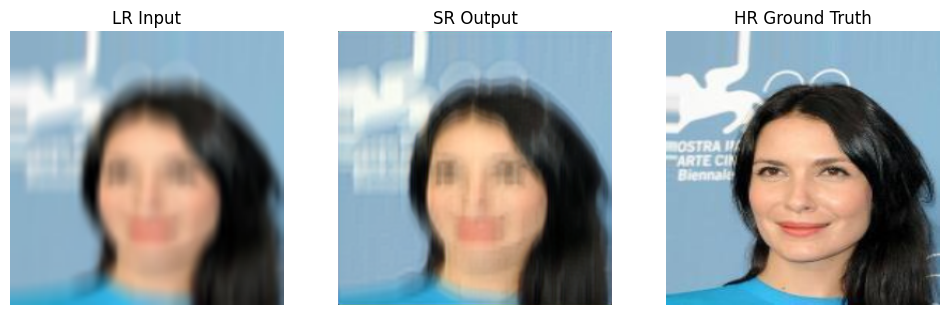

In [12]:
#folder = "/content/drive/MyDrive/celeba_128"  # change to your data folder
folder = "/content/drive/MyDrive/celeba_5k"  # change to your data folder
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SimpleMNTSR().to(device)
dataset = FaceDataset(folder)
loader = DataLoader(dataset, batch_size=8, shuffle=True)
losses = Losses(device)

train(model, loader, losses, device)
visualize(model, dataset, device)


In [11]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import numpy as np

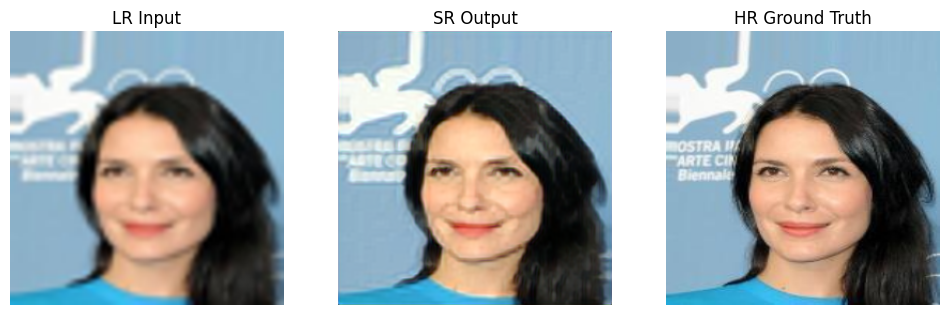

🔍 PSNR: 28.71 dB
🔍 SSIM: 0.8978
🔍 LPIPS: 0.0748
🔍 Identity Similarity: 0.9294


In [13]:
def visualize(model, dataset, device, losses=None, num=0):
    model.eval()
    with torch.no_grad():
        lr, hr = dataset[num]
        lr_batch = lr.unsqueeze(0).to(device)
        hr_batch = hr.unsqueeze(0).to(device)

        sr = model(lr_batch).squeeze().cpu()
        sr_batch = sr.unsqueeze(0).to(device)

        # Visuals
        fig, ax = plt.subplots(1, 3, figsize=(12, 4))
        ax[0].imshow(lr.permute(1, 2, 0))
        ax[0].set_title("LR Input")
        ax[1].imshow(sr.permute(1, 2, 0).clamp(0, 1))
        ax[1].set_title("SR Output")
        ax[2].imshow(hr.permute(1, 2, 0))
        ax[2].set_title("HR Ground Truth")
        for a in ax: a.axis('off')
        plt.show()

        # ---- Compute Metrics
        sr_np = sr.permute(1, 2, 0).numpy()
        hr_np = hr.permute(1, 2, 0).numpy()

        psnr_val = psnr(hr_np, sr_np, data_range=1.0)
        ssim_val = ssim(hr_np, sr_np, data_range=1.0, channel_axis=2, win_size=11)
        print(f"🔍 PSNR: {psnr_val:.2f} dB")
        print(f"🔍 SSIM: {ssim_val:.4f}")
        if losses is not None:
            lpips_val = losses.lpips(sr_batch, hr_batch).item()
            id_sim = torch.cosine_similarity(
                losses.id_net(sr_batch),
                losses.id_net(hr_batch)
            ).mean().item()
            print(f"🔍 LPIPS: {lpips_val:.4f}")
            print(f"🔍 Identity Similarity: {id_sim:.4f}")

visualize(model, dataset, device,losses=losses)

In [14]:
def visualize2(model, dataset, device, losses=None):
  model.eval()
  with torch.no_grad():
          psnr_val, ssim_val, lpips_val, id_sim = 0.0, 0.0, 0.0, 0.0
          for i in range(300):
            lr, hr = dataset[i]
            lr_batch = lr.unsqueeze(0).to(device)
            hr_batch = hr.unsqueeze(0).to(device)

            sr = model(lr_batch).squeeze().cpu()
            sr_batch = sr.unsqueeze(0).to(device)

            # ---- Compute Metrics
            sr_np = sr.permute(1, 2, 0).numpy()
            hr_np = hr.permute(1, 2, 0).numpy()

            psnr_val += psnr(hr_np, sr_np, data_range=1.0)
            ssim_val += ssim(hr_np, sr_np, data_range=1.0, channel_axis=2)
            lpips_val += losses.lpips(sr_batch, hr_batch).item()
            id_sim += torch.cosine_similarity(losses.id_net(sr_batch), losses.id_net(hr_batch)).mean().item()
          psnr_val /= 300
          ssim_val /= 300
          lpips_val /= 300
          id_sim /= 300
          print(f"PSNR: {psnr_val:.2f} dB")
          print(f"SSIM: {ssim_val:.4f}")
          print(f"LPIPS: {lpips_val:.4f}")
          print(f"Identity Similarity: {id_sim:.4f}")

In [15]:
test_folder = "/content/drive/MyDrive/celeba_test"  # change to your data folder
test_dataset = FaceDataset(test_folder)

In [16]:
visualize2(model, test_dataset, device,losses=losses)

PSNR: 24.65 dB
SSIM: 0.7180
LPIPS: 0.2519
Identity Similarity: 0.6423


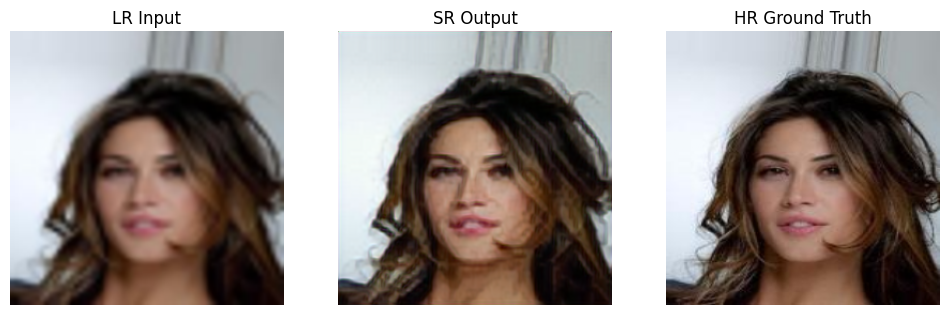

🔍 PSNR: 28.76 dB
🔍 SSIM: 0.8998
🔍 LPIPS: 0.0904
🔍 Identity Similarity: 0.8475


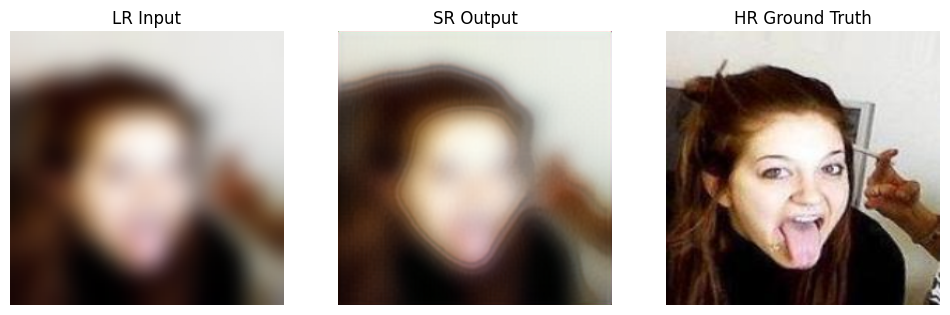

🔍 PSNR: 19.07 dB
🔍 SSIM: 0.5229
🔍 LPIPS: 0.4523
🔍 Identity Similarity: 0.4144


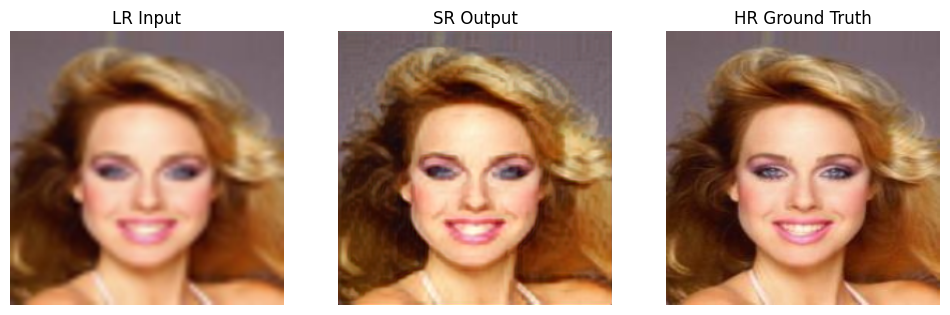

🔍 PSNR: 30.53 dB
🔍 SSIM: 0.9104
🔍 LPIPS: 0.0658
🔍 Identity Similarity: 0.9171


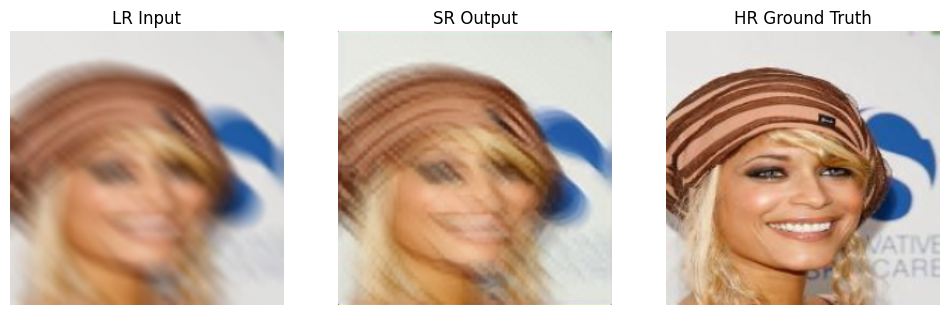

🔍 PSNR: 19.96 dB
🔍 SSIM: 0.5249
🔍 LPIPS: 0.2873
🔍 Identity Similarity: 0.3648


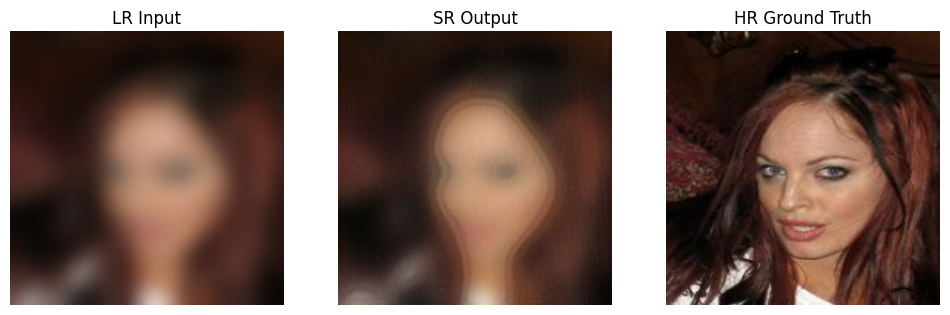

🔍 PSNR: 22.22 dB
🔍 SSIM: 0.5195
🔍 LPIPS: 0.4675
🔍 Identity Similarity: 0.3812


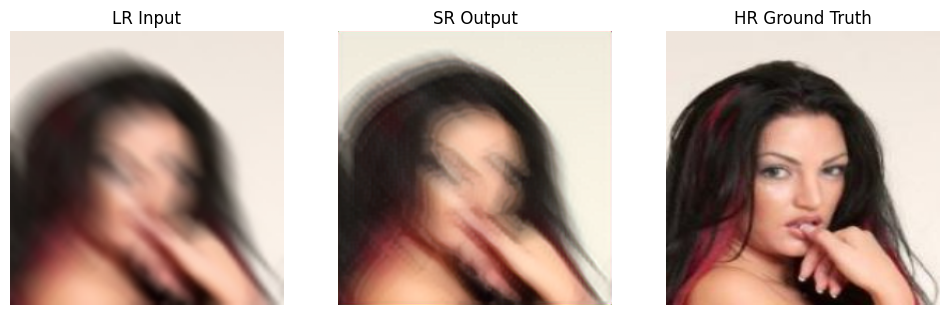

🔍 PSNR: 20.66 dB
🔍 SSIM: 0.6745
🔍 LPIPS: 0.2378
🔍 Identity Similarity: 0.5342


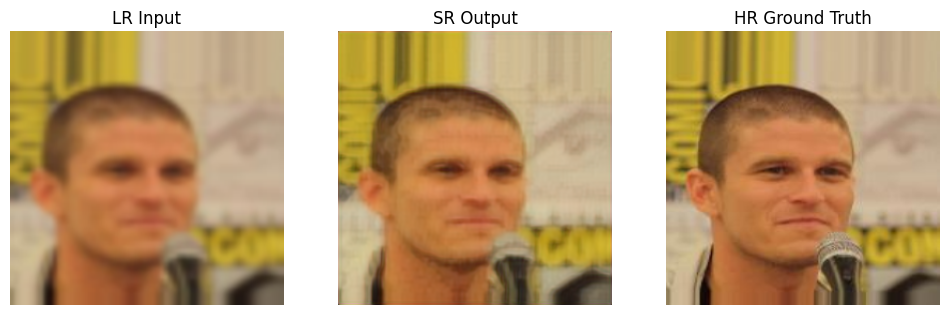

🔍 PSNR: 30.45 dB
🔍 SSIM: 0.9137
🔍 LPIPS: 0.0903
🔍 Identity Similarity: 0.9007


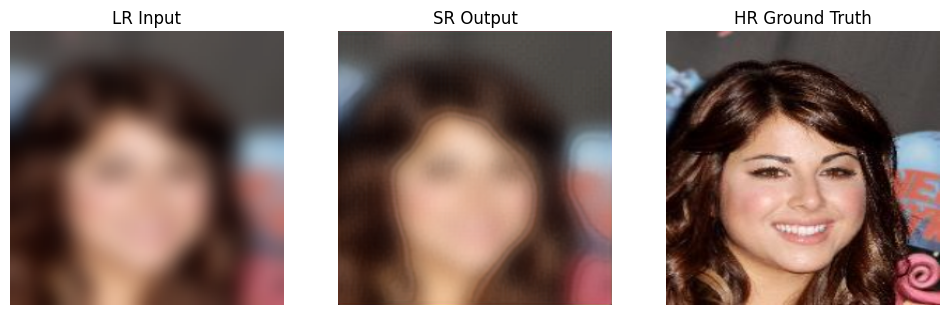

🔍 PSNR: 19.66 dB
🔍 SSIM: 0.4634
🔍 LPIPS: 0.5047
🔍 Identity Similarity: 0.5314


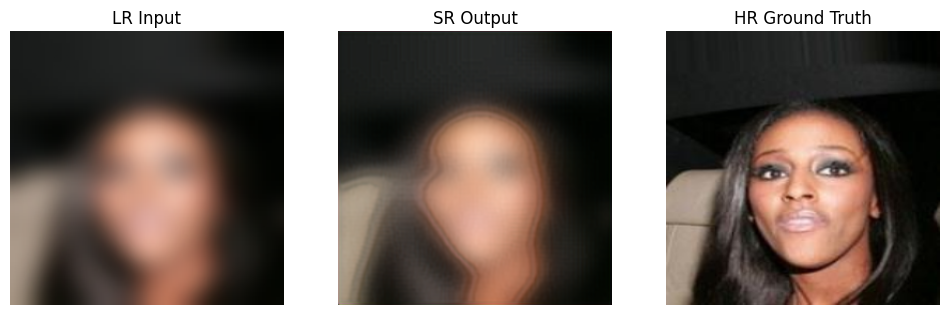

🔍 PSNR: 22.07 dB
🔍 SSIM: 0.6044
🔍 LPIPS: 0.3554
🔍 Identity Similarity: 0.3130


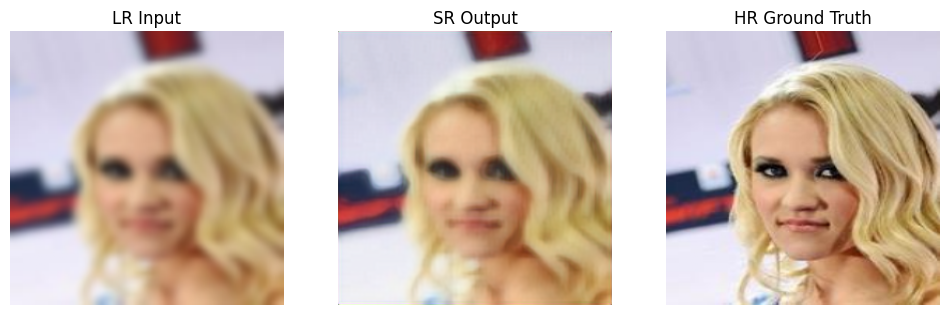

🔍 PSNR: 25.93 dB
🔍 SSIM: 0.8116
🔍 LPIPS: 0.2201
🔍 Identity Similarity: 0.8195


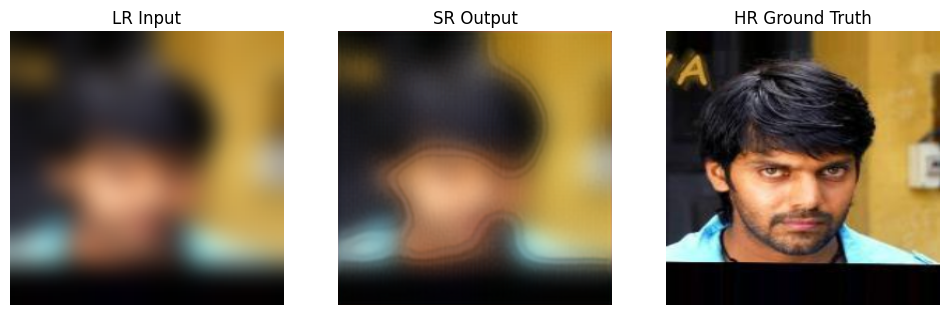

🔍 PSNR: 18.10 dB
🔍 SSIM: 0.4286
🔍 LPIPS: 0.4950
🔍 Identity Similarity: 0.3816


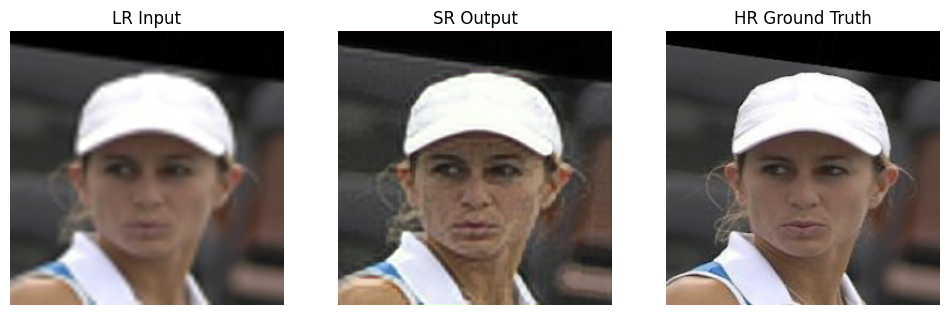

🔍 PSNR: 29.20 dB
🔍 SSIM: 0.8768
🔍 LPIPS: 0.1041
🔍 Identity Similarity: 0.8487


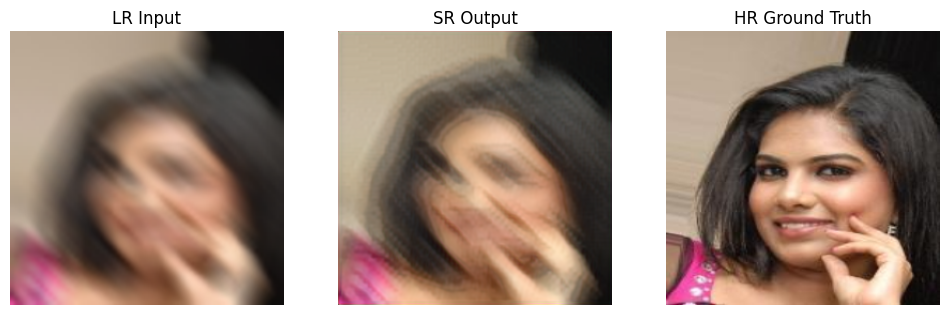

🔍 PSNR: 19.81 dB
🔍 SSIM: 0.5463
🔍 LPIPS: 0.3017
🔍 Identity Similarity: 0.3477


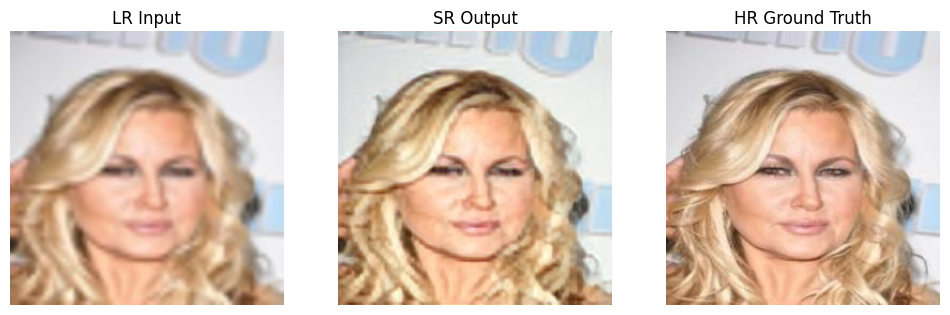

🔍 PSNR: 27.96 dB
🔍 SSIM: 0.9005
🔍 LPIPS: 0.0994
🔍 Identity Similarity: 0.9569


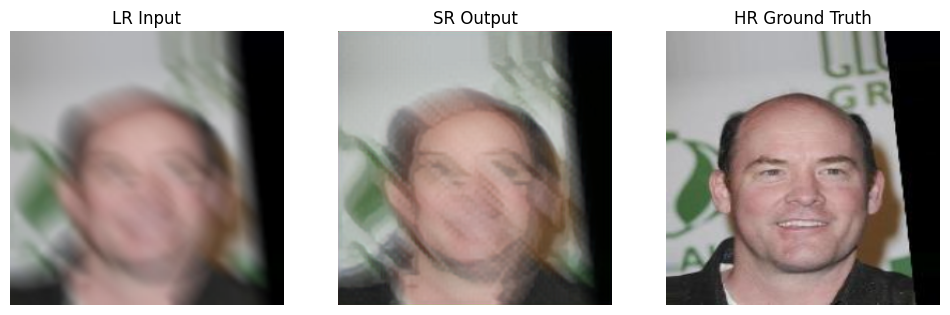

🔍 PSNR: 20.31 dB
🔍 SSIM: 0.5464
🔍 LPIPS: 0.3073
🔍 Identity Similarity: 0.1329


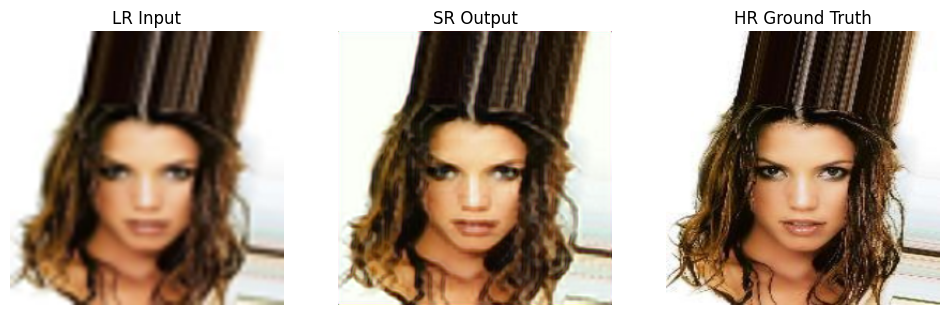

🔍 PSNR: 24.69 dB
🔍 SSIM: 0.8325
🔍 LPIPS: 0.1635
🔍 Identity Similarity: 0.9023


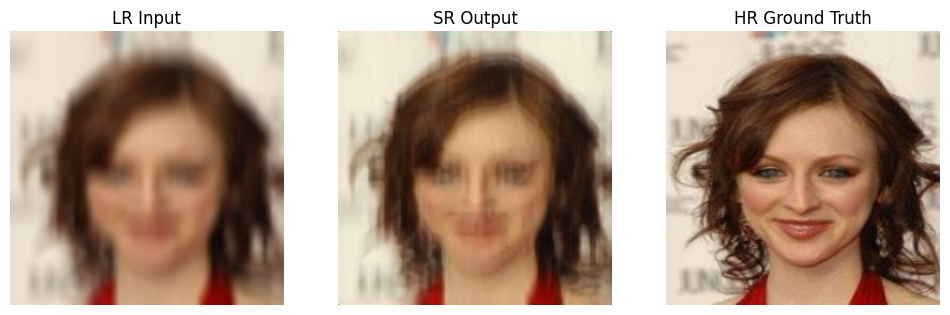

🔍 PSNR: 19.89 dB
🔍 SSIM: 0.5340
🔍 LPIPS: 0.3001
🔍 Identity Similarity: 0.6358


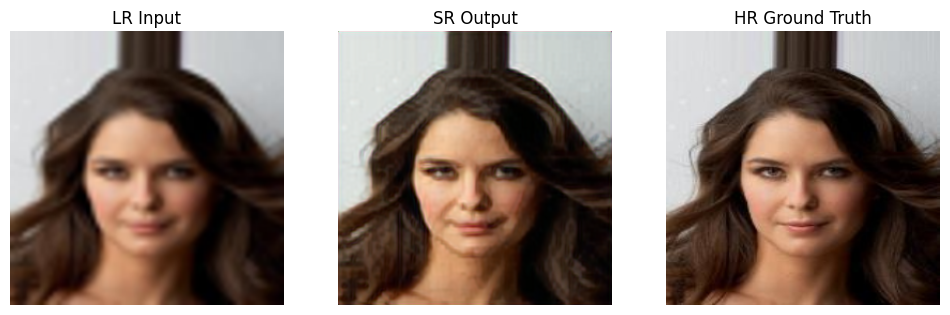

🔍 PSNR: 31.03 dB
🔍 SSIM: 0.9090
🔍 LPIPS: 0.0652
🔍 Identity Similarity: 0.9212


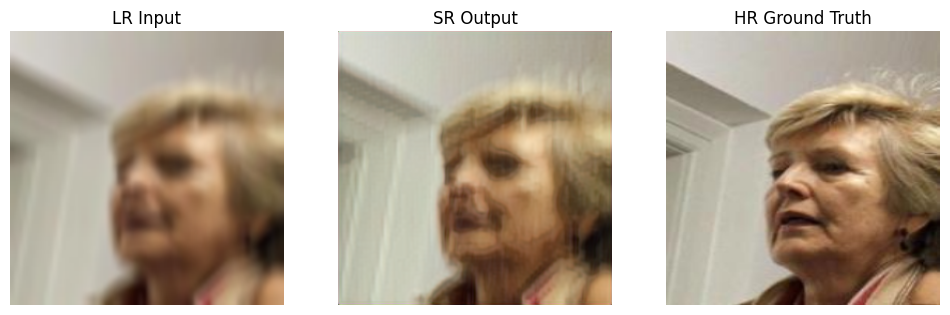

🔍 PSNR: 24.64 dB
🔍 SSIM: 0.7275
🔍 LPIPS: 0.2461
🔍 Identity Similarity: 0.2751


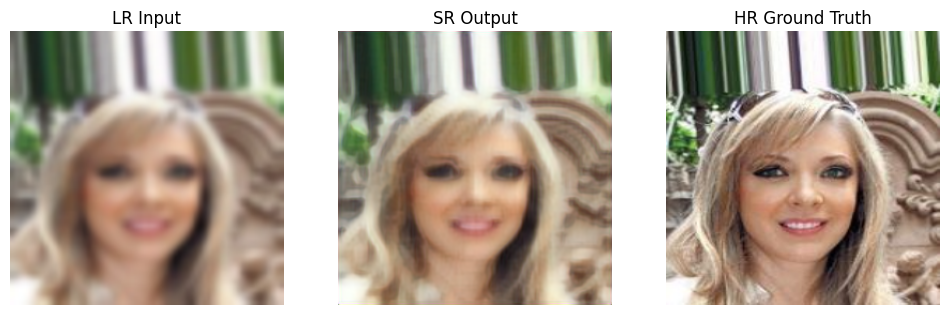

🔍 PSNR: 22.48 dB
🔍 SSIM: 0.7515
🔍 LPIPS: 0.2529
🔍 Identity Similarity: 0.9018


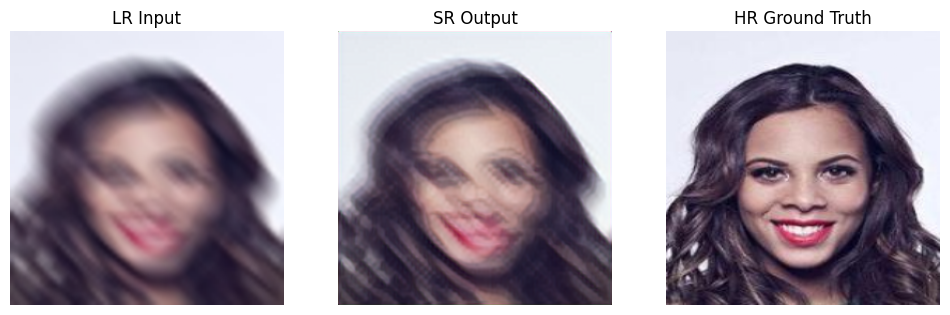

🔍 PSNR: 19.38 dB
🔍 SSIM: 0.5639
🔍 LPIPS: 0.2751
🔍 Identity Similarity: 0.4796


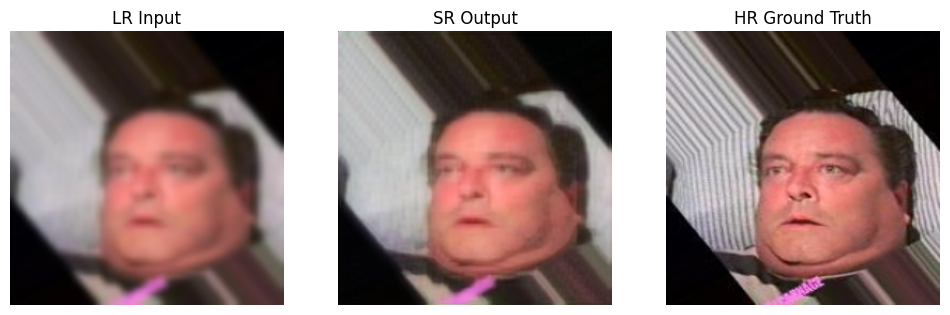

🔍 PSNR: 25.60 dB
🔍 SSIM: 0.7357
🔍 LPIPS: 0.2494
🔍 Identity Similarity: 0.8469


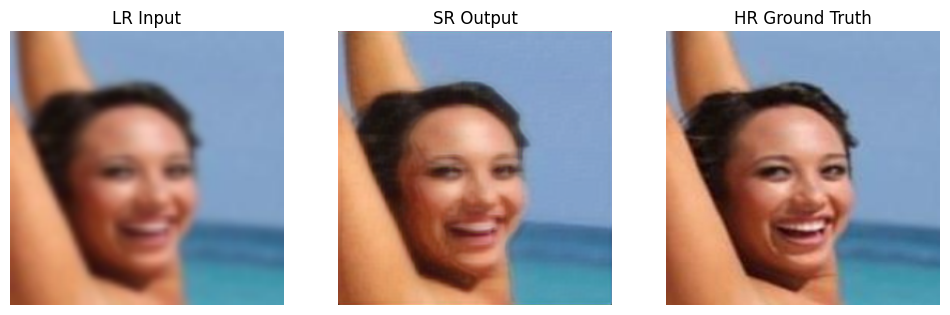

🔍 PSNR: 31.44 dB
🔍 SSIM: 0.9421
🔍 LPIPS: 0.0526
🔍 Identity Similarity: 0.9417


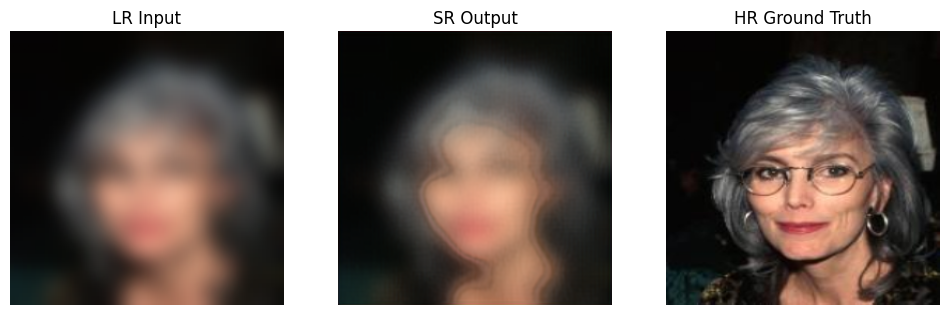

🔍 PSNR: 21.94 dB
🔍 SSIM: 0.5357
🔍 LPIPS: 0.4690
🔍 Identity Similarity: 0.2294


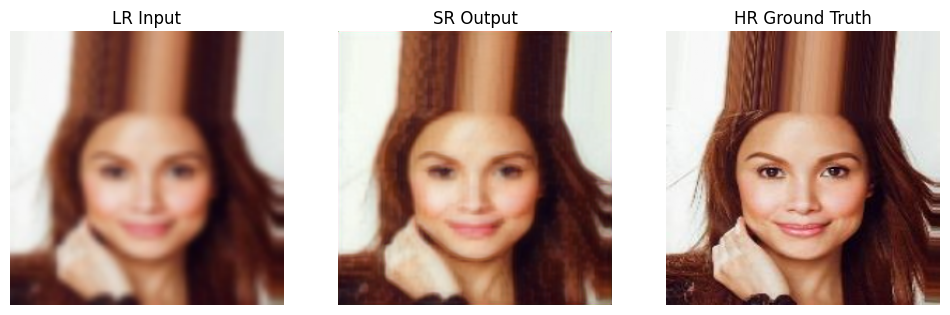

🔍 PSNR: 28.02 dB
🔍 SSIM: 0.8731
🔍 LPIPS: 0.1588
🔍 Identity Similarity: 0.9149


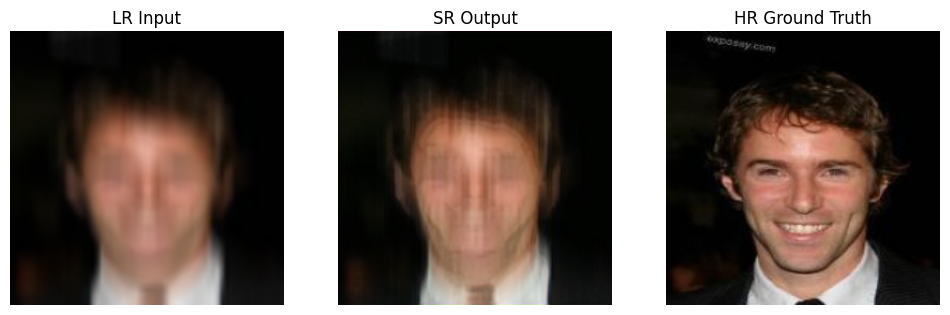

🔍 PSNR: 23.88 dB
🔍 SSIM: 0.6390
🔍 LPIPS: 0.3525
🔍 Identity Similarity: -0.0865


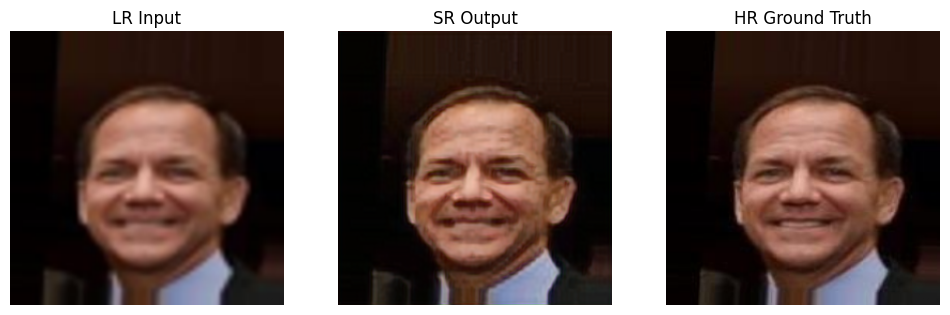

🔍 PSNR: 33.04 dB
🔍 SSIM: 0.9057
🔍 LPIPS: 0.0397
🔍 Identity Similarity: 0.9669


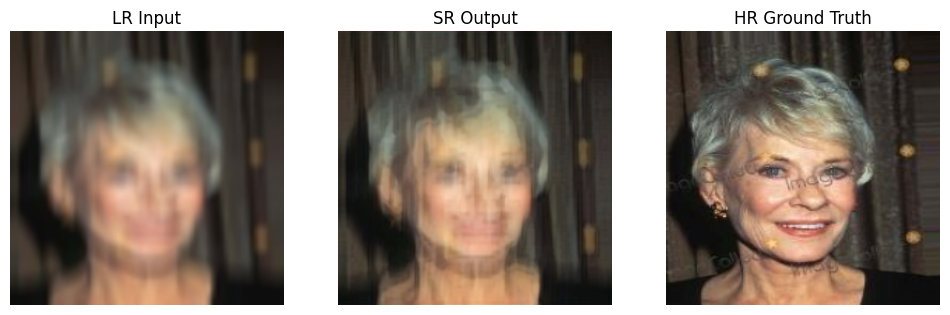

🔍 PSNR: 21.39 dB
🔍 SSIM: 0.4392
🔍 LPIPS: 0.3508
🔍 Identity Similarity: 0.1261


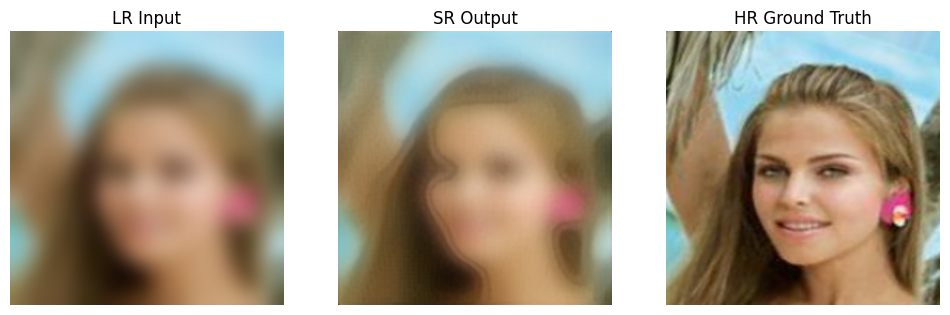

🔍 PSNR: 21.45 dB
🔍 SSIM: 0.5520
🔍 LPIPS: 0.4299
🔍 Identity Similarity: 0.1636


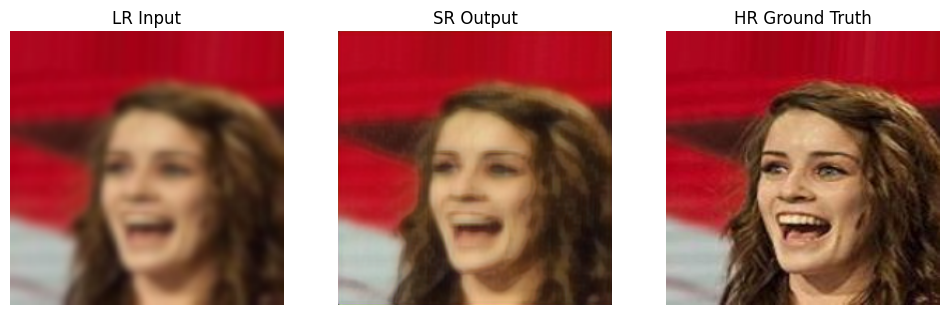

🔍 PSNR: 27.06 dB
🔍 SSIM: 0.8193
🔍 LPIPS: 0.1853
🔍 Identity Similarity: 0.8820


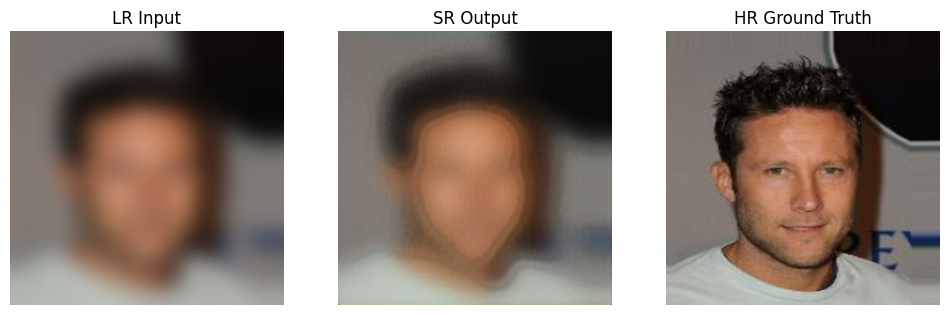

🔍 PSNR: 22.65 dB
🔍 SSIM: 0.6182
🔍 LPIPS: 0.4306
🔍 Identity Similarity: 0.2155


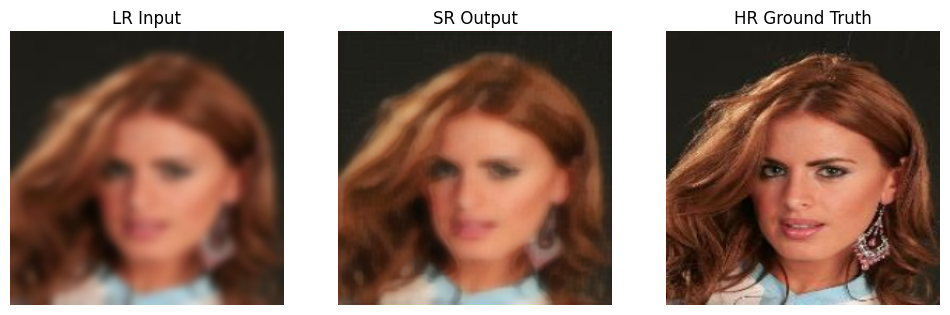

🔍 PSNR: 25.77 dB
🔍 SSIM: 0.7644
🔍 LPIPS: 0.3017
🔍 Identity Similarity: 0.7807


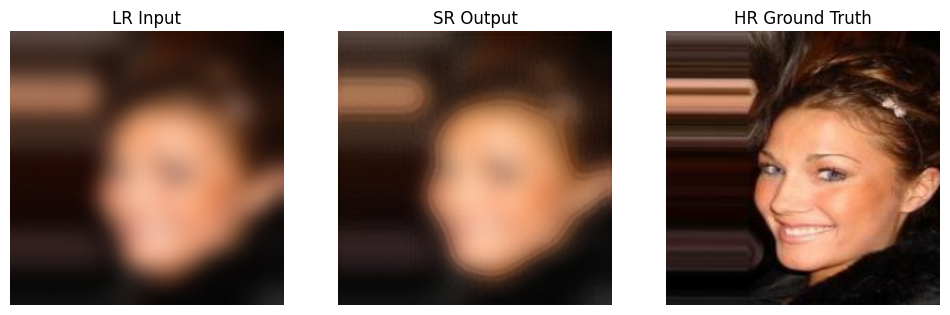

🔍 PSNR: 21.23 dB
🔍 SSIM: 0.5236
🔍 LPIPS: 0.4236
🔍 Identity Similarity: 0.2483


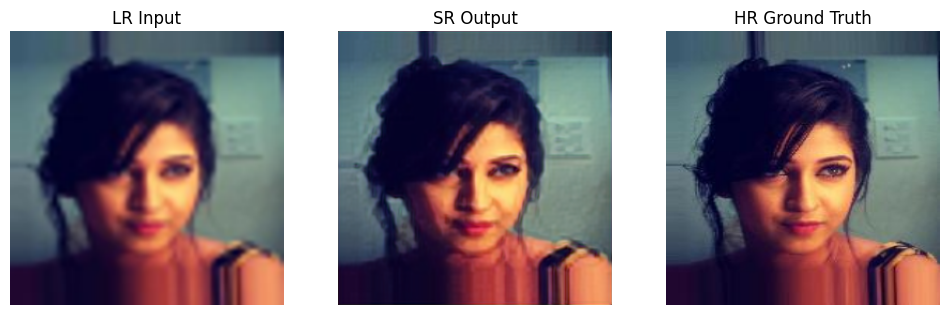

🔍 PSNR: 30.31 dB
🔍 SSIM: 0.9062
🔍 LPIPS: 0.0942
🔍 Identity Similarity: 0.9269


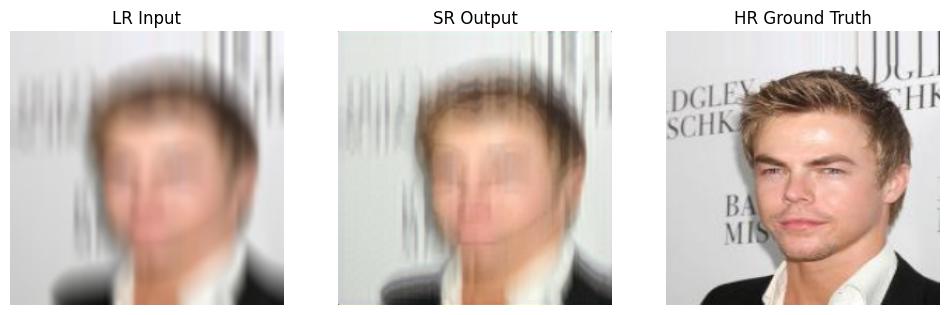

🔍 PSNR: 17.80 dB
🔍 SSIM: 0.4543
🔍 LPIPS: 0.3913
🔍 Identity Similarity: 0.0937


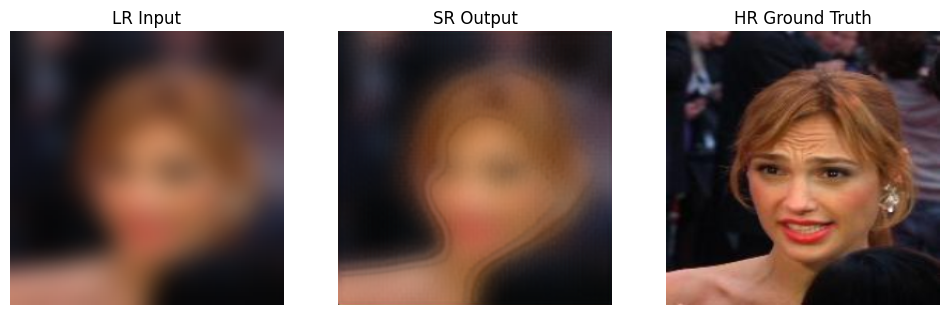

🔍 PSNR: 21.47 dB
🔍 SSIM: 0.4865
🔍 LPIPS: 0.5094
🔍 Identity Similarity: 0.2637


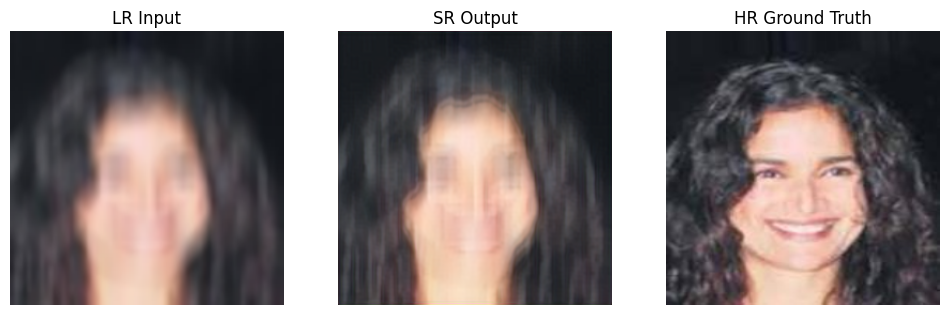

🔍 PSNR: 24.33 dB
🔍 SSIM: 0.6376
🔍 LPIPS: 0.3564
🔍 Identity Similarity: 0.3490


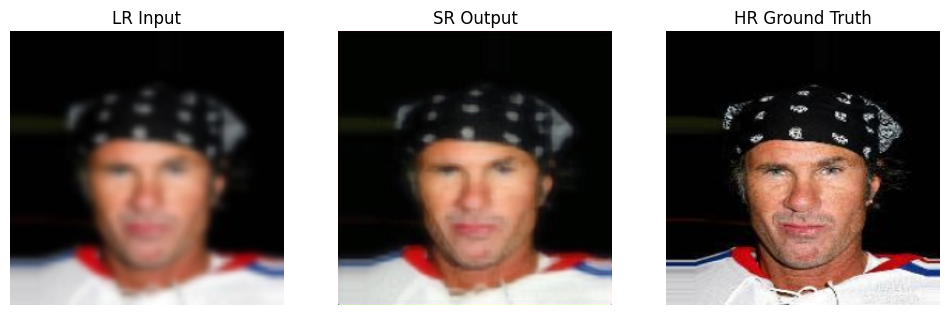

🔍 PSNR: 24.23 dB
🔍 SSIM: 0.7868
🔍 LPIPS: 0.2603
🔍 Identity Similarity: 0.8680


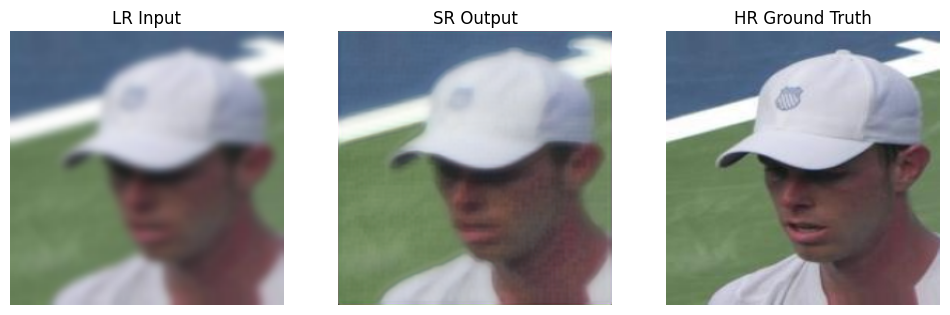

🔍 PSNR: 27.70 dB
🔍 SSIM: 0.8681
🔍 LPIPS: 0.1707
🔍 Identity Similarity: 0.7042


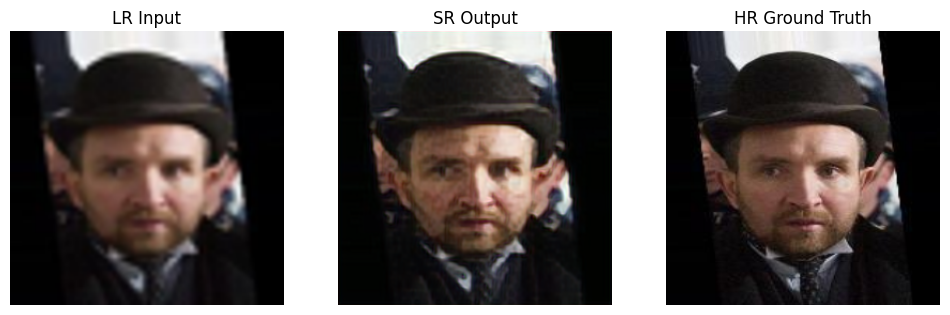

🔍 PSNR: 30.10 dB
🔍 SSIM: 0.8753
🔍 LPIPS: 0.0959
🔍 Identity Similarity: 0.9208


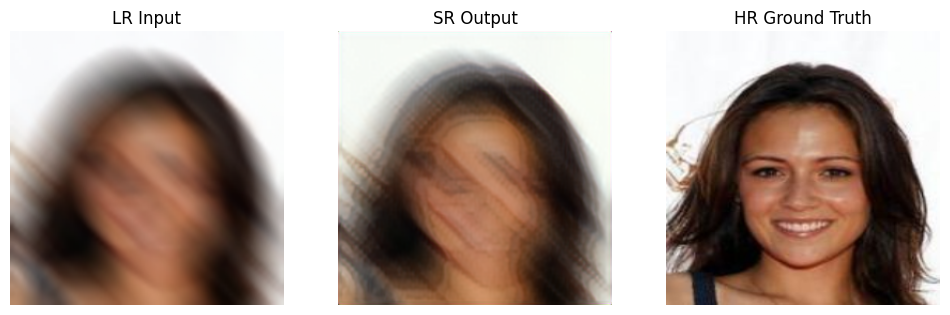

🔍 PSNR: 18.63 dB
🔍 SSIM: 0.5589
🔍 LPIPS: 0.3042
🔍 Identity Similarity: 0.3893


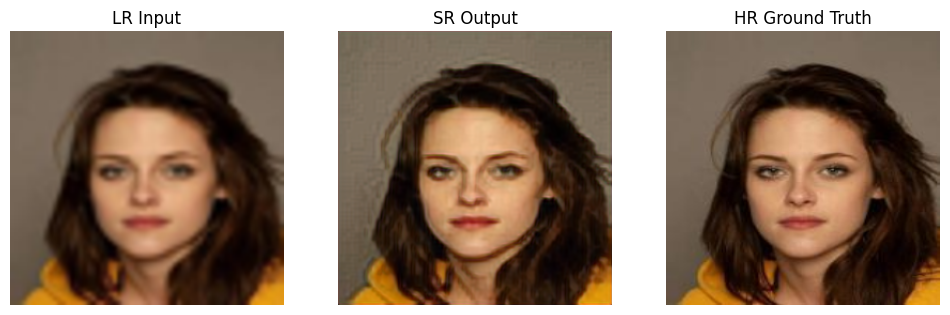

🔍 PSNR: 31.70 dB
🔍 SSIM: 0.9125
🔍 LPIPS: 0.0506
🔍 Identity Similarity: 0.9430


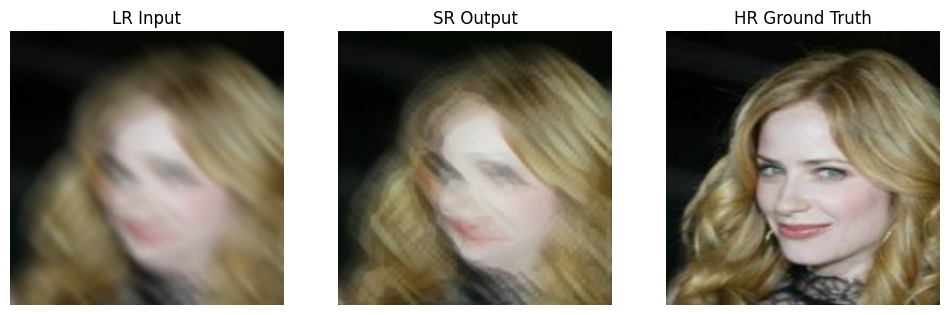

🔍 PSNR: 22.07 dB
🔍 SSIM: 0.5918
🔍 LPIPS: 0.2610
🔍 Identity Similarity: 0.4542


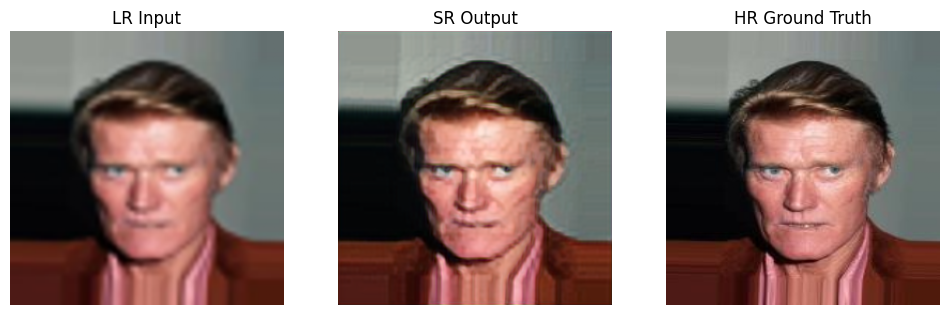

🔍 PSNR: 29.87 dB
🔍 SSIM: 0.9128
🔍 LPIPS: 0.0757
🔍 Identity Similarity: 0.9630


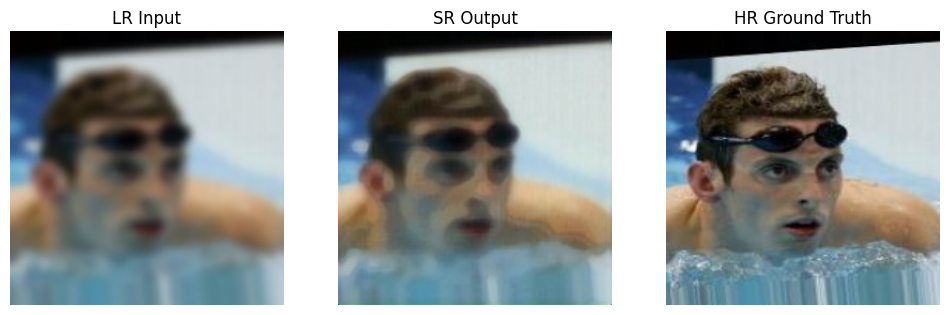

🔍 PSNR: 25.71 dB
🔍 SSIM: 0.7803
🔍 LPIPS: 0.2836
🔍 Identity Similarity: 0.7592


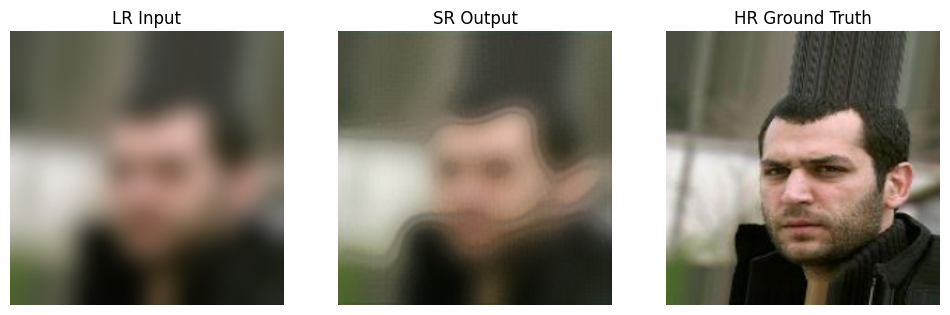

🔍 PSNR: 20.61 dB
🔍 SSIM: 0.5301
🔍 LPIPS: 0.4748
🔍 Identity Similarity: 0.4407


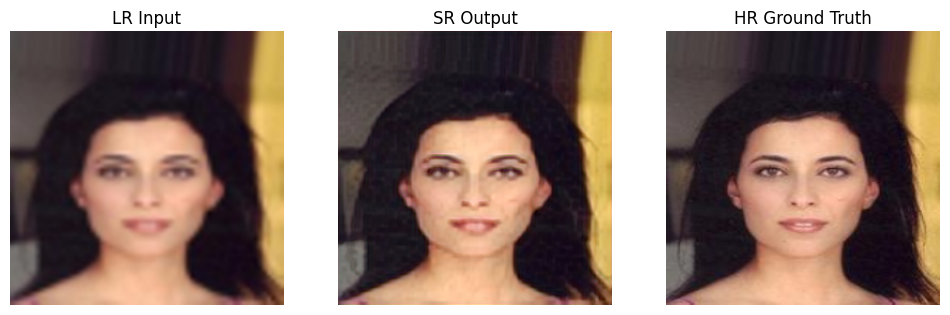

🔍 PSNR: 31.47 dB
🔍 SSIM: 0.9202
🔍 LPIPS: 0.0631
🔍 Identity Similarity: 0.9530


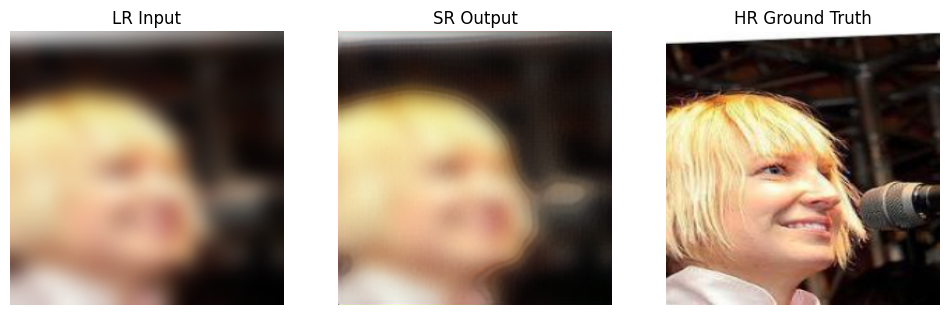

🔍 PSNR: 18.48 dB
🔍 SSIM: 0.4428
🔍 LPIPS: 0.5518
🔍 Identity Similarity: 0.2994


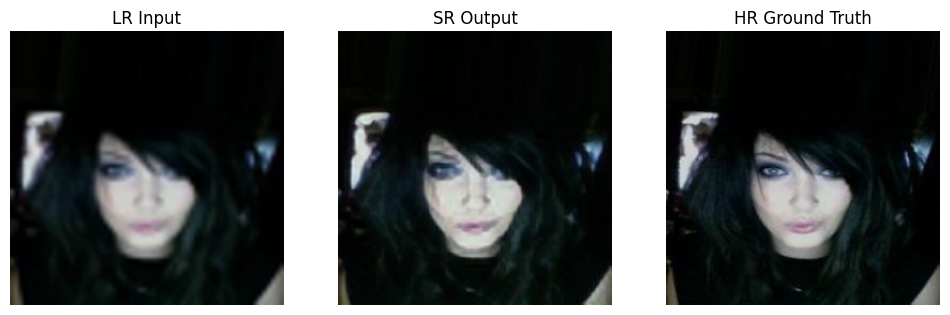

🔍 PSNR: 31.92 dB
🔍 SSIM: 0.9006
🔍 LPIPS: 0.0553
🔍 Identity Similarity: 0.8927


In [18]:
for i in range(1,50):
  visualize(model, test_dataset, device,losses, i)

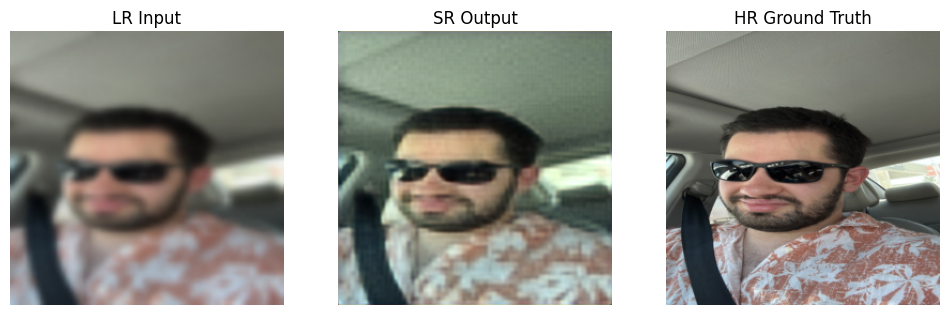

📊 PSNR: 24.51 dB
📊 SSIM: 0.7811
📊 LPIPS: 0.2823
📊 Identity Similarity: 0.8004


In [ ]:
# --- Inference on Custom Image from Google Drive

def run_on_test_image(img_path, model, losses, device):
    from PIL import Image
    import numpy as np
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim

    model.eval()

    # Load image
    img = Image.open(img_path).convert('RGB')
    tf = T.Compose([
        T.Resize((256, 256)),
        T.CenterCrop(256),
        T.ToTensor()
    ])

    hr = tf(img)
    lr = degrade(hr)

    with torch.no_grad():
        sr = model(lr.unsqueeze(0).to(device)).squeeze().cpu()

    # Visualize
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(lr.permute(1, 2, 0))
    ax[0].set_title("LR Input")
    ax[1].imshow(sr.permute(1, 2, 0).clamp(0, 1))
    ax[1].set_title("SR Output")
    ax[2].imshow(hr.permute(1, 2, 0))
    ax[2].set_title("HR Ground Truth")
    for a in ax: a.axis('off')
    plt.show()

    # Compute metrics
    sr_np = sr.permute(1, 2, 0).numpy()
    hr_np = hr.permute(1, 2, 0).numpy()
    psnr_val = psnr(hr_np, sr_np, data_range=1.0)
    ssim_val = ssim(hr_np, sr_np, data_range=1.0, channel_axis=2)
    lpips_val = losses.lpips(sr.unsqueeze(0).to(device), hr.unsqueeze(0).to(device)).item()
    id_sim = torch.cosine_similarity(
        losses.id_net(sr.unsqueeze(0).to(device)),
        losses.id_net(hr.unsqueeze(0).to(device))
    ).mean().item()

    print(f"📊 PSNR: {psnr_val:.2f} dB")
    print(f"📊 SSIM: {ssim_val:.4f}")
    print(f"📊 LPIPS: {lpips_val:.4f}")
    print(f"📊 Identity Similarity: {id_sim:.4f}")


# Run on your test image (adjust path if needed)
run_on_test_image('/content/drive/MyDrive/MyFaceTest.jpg', model, losses, device)


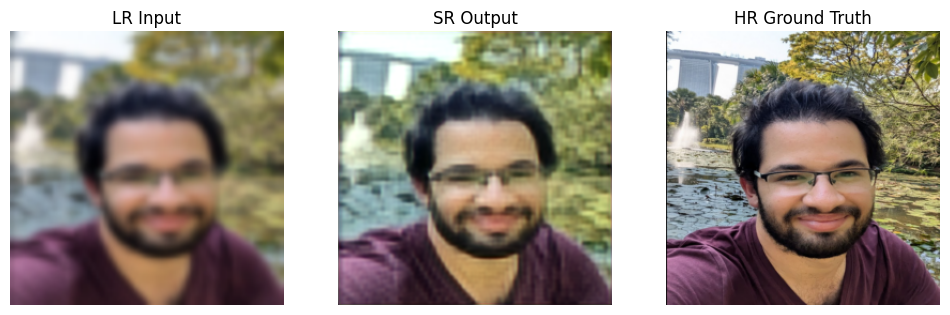

📊 PSNR: 21.46 dB
📊 SSIM: 0.6534
📊 LPIPS: 0.4087
📊 Identity Similarity: 0.8836


In [ ]:
# Run on your test image (adjust path if needed)
run_on_test_image('/content/drive/MyDrive/MyFaceTest2.jpg', model, losses, device)